In [158]:
import numpy as np
import pandas as pd
import datetime
import pickle
import logging
import re
import os
import string
import time
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
import pandas as pd
from gensim import matutils, models, utils, corpora
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import HdpModel, LdaModel, ensemblelda, TfidfModel, LsiModel
from gensim.corpora import Dictionary
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import nltk
nltk.download('stopwords')
from collections import Counter
import scipy.sparse
from multiprocessing import Pool

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Black\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Build Function to Measure Function Runtimes
_start_time = time.time()

def tic():
    global _start_time 
    _start_time = time.time()

def tac():
    t_sec = round(time.time() - _start_time)
    (t_min, t_sec) = divmod(t_sec,60)
    (t_hour,t_min) = divmod(t_min,60) 
    print('Time passed: {}hour:{}min:{}sec'.format(t_hour,t_min,t_sec))

In [3]:
def clean_text(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation, remove words containing numbers, and remove dots (except .com).'''
    text = text.lower()
    text = re.sub(r"[\[\]]", " ", text)
    text = re.sub('[%s]' % re.escape('!"#&()*+,-/:;<=>?@^_`{|}~'), ' ', text)
    text = re.sub('\n', ' ', text)
    text = re.sub(r'(?<!\w)(\.)((?!\bcom\b)\w)', r' \2', text)  # Remove dots except for .com

    return text

cleaner = lambda x: clean_text(x)

In [ ]:
def combine_pickles(start_year=2006, end_year=2023):
    # Initialize an empty dataframe
    combined_df = pd.DataFrame()

    # Loop over the range of years
    for year in range(start_year, end_year + 1):
        pickle_file = f"Clean_S&P{year}.pkl"

        # Check if the pickle file exists
        if os.path.exists(pickle_file):
            # Load the data from the pickle file
            df = pd.read_pickle(pickle_file)
            
            # Append the data to the combined dataframe
            combined_df = pd.concat([combined_df, df])
        else:
            print(f"Pickle file for year {year} does not exist.")
    
    # Save the combined dataframe to a new pickle file
    combined_df.to_pickle("Clean_S&P.pkl")
    print("Combined pickle file has been saved as Clean_S&P.pkl")

# Call the function
combine_pickles()


In [6]:
df = pd.read_pickle('Clean_S&P.pkl')

df.reset_index(inplace=True,drop=True)

df['content'] = df['content'].apply(cleaner)

# Convert 'mostimportantdateutc' column to datetime
df['mostimportantdateutc'] = pd.to_datetime(df['mostimportantdateutc'])

# Set 'GICS Sector', 'Symbol', and 'mostimportantdateutc' as the index
df.set_index(['GICS Sector', 'Symbol', 'mostimportantdateutc'], inplace=True)

# Sort the index
df.sort_index(inplace=True)

In [9]:
docs = df['content'].copy()

# Initialize a lemmatizer
lemmatizer = WordNetLemmatizer()

# Define a list of stop words
stop_words = set(stopwords.words('english'))

In [40]:
tic()
docs = docs.apply(cleaner)
tac()

Time passed: 0hour:5min:7sec


In [13]:
def preprocess(doc):
    # Check if doc is a string
    if not isinstance(doc, str):
        raise ValueError("doc must be a string")

    # Tokenize the document
    tokens = word_tokenize(doc)
    
    # Remove punctuation, numbers, convert to lowercase, and remove stop words
    tokens = [lemmatizer.lemmatize(token.lower()) for token in tokens if \
              token not in string.punctuation and not token.isdigit() and \
              token.lower() not in stop_words]
    
    return tokens

In [15]:
tic()
processed_list = [] 
processed_list += docs.apply(preprocess).tolist()
tac()

Time passed: 8hour:17min:32sec


In [49]:
tic()
# Filter words
filtered_words = [[word for word in doc if re.fullmatch(r'[A-Za-z]{4,}', word)] for doc in processed_list]

# Add the preprocessed text to the DataFrame
df['preprocessed_text'] = filtered_words
tac()

Time passed: 0hour:5min:8sec


In [ ]:
from datetime import datetime

## Function to assign topics to each document in a corpus

In [161]:
def assign_topics(df, lda_model, corpus):
    tic()
    # Initialize lists to store the topic assignments and probabilities
    topic_assignments = []
    topic_probabilities = []

    for doc in corpus:
        # Get the topics for the entire document
        doc_topics = lda_model.get_document_topics(doc, minimum_probability=0)
        
        # Sort the topics by probability. abs because LSI can have negative values
        doc_topics = sorted(doc_topics, key=lambda x: abs(x[1]), reverse=True)
        
        # Assign the topic with the highest probability
        topic_assignments.append(doc_topics[0][0])
        
        # Store the highest topic probability
        topic_probabilities.append(doc_topics[0][1])

    # Add the topic assignments and probabilities as new columns in the original DataFrame
    df['Topic'] = topic_assignments
    df['Topic_Probability'] = topic_probabilities
    tac()
    return df

In [166]:
def assign_topics_lsi(df, lsi_model, corpus):
    # Initialize lists to store the topic assignments and probabilities
    topic_assignments = []
    topic_probabilities = []

    for doc in corpus:
        # Get the topics for the entire document
        doc_topics = lsi_model[doc]
        
        # Sort the topics by absolute weight as LSI can have negative weights
        doc_topics = sorted(doc_topics, key=lambda x: abs(x[1]), reverse=True)
        
        # Assign the topic with the highest absolute weight
        topic_assignments.append(doc_topics[0][0])
        
        # Store the highest topic weight
        topic_probabilities.append(doc_topics[0][1])

    # Add the topic assignments and weights as new columns in the original DataFrame
    df['Topic'] = topic_assignments
    df['Topic_Weight'] = topic_probabilities

    return df


## Function to run (E)LDA/HDP modelling with BoW or TF-IDF Corpora

In [180]:
from gensim.models import TfidfModel, LdaModel, LsiModel, HdpModel, EnsembleLda
from gensim.corpora import Dictionary

def run_model(df, model_type, corpus_type, num_topics=2, passes=10, num_models=None):
    # Dictionary to hold models
    model_dict = {}

    # Group the DataFrame by GICS Sector
    grouped = df.groupby(level='GICS Sector')

    for sector, group in grouped:
        # Prepare the documents
        documents = group['preprocessed_text'].tolist()

        # Prepare the corpus
        dictionary = Dictionary(documents)
        bow_corpus = [dictionary.doc2bow(doc) for doc in documents]

        # Create either a TF-IDF or BoW corpus based on the input parameter
        if corpus_type == 'tfidf':
            tfidf = TfidfModel(bow_corpus)
            corpus = tfidf[bow_corpus]
        else:  # Assume BoW otherwise
            corpus = bow_corpus

        # Run the chosen model
        if model_type == 'lda':
            model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=passes)
        elif model_type == 'lsi':
            model = LsiModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        elif model_type == 'hdp':
            model = HdpModel(corpus=corpus, id2word=dictionary)
        elif model_type == 'elda':
            if num_models is None:
                raise ValueError("num_models parameter must be provided for ensemble LDA")
            model = ensemblelda.EnsembleLda(corpus=corpus, id2word=dictionary, num_topics=num_topics, num_models=num_models)
        else:
            raise ValueError("Invalid model_type parameter")

        # Save the model
        model.save(f"{sector}.model")

        # Assign the topics to the group
        if model_type in ['lda']:
            group = assign_topics(group, model, corpus)
        elif model_type == 'lsi':
            group = assign_topics_lsi(group, model, corpus)
        elif model_type == ['elda', 'hdp']:  # Skip topic assignment for ensemblelda
            group = group  

        # Store the model and the group with assigned topics
        model_dict[sector] = (model, group, dictionary, corpus)

    return model_dict


In [129]:
lda_tfidf = run_model(df, model_type='lda', corpus_type='tfidf', num_topics=4, passes=25, num_models=5)

2023-06-18 23:42:23,416 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-18 23:42:27,539 : INFO : built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)
2023-06-18 23:42:27,541 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)", 'datetime': '2023-06-18T23:42:27.541095', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-18 23:42:30,948 : INFO : collecting document frequencies
2023-06-18 23:42:30,950 : INFO : PROGRESS: processing document #0
2023-06-18 23:42:31,247 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1374 documents and 30317 features (1624374 matrix non-zeros)', 'datetime

2023-06-18 23:43:11,865 : INFO : topic #3 (0.250): 0.000*"oiba" + 0.000*"client" + 0.000*"fiscal" + 0.000*"oibda" + 0.000*"title" + 0.000*"outdoor" + 0.000*"agency" + 0.000*"theft" + 0.000*"cable" + 0.000*"meetic"
2023-06-18 23:43:11,867 : INFO : topic diff=0.068238, rho=0.377964
2023-06-18 23:43:17,199 : INFO : -10.301 per-word bound, 1261.8 perplexity estimate based on a held-out corpus of 1374 documents with 23296 words
2023-06-18 23:43:17,200 : INFO : PROGRESS: pass 6, at document #1374/1374
2023-06-18 23:43:18,157 : INFO : topic #0 (0.250): 0.002*"fiscal" + 0.002*"foxtel" + 0.002*"fifa" + 0.002*"title" + 0.002*"theft" + 0.002*"jones" + 0.002*"battlefield" + 0.002*"corp" + 0.001*"game" + 0.001*"grand"
2023-06-18 23:43:18,160 : INFO : topic #1 (0.250): 0.002*"wireless" + 0.001*"client" + 0.001*"customer" + 0.001*"agency" + 0.001*"disney" + 0.001*"postpaid" + 0.001*"cable" + 0.001*"broadband" + 0.001*"park" + 0.001*"spectrum"
2023-06-18 23:43:18,163 : INFO : topic #2 (0.250): 0.004*"

2023-06-18 23:43:55,891 : INFO : topic diff=0.015109, rho=0.267261
2023-06-18 23:44:01,207 : INFO : -10.217 per-word bound, 1190.2 perplexity estimate based on a held-out corpus of 1374 documents with 23296 words
2023-06-18 23:44:01,209 : INFO : PROGRESS: pass 13, at document #1374/1374
2023-06-18 23:44:02,157 : INFO : topic #0 (0.250): 0.003*"foxtel" + 0.002*"theft" + 0.002*"fifa" + 0.002*"battlefield" + 0.002*"jones" + 0.002*"fiscal" + 0.002*"corp" + 0.002*"rockstar" + 0.001*"title" + 0.001*"grand"
2023-06-18 23:44:02,163 : INFO : topic #1 (0.250): 0.002*"wireless" + 0.001*"client" + 0.001*"customer" + 0.001*"agency" + 0.001*"search" + 0.001*"google" + 0.001*"disney" + 0.001*"postpaid" + 0.001*"cable" + 0.001*"ebitda"
2023-06-18 23:44:02,166 : INFO : topic #2 (0.250): 0.002*"google" + 0.002*"sundar" + 0.002*"youtube" + 0.002*"ruth" + 0.001*"alphabet" + 0.001*"nikesh" + 0.001*"search" + 0.001*"omid" + 0.001*"adsense" + 0.001*"patrick"
2023-06-18 23:44:02,173 : INFO : topic #3 (0.250):

2023-06-18 23:44:45,016 : INFO : -10.189 per-word bound, 1167.4 perplexity estimate based on a held-out corpus of 1374 documents with 23296 words
2023-06-18 23:44:45,018 : INFO : PROGRESS: pass 20, at document #1374/1374
2023-06-18 23:44:45,939 : INFO : topic #0 (0.250): 0.003*"foxtel" + 0.002*"theft" + 0.002*"battlefield" + 0.002*"jones" + 0.002*"corp" + 0.002*"fifa" + 0.002*"rockstar" + 0.001*"madden" + 0.001*"grand" + 0.001*"sims"
2023-06-18 23:44:45,944 : INFO : topic #1 (0.250): 0.002*"wireless" + 0.002*"google" + 0.001*"search" + 0.001*"client" + 0.001*"customer" + 0.001*"agency" + 0.001*"disney" + 0.001*"fiscal" + 0.001*"postpaid" + 0.001*"ebitda"
2023-06-18 23:44:45,950 : INFO : topic #2 (0.250): 0.001*"sundar" + 0.001*"ruth" + 0.001*"alphabet" + 0.000*"philipp" + 0.000*"google" + 0.000*"youtube" + 0.000*"waymo" + 0.000*"omid" + 0.000*"pixel" + 0.000*"assistant"
2023-06-18 23:44:45,954 : INFO : topic #3 (0.250): 0.000*"oiba" + 0.000*"client" + 0.000*"fiscal" + 0.000*"title" + 0

Time passed: 0hour:0min:2sec


2023-06-18 23:45:25,621 : INFO : built Dictionary<45906 unique tokens: ['ability', 'able', 'accelerate', 'acceleration', 'acceptable']...> from 3215 documents (total 42079882 corpus positions)
2023-06-18 23:45:25,622 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<45906 unique tokens: ['ability', 'able', 'accelerate', 'acceleration', 'acceptable']...> from 3215 documents (total 42079882 corpus positions)", 'datetime': '2023-06-18T23:45:25.622135', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-18 23:45:33,926 : INFO : collecting document frequencies
2023-06-18 23:45:33,927 : INFO : PROGRESS: processing document #0
2023-06-18 23:45:34,581 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 3215 documents and 45906 features (3813538 matrix non-zeros)', 'datetime': '2023-06-18T23:45:34.581840', 'gensim': '4.3.1', 'python': '3.9.15 (main, 

2023-06-18 23:47:08,971 : INFO : topic #2 (0.250): 0.000*"carmax" + 0.000*"garmin" + 0.000*"ebay" + 0.000*"fitness" + 0.000*"aviation" + 0.000*"restaurant" + 0.000*"skype" + 0.000*"marine" + 0.000*"booking" + 0.000*"store"
2023-06-18 23:47:08,976 : INFO : topic #3 (0.250): 0.003*"norwegian" + 0.002*"ceramic" + 0.001*"cruise" + 0.001*"carpet" + 0.001*"mohawk" + 0.001*"laminate" + 0.001*"itinerary" + 0.001*"ship" + 0.000*"sailing" + 0.000*"breakaway"
2023-06-18 23:47:08,978 : INFO : topic diff=0.110241, rho=0.465873
2023-06-18 23:47:11,260 : INFO : PROGRESS: pass 3, at document #2000/3215
2023-06-18 23:47:12,591 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-18 23:47:12,605 : INFO : topic #0 (0.250): 0.001*"homeaway" + 0.000*"trivago" + 0.000*"haldex" + 0.000*"ford" + 0.000*"remy" + 0.000*"wahler" + 0.000*"borgwarner" + 0.000*"orbitz" + 0.000*"drivetrain" + 0.000*"vehicle"
2023-06-18 23:47:12,610 : INFO : topic #1 (0.250): 0.003*"store" + 0.002*"resta

2023-06-18 23:47:40,557 : INFO : topic #2 (0.250): 0.000*"tele" + 0.000*"atlas" + 0.000*"ofthe" + 0.000*"theline" + 0.000*"maptech" + 0.000*"ifyou" + 0.000*"ithink" + 0.000*"wehave" + 0.000*"atthe" + 0.000*"weare"
2023-06-18 23:47:40,562 : INFO : topic #3 (0.250): 0.000*"norwegian" + 0.000*"ceramic" + 0.000*"breakaway" + 0.000*"mohawk" + 0.000*"carpet" + 0.000*"marazzi" + 0.000*"laminate" + 0.000*"cruise" + 0.000*"bliss" + 0.000*"getaway"
2023-06-18 23:47:40,564 : INFO : topic diff=0.046608, rho=0.340849
2023-06-18 23:47:45,322 : INFO : -10.045 per-word bound, 1056.5 perplexity estimate based on a held-out corpus of 1215 documents with 19022 words
2023-06-18 23:47:45,324 : INFO : PROGRESS: pass 6, at document #3215/3215
2023-06-18 23:47:46,208 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-18 23:47:46,222 : INFO : topic #0 (0.250): 0.000*"homeaway" + 0.000*"trivago" + 0.000*"haldex" + 0.000*"ford" + 0.000*"remy" + 0.000*"wahler" + 0.000*"borgwarner"

2023-06-18 23:48:14,188 : INFO : topic #1 (0.250): 0.003*"store" + 0.001*"nike" + 0.001*"starbucks" + 0.001*"restaurant" + 0.001*"fiscal" + 0.001*"china" + 0.001*"booking" + 0.001*"cruise" + 0.001*"pizza" + 0.001*"hotel"
2023-06-18 23:48:14,192 : INFO : topic #2 (0.250): 0.000*"tele" + 0.000*"atlas" + 0.000*"ofthe" + 0.000*"theline" + 0.000*"maptech" + 0.000*"ifyou" + 0.000*"ithink" + 0.000*"wehave" + 0.000*"atthe" + 0.000*"weare"
2023-06-18 23:48:14,198 : INFO : topic #3 (0.250): 0.000*"norwegian" + 0.000*"breakaway" + 0.000*"ceramic" + 0.000*"mohawk" + 0.000*"carpet" + 0.000*"marazzi" + 0.000*"laminate" + 0.000*"cruise" + 0.000*"bliss" + 0.000*"getaway"
2023-06-18 23:48:14,199 : INFO : topic diff=0.036294, rho=0.293515
2023-06-18 23:48:16,486 : INFO : PROGRESS: pass 10, at document #2000/3215
2023-06-18 23:48:17,806 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-18 23:48:17,818 : INFO : topic #0 (0.250): 0.000*"homeaway" + 0.000*"trivago" + 0.000*

2023-06-18 23:48:45,892 : INFO : topic #1 (0.250): 0.003*"store" + 0.001*"restaurant" + 0.001*"hotel" + 0.001*"booking" + 0.001*"fiscal" + 0.001*"nike" + 0.001*"vehicle" + 0.001*"china" + 0.001*"cruise" + 0.001*"europe"
2023-06-18 23:48:45,897 : INFO : topic #2 (0.250): 0.000*"tele" + 0.000*"atlas" + 0.000*"ofthe" + 0.000*"theline" + 0.000*"maptech" + 0.000*"ifyou" + 0.000*"ithink" + 0.000*"wehave" + 0.000*"atthe" + 0.000*"weare"
2023-06-18 23:48:45,902 : INFO : topic #3 (0.250): 0.000*"norwegian" + 0.000*"breakaway" + 0.000*"ceramic" + 0.000*"mohawk" + 0.000*"carpet" + 0.000*"marazzi" + 0.000*"laminate" + 0.000*"cruise" + 0.000*"bliss" + 0.000*"getaway"
2023-06-18 23:48:45,904 : INFO : topic diff=0.031277, rho=0.253124
2023-06-18 23:48:50,685 : INFO : -10.033 per-word bound, 1047.6 perplexity estimate based on a held-out corpus of 1215 documents with 19022 words
2023-06-18 23:48:50,686 : INFO : PROGRESS: pass 13, at document #3215/3215
2023-06-18 23:48:51,566 : INFO : merging changes 

2023-06-18 23:49:19,505 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-18 23:49:19,519 : INFO : topic #0 (0.250): 0.000*"homeaway" + 0.000*"dickerson" + 0.000*"salen" + 0.000*"beugelmans" + 0.000*"invertex" + 0.000*"joyride" + 0.000*"pavillion" + 0.000*"blackbird" + 0.000*"verisign" + 0.000*"prerecorded"
2023-06-18 23:49:19,524 : INFO : topic #1 (0.250): 0.003*"store" + 0.001*"nike" + 0.001*"restaurant" + 0.001*"starbucks" + 0.001*"fiscal" + 0.001*"china" + 0.001*"booking" + 0.001*"cruise" + 0.001*"pizza" + 0.001*"hotel"
2023-06-18 23:49:19,530 : INFO : topic #2 (0.250): 0.000*"tele" + 0.000*"atlas" + 0.000*"ofthe" + 0.000*"theline" + 0.000*"maptech" + 0.000*"ifyou" + 0.000*"ithink" + 0.000*"wehave" + 0.000*"atthe" + 0.000*"weare"
2023-06-18 23:49:19,535 : INFO : topic #3 (0.250): 0.000*"norwegian" + 0.000*"breakaway" + 0.000*"ceramic" + 0.000*"mohawk" + 0.000*"carpet" + 0.000*"marazzi" + 0.000*"bliss" + 0.000*"laminate" + 0.000*"cruise" + 0.000*"ge

2023-06-18 23:49:47,219 : INFO : topic diff=0.025543, rho=0.215128
2023-06-18 23:49:49,462 : INFO : PROGRESS: pass 20, at document #2000/3215
2023-06-18 23:49:50,760 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-18 23:49:50,774 : INFO : topic #0 (0.250): 0.000*"dickerson" + 0.000*"salen" + 0.000*"beugelmans" + 0.000*"blackbird" + 0.000*"verisign" + 0.000*"prerecorded" + 0.000*"ripps" + 0.000*"xwalk" + 0.000*"ratcliff" + 0.000*"khajuria"
2023-06-18 23:49:50,779 : INFO : topic #1 (0.250): 0.003*"store" + 0.001*"restaurant" + 0.001*"hotel" + 0.001*"booking" + 0.001*"nike" + 0.001*"fiscal" + 0.001*"china" + 0.001*"vehicle" + 0.001*"cruise" + 0.001*"europe"
2023-06-18 23:49:50,782 : INFO : topic #2 (0.250): 0.000*"tele" + 0.000*"atlas" + 0.000*"ofthe" + 0.000*"theline" + 0.000*"maptech" + 0.000*"ifyou" + 0.000*"ithink" + 0.000*"wehave" + 0.000*"atthe" + 0.000*"weare"
2023-06-18 23:49:50,789 : INFO : topic #3 (0.250): 0.000*"norwegian" + 0.000*"dickerson

2023-06-18 23:50:18,497 : INFO : topic #3 (0.250): 0.000*"dickerson" + 0.000*"salen" + 0.000*"beugelmans" + 0.000*"blackbird" + 0.000*"verisign" + 0.000*"prerecorded" + 0.000*"ratcliff" + 0.000*"ripps" + 0.000*"xwalk" + 0.000*"khajuria"
2023-06-18 23:50:18,499 : INFO : topic diff=0.023555, rho=0.197613
2023-06-18 23:50:23,211 : INFO : -10.026 per-word bound, 1042.6 perplexity estimate based on a held-out corpus of 1215 documents with 19022 words
2023-06-18 23:50:23,213 : INFO : PROGRESS: pass 23, at document #3215/3215
2023-06-18 23:50:24,080 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-18 23:50:24,095 : INFO : topic #0 (0.250): 0.000*"dickerson" + 0.000*"salen" + 0.000*"beugelmans" + 0.000*"invertex" + 0.000*"blackbird" + 0.000*"verisign" + 0.000*"joyride" + 0.000*"pavillion" + 0.000*"prerecorded" + 0.000*"ratcliff"
2023-06-18 23:50:24,099 : INFO : topic #1 (0.250): 0.003*"store" + 0.001*"nike" + 0.001*"restaurant" + 0.001*"starbucks" + 0.001*"fi

Time passed: 0hour:0min:5sec


2023-06-18 23:50:46,023 : INFO : built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)
2023-06-18 23:50:46,025 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)", 'datetime': '2023-06-18T23:50:46.025726', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-18 23:50:52,140 : INFO : collecting document frequencies
2023-06-18 23:50:52,141 : INFO : PROGRESS: processing document #0
2023-06-18 23:50:52,622 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 2329 documents and 36433 features (2762464 matrix non-zeros)', 'datetime': '2023-06-18T23:50:52.622003', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24

2023-06-18 23:51:10,446 : INFO : topic #2 (0.250): 0.000*"smucker" + 0.000*"folgers" + 0.000*"yoplait" + 0.000*"cereal" + 0.000*"coffee" + 0.000*"yogurt" + 0.000*"vince" + 0.000*"dunkin" + 0.000*"mart" + 0.000*"belgya"
2023-06-18 23:51:10,449 : INFO : topic #3 (0.250): 0.005*"guest" + 0.003*"coors" + 0.003*"walmart" + 0.003*"chicken" + 0.002*"pharmacy" + 0.002*"beef" + 0.002*"walgreens" + 0.002*"tyson" + 0.002*"pork" + 0.002*"molson"
2023-06-18 23:51:10,453 : INFO : topic diff=0.125931, rho=0.490025
2023-06-18 23:51:12,720 : INFO : PROGRESS: pass 3, at document #2000/2329
2023-06-18 23:51:14,150 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-18 23:51:14,166 : INFO : topic #0 (0.250): 0.001*"mccormick" + 0.000*"industrial" + 0.000*"sysco" + 0.000*"spice" + 0.000*"seasoning" + 0.000*"alan" + 0.000*"wapc" + 0.000*"kohinoor" + 0.000*"herb" + 0.000*"kami"
2023-06-18 23:51:14,172 : INFO : topic #1 (0.250): 0.000*"muhtar" + 0.000*"joel" + 0.000*"sysco" + 0

2023-06-18 23:51:31,301 : INFO : topic #2 (0.250): 0.000*"smucker" + 0.000*"folgers" + 0.000*"yoplait" + 0.000*"cereal" + 0.000*"coffee" + 0.000*"yogurt" + 0.000*"vince" + 0.000*"dunkin" + 0.000*"mart" + 0.000*"belgya"
2023-06-18 23:51:31,306 : INFO : topic #3 (0.250): 0.003*"guest" + 0.002*"coors" + 0.002*"walmart" + 0.002*"chicken" + 0.001*"pharmacy" + 0.001*"fiscal" + 0.001*"beef" + 0.001*"store" + 0.001*"walgreens" + 0.001*"pork"
2023-06-18 23:51:31,308 : INFO : topic diff=0.052073, rho=0.349974
2023-06-18 23:51:32,742 : INFO : -9.859 per-word bound, 928.8 perplexity estimate based on a held-out corpus of 329 documents with 4912 words
2023-06-18 23:51:32,745 : INFO : PROGRESS: pass 6, at document #2329/2329
2023-06-18 23:51:33,067 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-18 23:51:33,080 : INFO : topic #0 (0.250): 0.000*"mccormick" + 0.000*"industrial" + 0.000*"wapc" + 0.000*"sysco" + 0.000*"spice" + 0.000*"kohinoor" + 0.000*"seasoning" + 0.

2023-06-18 23:51:49,241 : INFO : topic #2 (0.250): 0.000*"smucker" + 0.000*"folgers" + 0.000*"yoplait" + 0.000*"cereal" + 0.000*"coffee" + 0.000*"yogurt" + 0.000*"vince" + 0.000*"dunkin" + 0.000*"mart" + 0.000*"belgya"
2023-06-18 23:51:49,246 : INFO : topic #3 (0.250): 0.004*"guest" + 0.003*"coors" + 0.002*"walmart" + 0.002*"chicken" + 0.002*"pharmacy" + 0.002*"beef" + 0.002*"walgreens" + 0.002*"tyson" + 0.002*"pork" + 0.001*"molson"
2023-06-18 23:51:49,249 : INFO : topic diff=0.040352, rho=0.299282
2023-06-18 23:51:51,493 : INFO : PROGRESS: pass 10, at document #2000/2329
2023-06-18 23:51:52,797 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-18 23:51:52,809 : INFO : topic #0 (0.250): 0.000*"mccormick" + 0.000*"industrial" + 0.000*"wapc" + 0.000*"sysco" + 0.000*"spice" + 0.000*"kohinoor" + 0.000*"seasoning" + 0.000*"alan" + 0.000*"kami" + 0.000*"herb"
2023-06-18 23:51:52,814 : INFO : topic #1 (0.250): 0.000*"muhtar" + 0.000*"joel" + 0.000*"sysco" + 

2023-06-18 23:52:08,944 : INFO : topic #2 (0.250): 0.000*"smucker" + 0.000*"folgers" + 0.000*"yoplait" + 0.000*"cereal" + 0.000*"coffee" + 0.000*"yogurt" + 0.000*"tock" + 0.000*"vince" + 0.000*"premerger" + 0.000*"dunkin"
2023-06-18 23:52:08,951 : INFO : topic #3 (0.250): 0.003*"guest" + 0.002*"coors" + 0.002*"walmart" + 0.002*"chicken" + 0.002*"pharmacy" + 0.001*"fiscal" + 0.001*"beef" + 0.001*"store" + 0.001*"walgreens" + 0.001*"pork"
2023-06-18 23:52:08,952 : INFO : topic diff=0.034632, rho=0.256795
2023-06-18 23:52:10,388 : INFO : -9.841 per-word bound, 917.2 perplexity estimate based on a held-out corpus of 329 documents with 4912 words
2023-06-18 23:52:10,390 : INFO : PROGRESS: pass 13, at document #2329/2329
2023-06-18 23:52:10,708 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-18 23:52:10,720 : INFO : topic #0 (0.250): 0.000*"mccormick" + 0.000*"industrial" + 0.000*"wapc" + 0.000*"sysco" + 0.000*"spice" + 0.000*"kohinoor" + 0.000*"seasoning" 

2023-06-18 23:52:38,905 : INFO : topic #1 (0.250): 0.000*"dunnewold" + 0.000*"disseminated" + 0.000*"castering" + 0.000*"tock" + 0.000*"spradley" + 0.000*"surmising" + 0.000*"schraft" + 0.000*"afield" + 0.000*"mathew" + 0.000*"premerger"
2023-06-18 23:52:38,910 : INFO : topic #2 (0.250): 0.000*"dunnewold" + 0.000*"castering" + 0.000*"disseminated" + 0.000*"tock" + 0.000*"spradley" + 0.000*"surmising" + 0.000*"schraft" + 0.000*"afield" + 0.000*"mathew" + 0.000*"premerger"
2023-06-18 23:52:38,916 : INFO : topic #3 (0.250): 0.004*"guest" + 0.003*"coors" + 0.002*"walmart" + 0.002*"chicken" + 0.002*"pharmacy" + 0.002*"beef" + 0.002*"walgreens" + 0.002*"tyson" + 0.001*"pork" + 0.001*"fiscal"
2023-06-18 23:52:38,918 : INFO : topic diff=0.030576, rho=0.234633
2023-06-18 23:52:41,163 : INFO : PROGRESS: pass 17, at document #2000/2329
2023-06-18 23:52:42,463 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-18 23:52:42,475 : INFO : topic #0 (0.250): 0.000*"tock"

2023-06-18 23:52:58,609 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-18 23:52:58,622 : INFO : topic #0 (0.250): 0.000*"tock" + 0.000*"premerger" + 0.000*"skyline" + 0.000*"bogo" + 0.000*"eighty" + 0.000*"royale" + 0.000*"bondholder" + 0.000*"violet" + 0.000*"spiralized" + 0.000*"divesture"
2023-06-18 23:52:58,626 : INFO : topic #1 (0.250): 0.000*"tock" + 0.000*"premerger" + 0.000*"skyline" + 0.000*"bogo" + 0.000*"eighty" + 0.000*"royale" + 0.000*"bondholder" + 0.000*"violet" + 0.000*"spiralized" + 0.000*"divesture"
2023-06-18 23:52:58,632 : INFO : topic #2 (0.250): 0.000*"tock" + 0.000*"premerger" + 0.000*"skyline" + 0.000*"bogo" + 0.000*"eighty" + 0.000*"royale" + 0.000*"bondholder" + 0.000*"violet" + 0.000*"spiralized" + 0.000*"divesture"
2023-06-18 23:52:58,638 : INFO : topic #3 (0.250): 0.003*"guest" + 0.002*"coors" + 0.002*"walmart" + 0.002*"chicken" + 0.002*"pharmacy" + 0.001*"beef" + 0.001*"fiscal" + 0.001*"store" + 0.001*"walgreens" + 0.00

2023-06-18 23:53:14,803 : INFO : topic diff=0.025849, rho=0.199345
2023-06-18 23:53:16,235 : INFO : -9.831 per-word bound, 910.7 perplexity estimate based on a held-out corpus of 329 documents with 4912 words
2023-06-18 23:53:16,236 : INFO : PROGRESS: pass 23, at document #2329/2329
2023-06-18 23:53:16,556 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-18 23:53:16,568 : INFO : topic #0 (0.250): 0.000*"dunnewold" + 0.000*"castering" + 0.000*"disseminated" + 0.000*"tock" + 0.000*"afield" + 0.000*"surmising" + 0.000*"spradley" + 0.000*"premerger" + 0.000*"schraft" + 0.000*"mathew"
2023-06-18 23:53:16,573 : INFO : topic #1 (0.250): 0.000*"disseminated" + 0.000*"castering" + 0.000*"dunnewold" + 0.000*"tock" + 0.000*"afield" + 0.000*"surmising" + 0.000*"spradley" + 0.000*"premerger" + 0.000*"schraft" + 0.000*"mathew"
2023-06-18 23:53:16,579 : INFO : topic #2 (0.250): 0.000*"castering" + 0.000*"dunnewold" + 0.000*"disseminated" + 0.000*"tock" + 0.000*"afiel

Time passed: 0hour:0min:4sec


2023-06-18 23:53:29,639 : INFO : built Dictionary<29118 unique tokens: ['able', 'absent', 'absorbing', 'accelerating', 'acceleration']...> from 1343 documents (total 16601539 corpus positions)
2023-06-18 23:53:29,640 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<29118 unique tokens: ['able', 'absent', 'absorbing', 'accelerating', 'acceleration']...> from 1343 documents (total 16601539 corpus positions)", 'datetime': '2023-06-18T23:53:29.640998', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-18 23:53:32,869 : INFO : collecting document frequencies
2023-06-18 23:53:32,871 : INFO : PROGRESS: processing document #0
2023-06-18 23:53:33,152 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1343 documents and 29118 features (1548224 matrix non-zeros)', 'datetime': '2023-06-18T23:53:33.152883', 'gensim': '4.3.1', 'python': '3.9.15 (main, 

2023-06-18 23:54:12,147 : INFO : topic #2 (0.250): 0.003*"targa" + 0.001*"alpine" + 0.001*"egypt" + 0.001*"prix" + 0.001*"apache" + 0.001*"badlands" + 0.001*"grand" + 0.001*"inlet" + 0.001*"suriname" + 0.001*"fractionation"
2023-06-18 23:54:12,150 : INFO : topic #3 (0.250): 0.001*"refining" + 0.001*"refinery" + 0.001*"slide" + 0.001*"gasoline" + 0.001*"permian" + 0.001*"crude" + 0.001*"chemical" + 0.001*"downstream" + 0.001*"turnaround" + 0.001*"greg"
2023-06-18 23:54:12,153 : INFO : topic diff=0.072420, rho=0.377964
2023-06-18 23:54:17,370 : INFO : -10.547 per-word bound, 1496.0 perplexity estimate based on a held-out corpus of 1343 documents with 23871 words
2023-06-18 23:54:17,371 : INFO : PROGRESS: pass 6, at document #1343/1343
2023-06-18 23:54:18,430 : INFO : topic #0 (0.250): 0.002*"oneok" + 0.002*"customer" + 0.001*"devon" + 0.001*"revenue" + 0.001*"halliburton" + 0.001*"wolfcamp" + 0.001*"ethane" + 0.001*"spraberry" + 0.001*"schlumberger" + 0.001*"ford"
2023-06-18 23:54:18,434

2023-06-18 23:54:54,277 : INFO : topic #2 (0.250): 0.003*"targa" + 0.001*"prix" + 0.001*"badlands" + 0.000*"grand" + 0.000*"saou" + 0.000*"galena" + 0.000*"devco" + 0.000*"sanjay" + 0.000*"versado" + 0.000*"inlet"
2023-06-18 23:54:54,283 : INFO : topic #3 (0.250): 0.001*"slide" + 0.001*"eagle" + 0.001*"ford" + 0.001*"refining" + 0.001*"marcellus" + 0.001*"bakken" + 0.001*"permian" + 0.001*"refinery" + 0.001*"steve" + 0.001*"gasoline"
2023-06-18 23:54:54,285 : INFO : topic diff=0.042900, rho=0.267261
2023-06-18 23:54:59,304 : INFO : -10.210 per-word bound, 1184.5 perplexity estimate based on a held-out corpus of 1343 documents with 23871 words
2023-06-18 23:54:59,305 : INFO : PROGRESS: pass 13, at document #1343/1343
2023-06-18 23:55:00,132 : INFO : topic #0 (0.250): 0.003*"oneok" + 0.003*"halliburton" + 0.002*"revenue" + 0.002*"customer" + 0.002*"schlumberger" + 0.001*"digital" + 0.001*"paal" + 0.001*"terry" + 0.001*"jackfish" + 0.001*"devon"
2023-06-18 23:55:00,137 : INFO : topic #1 (

2023-06-18 23:55:35,039 : INFO : topic #2 (0.250): 0.001*"prix" + 0.001*"targa" + 0.000*"badlands" + 0.000*"devco" + 0.000*"sanjay" + 0.000*"grand" + 0.000*"saou" + 0.000*"rene" + 0.000*"daytona" + 0.000*"galena"
2023-06-18 23:55:35,044 : INFO : topic #3 (0.250): 0.001*"slide" + 0.001*"eagle" + 0.001*"ford" + 0.001*"marcellus" + 0.001*"bakken" + 0.001*"refining" + 0.001*"permian" + 0.001*"refinery" + 0.001*"customer" + 0.001*"wolfcamp"
2023-06-18 23:55:35,045 : INFO : topic diff=0.013402, rho=0.218218
2023-06-18 23:55:39,997 : INFO : -10.131 per-word bound, 1121.2 perplexity estimate based on a held-out corpus of 1343 documents with 23871 words
2023-06-18 23:55:39,998 : INFO : PROGRESS: pass 20, at document #1343/1343
2023-06-18 23:55:40,795 : INFO : topic #0 (0.250): 0.004*"oneok" + 0.003*"halliburton" + 0.002*"schlumberger" + 0.001*"paal" + 0.001*"terry" + 0.001*"simon" + 0.001*"digital" + 0.001*"baker" + 0.001*"hughes" + 0.001*"wireline"
2023-06-18 23:55:40,799 : INFO : topic #1 (0.

Time passed: 0hour:0min:2sec


2023-06-18 23:56:19,614 : INFO : built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)
2023-06-18 23:56:19,615 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)", 'datetime': '2023-06-18T23:56:19.615397', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-18 23:56:30,523 : INFO : collecting document frequencies
2023-06-18 23:56:30,525 : INFO : PROGRESS: processing document #0
2023-06-18 23:56:31,335 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 4192 documents and 46167 features (4851655 matrix non-zeros)', 'datetime': '2023-06-18T23:56:31.335015', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:

2023-06-18 23:56:50,667 : INFO : topic #3 (0.250): 0.000*"blackrock" + 0.000*"cboe" + 0.000*"loan" + 0.000*"client" + 0.000*"deposit" + 0.000*"card" + 0.000*"trading" + 0.000*"solution" + 0.000*"ishares" + 0.000*"organic"
2023-06-18 23:56:50,669 : INFO : topic diff=0.224229, rho=0.494106
2023-06-18 23:56:52,867 : INFO : PROGRESS: pass 2, at document #2000/4192
2023-06-18 23:56:54,569 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:56:54,581 : INFO : topic #0 (0.250): 0.004*"loan" + 0.003*"deposit" + 0.002*"card" + 0.002*"reinsurance" + 0.002*"berkley" + 0.002*"premium" + 0.001*"slide" + 0.001*"mortgage" + 0.001*"noninterest" + 0.001*"consumer"
2023-06-18 23:56:54,586 : INFO : topic #1 (0.250): 0.005*"willis" + 0.002*"organic" + 0.002*"watson" + 0.002*"client" + 0.002*"reinsurance" + 0.002*"tower" + 0.001*"north" + 0.001*"solution" + 0.001*"tranzact" + 0.001*"factset"
2023-06-18 23:56:54,590 : INFO : topic #2 (0.250): 0.001*"nasdaq" + 0.001*"cle

2023-06-18 23:57:12,073 : INFO : topic #3 (0.250): 0.000*"ifin" + 0.000*"theline" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"inthe" + 0.000*"secondquarter" + 0.000*"thequarter"
2023-06-18 23:57:12,077 : INFO : topic diff=0.094846, rho=0.375399
2023-06-18 23:57:14,365 : INFO : PROGRESS: pass 4, at document #4000/4192
2023-06-18 23:57:15,945 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:57:15,957 : INFO : topic #0 (0.250): 0.004*"loan" + 0.003*"deposit" + 0.002*"card" + 0.001*"reinsurance" + 0.001*"mortgage" + 0.001*"slide" + 0.001*"premium" + 0.001*"banking" + 0.001*"commercial" + 0.001*"consumer"
2023-06-18 23:57:15,963 : INFO : topic #1 (0.250): 0.004*"willis" + 0.002*"organic" + 0.002*"watson" + 0.002*"solution" + 0.001*"loews" + 0.001*"metlife" + 0.001*"client" + 0.001*"index" + 0.001*"fiscal" + 0.001*"annuity"
2023-06-18 23:57:15,968 : INFO : topic #2 (0.250): 0.001*"nasdaq" + 0

2023-06-18 23:57:32,768 : INFO : topic #3 (0.250): 0.000*"ifin" + 0.000*"theline" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"inthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter"
2023-06-18 23:57:32,769 : INFO : topic diff=0.079521, rho=0.331570
2023-06-18 23:57:33,546 : INFO : -9.649 per-word bound, 802.9 perplexity estimate based on a held-out corpus of 192 documents with 3537 words
2023-06-18 23:57:33,548 : INFO : PROGRESS: pass 6, at document #4192/4192
2023-06-18 23:57:33,678 : INFO : merging changes from 192 documents into a model of 4192 documents
2023-06-18 23:57:33,690 : INFO : topic #0 (0.250): 0.004*"loan" + 0.003*"deposit" + 0.002*"reinsurance" + 0.002*"berkley" + 0.001*"harris" + 0.001*"premium" + 0.001*"zion" + 0.001*"gene" + 0.001*"slide" + 0.001*"noninterest"
2023-06-18 23:57:33,695 : INFO : topic #1 (0.250): 0.011*"willis" + 0.005*"watson" + 0.004*"tower" + 0.003*"tranzact" + 0.003*"organic" + 0.003*"dominic" +

2023-06-18 23:57:50,172 : INFO : topic #2 (0.250): 0.000*"verafin" + 0.000*"adena" + 0.000*"evestment" + 0.000*"nasdaq" + 0.000*"espeed" + 0.000*"phlx" + 0.000*"nord" + 0.000*"inet" + 0.000*"oslo" + 0.000*"idcg"
2023-06-18 23:57:50,177 : INFO : topic #3 (0.250): 0.000*"ifin" + 0.000*"theline" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"inthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter"
2023-06-18 23:57:50,179 : INFO : topic diff=0.068803, rho=0.300204
2023-06-18 23:57:52,348 : INFO : PROGRESS: pass 9, at document #2000/4192
2023-06-18 23:57:53,657 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:57:53,670 : INFO : topic #0 (0.250): 0.003*"loan" + 0.002*"deposit" + 0.002*"reinsurance" + 0.001*"card" + 0.001*"premium" + 0.001*"slide" + 0.001*"berkley" + 0.001*"mortgage" + 0.001*"noninterest" + 0.001*"commercial"
2023-06-18 23:57:53,674 : INFO : topic #1 (0.250): 0.010*"willis" + 0.004*"w

2023-06-18 23:58:10,002 : INFO : topic #2 (0.250): 0.000*"verafin" + 0.000*"adena" + 0.000*"evestment" + 0.000*"nasdaq" + 0.000*"espeed" + 0.000*"phlx" + 0.000*"nord" + 0.000*"inet" + 0.000*"oslo" + 0.000*"idcg"
2023-06-18 23:58:10,006 : INFO : topic #3 (0.250): 0.000*"ifin" + 0.000*"theline" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"inthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter"
2023-06-18 23:58:10,011 : INFO : topic diff=0.053853, rho=0.266350
2023-06-18 23:58:12,297 : INFO : PROGRESS: pass 11, at document #4000/4192
2023-06-18 23:58:13,707 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:58:13,720 : INFO : topic #0 (0.250): 0.003*"loan" + 0.002*"deposit" + 0.002*"reinsurance" + 0.001*"card" + 0.001*"slide" + 0.001*"premium" + 0.001*"mortgage" + 0.001*"client" + 0.001*"noninterest" + 0.001*"commercial"
2023-06-18 23:58:13,723 : INFO : topic #1 (0.250): 0.008*"willis" + 0.003*"w

2023-06-18 23:58:42,251 : INFO : topic #2 (0.250): 0.000*"verafin" + 0.000*"adena" + 0.000*"evestment" + 0.000*"nasdaq" + 0.000*"baer" + 0.000*"fermat" + 0.000*"cybersource" + 0.000*"pfos" + 0.000*"investorforce" + 0.000*"espeed"
2023-06-18 23:58:42,255 : INFO : topic #3 (0.250): 0.000*"ifin" + 0.000*"theline" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"inthe" + 0.000*"thequarter"
2023-06-18 23:58:42,261 : INFO : topic diff=0.047008, rho=0.249253
2023-06-18 23:58:43,034 : INFO : -9.613 per-word bound, 783.0 perplexity estimate based on a held-out corpus of 192 documents with 3537 words
2023-06-18 23:58:43,036 : INFO : PROGRESS: pass 13, at document #4192/4192
2023-06-18 23:58:43,161 : INFO : merging changes from 192 documents into a model of 4192 documents
2023-06-18 23:58:43,174 : INFO : topic #0 (0.250): 0.003*"loan" + 0.002*"deposit" + 0.002*"reinsurance" + 0.002*"berkley" + 0.001*"premium" + 0.001*"

2023-06-18 23:58:59,384 : INFO : topic #1 (0.250): 0.015*"willis" + 0.006*"watson" + 0.004*"tranzact" + 0.004*"tower" + 0.003*"dominic" + 0.003*"gras" + 0.003*"savoye" + 0.002*"broking" + 0.002*"britain" + 0.002*"loews"
2023-06-18 23:58:59,388 : INFO : topic #2 (0.250): 0.000*"verafin" + 0.000*"dijk" + 0.000*"icra" + 0.000*"riskmetrics" + 0.000*"outlink" + 0.000*"barraone" + 0.000*"copal" + 0.000*"brighthouse" + 0.000*"adena" + 0.000*"profitstars"
2023-06-18 23:58:59,394 : INFO : topic #3 (0.250): 0.000*"theline" + 0.000*"ifin" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter" + 0.000*"inthe"
2023-06-18 23:58:59,396 : INFO : topic diff=0.049441, rho=0.235076
2023-06-18 23:59:01,576 : INFO : PROGRESS: pass 16, at document #2000/4192
2023-06-18 23:59:02,830 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:59:02,843 : INFO : topic #0 (0.250): 0.003*"loan" + 0.

2023-06-18 23:59:19,028 : INFO : topic #1 (0.250): 0.013*"willis" + 0.005*"watson" + 0.003*"tranzact" + 0.003*"tower" + 0.003*"dominic" + 0.003*"gras" + 0.003*"savoye" + 0.003*"factset" + 0.002*"broking" + 0.002*"britain"
2023-06-18 23:59:19,032 : INFO : topic #2 (0.250): 0.000*"allstar" + 0.000*"popmoney" + 0.000*"capco" + 0.000*"finxact" + 0.000*"epyx" + 0.000*"comdata" + 0.000*"checkfree" + 0.000*"aflac" + 0.000*"benfield" + 0.000*"efectivale"
2023-06-18 23:59:19,038 : INFO : topic #3 (0.250): 0.000*"theline" + 0.000*"ifin" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter" + 0.000*"balancesheet"
2023-06-18 23:59:19,040 : INFO : topic diff=0.038965, rho=0.217721
2023-06-18 23:59:21,312 : INFO : PROGRESS: pass 18, at document #4000/4192
2023-06-18 23:59:22,686 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-18 23:59:22,699 : INFO : topic #0 (0.250): 0.003*"loan

2023-06-18 23:59:38,824 : INFO : topic #1 (0.250): 0.010*"willis" + 0.004*"watson" + 0.003*"tranzact" + 0.003*"loews" + 0.002*"dominic" + 0.002*"marsh" + 0.002*"gras" + 0.002*"savoye" + 0.002*"factset" + 0.002*"tower"
2023-06-18 23:59:38,829 : INFO : topic #2 (0.250): 0.000*"alogent" + 0.000*"ensenta" + 0.000*"pscu" + 0.000*"payrailz" + 0.000*"netteller" + 0.000*"goldleaf" + 0.000*"manchester" + 0.000*"fnfg" + 0.000*"mimi" + 0.000*"immersive"
2023-06-18 23:59:38,834 : INFO : topic #3 (0.250): 0.000*"theline" + 0.000*"ifin" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter" + 0.000*"balancesheet"
2023-06-18 23:59:38,835 : INFO : topic diff=0.035559, rho=0.208081
2023-06-18 23:59:39,605 : INFO : -9.600 per-word bound, 776.0 perplexity estimate based on a held-out corpus of 192 documents with 3537 words
2023-06-18 23:59:39,607 : INFO : PROGRESS: pass 20, at document #4192/4192
2023-06-18 23:59:39,734 

2023-06-18 23:59:55,866 : INFO : merging changes from 192 documents into a model of 4192 documents
2023-06-18 23:59:55,878 : INFO : topic #0 (0.250): 0.003*"loan" + 0.002*"deposit" + 0.002*"reinsurance" + 0.002*"berkley" + 0.001*"premium" + 0.001*"slide" + 0.001*"card" + 0.001*"harris" + 0.001*"zion" + 0.001*"noninterest"
2023-06-18 23:59:55,883 : INFO : topic #1 (0.250): 0.016*"willis" + 0.006*"watson" + 0.004*"tranzact" + 0.003*"dominic" + 0.003*"gras" + 0.003*"savoye" + 0.003*"tower" + 0.002*"britain" + 0.002*"loews" + 0.002*"marsh"
2023-06-18 23:59:55,888 : INFO : topic #2 (0.250): 0.000*"alogent" + 0.000*"fnfg" + 0.000*"immersive" + 0.000*"danne" + 0.000*"sagging" + 0.000*"transcriber" + 0.000*"lockharts" + 0.000*"jacqueline" + 0.000*"kihei" + 0.000*"krasner"
2023-06-18 23:59:55,893 : INFO : topic #3 (0.250): 0.000*"theline" + 0.000*"ifin" + 0.000*"tothe" + 0.000*"thirdquarter" + 0.000*"lastquarter" + 0.000*"fromthe" + 0.000*"ofour" + 0.000*"secondquarter" + 0.000*"thequarter" + 0

2023-06-19 00:00:12,017 : INFO : topic diff=0.038635, rho=0.192109
2023-06-19 00:00:12,025 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel<num_terms=46167, num_topics=4, decay=0.5, chunksize=2000> in 220.66s', 'datetime': '2023-06-19T00:00:12.024887', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:00:18,280 : INFO : adding document #0 to Dictionary<0 unique tokens: []>


Time passed: 0hour:0min:6sec


2023-06-19 00:00:30,740 : INFO : built Dictionary<56884 unique tokens: ['ability', 'able', 'absolutely', 'academic', 'accelerated']...> from 3739 documents (total 51900837 corpus positions)
2023-06-19 00:00:30,741 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<56884 unique tokens: ['ability', 'able', 'absolutely', 'academic', 'accelerated']...> from 3739 documents (total 51900837 corpus positions)", 'datetime': '2023-06-19T00:00:30.741189', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:00:40,819 : INFO : collecting document frequencies
2023-06-19 00:00:40,821 : INFO : PROGRESS: processing document #0
2023-06-19 00:00:41,614 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 3739 documents and 56884 features (4625862 matrix non-zeros)', 'datetime': '2023-06-19T00:00:41.614245', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24

2023-06-19 00:01:22,925 : INFO : topic #2 (0.250): 0.000*"jakafi" + 0.000*"gvhd" + 0.000*"keytruda" + 0.000*"epacadostat" + 0.000*"roger" + 0.000*"opdivo" + 0.000*"opzelura" + 0.000*"vitiligo" + 0.000*"lung" + 0.000*"barry"
2023-06-19 00:01:22,930 : INFO : topic #3 (0.250): 0.002*"medicaid" + 0.001*"client" + 0.001*"mckesson" + 0.001*"fiscal" + 0.001*"membership" + 0.001*"covid" + 0.001*"medicare" + 0.001*"behavioral" + 0.001*"generic" + 0.001*"member"
2023-06-19 00:01:22,932 : INFO : topic diff=0.116203, rho=0.453167
2023-06-19 00:01:25,338 : INFO : PROGRESS: pass 3, at document #2000/3739
2023-06-19 00:01:27,215 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:01:27,229 : INFO : topic #0 (0.250): 0.000*"tysabri" + 0.000*"avonex" + 0.000*"idec" + 0.000*"tecfidera" + 0.000*"client" + 0.000*"invisalign" + 0.000*"rituxan" + 0.000*"fampyra" + 0.000*"biogen" + 0.000*"cecil"
2023-06-19 00:01:27,234 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"st

2023-06-19 00:02:06,399 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"study" + 0.001*"currency" + 0.001*"instrument" + 0.001*"china" + 0.001*"diagnostics" + 0.001*"fiscal" + 0.001*"invisalign" + 0.001*"trial" + 0.001*"procedure"
2023-06-19 00:02:06,404 : INFO : topic #2 (0.250): 0.000*"inthe" + 0.000*"wehave" + 0.000*"tobe" + 0.000*"yourline" + 0.000*"weare" + 0.000*"havea" + 0.000*"ofour" + 0.000*"ofthe" + 0.000*"willbe" + 0.000*"lineis"
2023-06-19 00:02:06,409 : INFO : topic #3 (0.250): 0.002*"client" + 0.002*"membership" + 0.002*"medicaid" + 0.002*"medicare" + 0.002*"member" + 0.001*"generic" + 0.001*"admission" + 0.001*"covid" + 0.001*"fiscal" + 0.001*"pharmacy"
2023-06-19 00:02:06,410 : INFO : topic diff=0.058387, rho=0.335777
2023-06-19 00:02:13,576 : INFO : -10.448 per-word bound, 1396.5 perplexity estimate based on a held-out corpus of 1739 documents with 26517 words
2023-06-19 00:02:13,578 : INFO : PROGRESS: pass 6, at document #3739/3739
2023-06-19 00:02:15,125 : INFO : m

2023-06-19 00:02:52,190 : INFO : PROGRESS: pass 9, at document #3739/3739
2023-06-19 00:02:53,671 : INFO : merging changes from 1739 documents into a model of 3739 documents
2023-06-19 00:02:53,684 : INFO : topic #0 (0.250): 0.000*"tysabri" + 0.000*"avonex" + 0.000*"idec" + 0.000*"tecfidera" + 0.000*"client" + 0.000*"invisalign" + 0.000*"rituxan" + 0.000*"fampyra" + 0.000*"biogen" + 0.000*"cecil"
2023-06-19 00:02:53,689 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"currency" + 0.001*"fiscal" + 0.001*"study" + 0.001*"china" + 0.001*"procedure" + 0.001*"instrument" + 0.001*"industrial" + 0.001*"vaccine" + 0.001*"diagnostics"
2023-06-19 00:02:53,695 : INFO : topic #2 (0.250): 0.000*"inthe" + 0.000*"wehave" + 0.000*"tobe" + 0.000*"yourline" + 0.000*"weare" + 0.000*"havea" + 0.000*"ofour" + 0.000*"ofthe" + 0.000*"willbe" + 0.000*"lineis"
2023-06-19 00:02:53,700 : INFO : topic #3 (0.250): 0.002*"medicaid" + 0.002*"membership" + 0.002*"client" + 0.002*"medicare" + 0.002*"mckesson" + 0.002

2023-06-19 00:03:31,498 : INFO : topic #3 (0.250): 0.002*"membership" + 0.002*"medicaid" + 0.002*"mckesson" + 0.002*"member" + 0.002*"behavioral" + 0.002*"medicare" + 0.002*"admission" + 0.002*"optum" + 0.001*"client" + 0.001*"texas"
2023-06-19 00:03:31,503 : INFO : topic diff=0.044769, rho=0.259329
2023-06-19 00:03:33,895 : INFO : PROGRESS: pass 13, at document #2000/3739
2023-06-19 00:03:35,526 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:03:35,539 : INFO : topic #0 (0.250): 0.000*"tysabri" + 0.000*"avonex" + 0.000*"idec" + 0.000*"cognate" + 0.000*"accugenix" + 0.000*"agila" + 0.000*"meda" + 0.000*"tecfidera" + 0.000*"celsis" + 0.000*"shrewsbury"
2023-06-19 00:03:35,544 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"fiscal" + 0.001*"currency" + 0.001*"study" + 0.001*"diagnostics" + 0.001*"instrument" + 0.001*"china" + 0.001*"procedure" + 0.001*"patient" + 0.001*"generic"
2023-06-19 00:03:35,547 : INFO : topic #2 (0.250): 0.000*"inthe" +

2023-06-19 00:04:25,054 : INFO : topic #2 (0.250): 0.000*"inthe" + 0.000*"wehave" + 0.000*"tobe" + 0.000*"yourline" + 0.000*"weare" + 0.000*"havea" + 0.000*"ofour" + 0.000*"ofthe" + 0.000*"willbe" + 0.000*"lineis"
2023-06-19 00:04:25,059 : INFO : topic #3 (0.250): 0.003*"membership" + 0.002*"medicaid" + 0.002*"member" + 0.002*"admission" + 0.002*"mckesson" + 0.002*"schein" + 0.002*"behavioral" + 0.002*"idexx" + 0.002*"amerisourcebergen" + 0.002*"centene"
2023-06-19 00:04:25,060 : INFO : topic diff=0.034364, rho=0.230208
2023-06-19 00:04:32,014 : INFO : -10.312 per-word bound, 1271.5 perplexity estimate based on a held-out corpus of 1739 documents with 26517 words
2023-06-19 00:04:32,016 : INFO : PROGRESS: pass 16, at document #3739/3739
2023-06-19 00:04:33,424 : INFO : merging changes from 1739 documents into a model of 3739 documents
2023-06-19 00:04:33,438 : INFO : topic #0 (0.250): 0.000*"primescan" + 0.000*"launchpad" + 0.000*"primemill" + 0.000*"axeos" + 0.000*"tysabri" + 0.000*"c

2023-06-19 00:05:10,664 : INFO : topic #0 (0.250): 0.000*"chiltern" + 0.000*"orchid" + 0.000*"beaconlbs" + 0.000*"merchandise" + 0.000*"westcliff" + 0.000*"paml" + 0.000*"dentrix" + 0.000*"surya" + 0.000*"bergman" + 0.000*"monogram"
2023-06-19 00:05:10,667 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"fiscal" + 0.001*"currency" + 0.001*"study" + 0.001*"china" + 0.001*"generic" + 0.001*"procedure" + 0.001*"instrument" + 0.001*"client" + 0.001*"industrial"
2023-06-19 00:05:10,674 : INFO : topic #2 (0.250): 0.000*"inthe" + 0.000*"wehave" + 0.000*"tobe" + 0.000*"yourline" + 0.000*"weare" + 0.000*"ameripath" + 0.000*"havea" + 0.000*"ofour" + 0.000*"willbe" + 0.000*"ofthe"
2023-06-19 00:05:10,679 : INFO : topic #3 (0.250): 0.003*"membership" + 0.002*"mckesson" + 0.002*"behavioral" + 0.002*"medicaid" + 0.002*"optum" + 0.001*"member" + 0.001*"idexx" + 0.001*"texas" + 0.001*"admission" + 0.001*"amerisourcebergen"
2023-06-19 00:05:10,680 : INFO : topic diff=0.029520, rho=0.213836
2023-06-19 

2023-06-19 00:05:47,851 : INFO : topic diff=0.026128, rho=0.200524
2023-06-19 00:05:50,238 : INFO : PROGRESS: pass 23, at document #2000/3739
2023-06-19 00:05:51,825 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:05:51,838 : INFO : topic #0 (0.250): 0.000*"osco" + 0.000*"amerisourcebergen" + 0.000*"pharmacare" + 0.000*"scil" + 0.000*"extracare" + 0.000*"silverscript" + 0.000*"pmsi" + 0.000*"minuteclinic" + 0.000*"kruuse" + 0.000*"britt"
2023-06-19 00:05:51,842 : INFO : topic #1 (0.250): 0.002*"covid" + 0.001*"fiscal" + 0.001*"client" + 0.001*"currency" + 0.001*"study" + 0.001*"generic" + 0.001*"diagnostics" + 0.001*"china" + 0.001*"instrument" + 0.001*"medicare"
2023-06-19 00:05:51,849 : INFO : topic #2 (0.250): 0.000*"inthe" + 0.000*"wehave" + 0.000*"yourline" + 0.000*"tobe" + 0.000*"weare" + 0.000*"havea" + 0.000*"ofthe" + 0.000*"willbe" + 0.000*"ofour" + 0.000*"lineis"
2023-06-19 00:05:51,853 : INFO : topic #3 (0.250): 0.004*"membership" + 

Time passed: 0hour:0min:6sec


2023-06-19 00:06:32,087 : INFO : built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)
2023-06-19 00:06:32,089 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)", 'datetime': '2023-06-19T00:06:32.089551', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:06:42,874 : INFO : collecting document frequencies
2023-06-19 00:06:42,876 : INFO : PROGRESS: processing document #0
2023-06-19 00:06:43,688 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 4214 documents and 49607 features (4902225 matrix non-zeros)', 'datetime': '2023-06-19T00:06:43.688011', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 202

2023-06-19 00:07:01,989 : INFO : topic #3 (0.250): 0.001*"fedex" + 0.001*"costar" + 0.001*"airline" + 0.001*"fare" + 0.001*"rasm" + 0.001*"southwest" + 0.001*"prasm" + 0.001*"casm" + 0.001*"airtran" + 0.001*"alaska"
2023-06-19 00:07:01,991 : INFO : topic diff=0.158583, rho=0.493444
2023-06-19 00:07:04,195 : INFO : PROGRESS: pass 2, at document #2000/4214
2023-06-19 00:07:05,526 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:07:05,539 : INFO : topic #0 (0.250): 0.002*"deere" + 0.001*"taser" + 0.001*"axon" + 0.000*"wirtgen" + 0.000*"turf" + 0.000*"camera" + 0.000*"itiviti" + 0.000*"jawad" + 0.000*"forestry" + 0.000*"farmer"
2023-06-19 00:07:05,544 : INFO : topic #1 (0.250): 0.002*"recycling" + 0.002*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.002*"water" + 0.001*"xylem" + 0.001*"freight" + 0.001*"locomotive" + 0.001*"ebitda"
2023-06-19 00:07:05,549 : INFO : topic #2 (0.250): 0.000*"dover" + 0.000*"fluke" + 0.000*"penson" + 

2023-06-19 00:07:21,955 : INFO : topic diff=0.070142, rho=0.375108
2023-06-19 00:07:24,223 : INFO : PROGRESS: pass 4, at document #4000/4214
2023-06-19 00:07:25,533 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:07:25,546 : INFO : topic #0 (0.250): 0.000*"wirtgen" + 0.000*"deere" + 0.000*"axon" + 0.000*"taser" + 0.000*"vievu" + 0.000*"itiviti" + 0.000*"jawad" + 0.000*"turf" + 0.000*"camera" + 0.000*"forestry"
2023-06-19 00:07:25,551 : INFO : topic #1 (0.250): 0.001*"recycling" + 0.001*"waste" + 0.001*"fiscal" + 0.001*"landfill" + 0.001*"client" + 0.001*"transit" + 0.001*"freight" + 0.001*"water" + 0.001*"ebitda" + 0.001*"backlog"
2023-06-19 00:07:25,555 : INFO : topic #2 (0.250): 0.000*"dover" + 0.000*"fluke" + 0.000*"penson" + 0.000*"pentair" + 0.000*"broadridge" + 0.000*"accruent" + 0.000*"fortive" + 0.000*"sensus" + 0.000*"gordian" + 0.000*"vontier"
2023-06-19 00:07:25,561 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.001*

2023-06-19 00:07:41,921 : INFO : topic diff=0.055898, rho=0.331369
2023-06-19 00:07:42,795 : INFO : -9.678 per-word bound, 819.4 perplexity estimate based on a held-out corpus of 214 documents with 3212 words
2023-06-19 00:07:42,797 : INFO : PROGRESS: pass 6, at document #4214/4214
2023-06-19 00:07:42,941 : INFO : merging changes from 214 documents into a model of 4214 documents
2023-06-19 00:07:42,954 : INFO : topic #0 (0.250): 0.000*"wirtgen" + 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"deere" + 0.000*"axon" + 0.000*"taser" + 0.000*"ofthe" + 0.000*"itrelates" + 0.000*"aquenta" + 0.000*"vievu"
2023-06-19 00:07:42,959 : INFO : topic #1 (0.250): 0.003*"recycling" + 0.003*"waste" + 0.003*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.002*"xylem" + 0.002*"locomotive" + 0.002*"water" + 0.002*"freight" + 0.002*"ebitda"
2023-06-19 00:07:42,964 : INFO : topic #2 (0.250): 0.000*"dover" + 0.000*"fluke" + 0.000*"penson" + 0.000*"pentair" + 0.000*"broadridge" + 0.000*"sensus" + 0.000*"acc

2023-06-19 00:07:59,328 : INFO : topic #3 (0.250): 0.001*"costar" + 0.001*"loopnet" + 0.000*"apartment" + 0.000*"costargo" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"renter" + 0.000*"homesnap" + 0.000*"lister" + 0.000*"searcher"
2023-06-19 00:07:59,330 : INFO : topic diff=0.050718, rho=0.300056
2023-06-19 00:08:01,521 : INFO : PROGRESS: pass 9, at document #2000/4214
2023-06-19 00:08:02,804 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:08:02,817 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"itrelates" + 0.000*"ofthe" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"ofour" + 0.000*"pakenham" + 0.000*"thefirst" + 0.000*"cranbourne"
2023-06-19 00:08:02,821 : INFO : topic #1 (0.250): 0.002*"recycling" + 0.002*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.001*"water" + 0.001*"xylem" + 0.001*"freight" + 0.001*"locomotive" + 0.001*"ebitda"
2023-06-19 00:08:02,827 : INFO : topic #2 (0.250): 0.000*"radec

2023-06-19 00:08:19,213 : INFO : topic #2 (0.250): 0.000*"radecki" + 0.000*"acklands" + 0.000*"comscore" + 0.000*"highsmith" + 0.000*"craigslist" + 0.000*"bizbuysell" + 0.000*"simonelli" + 0.000*"goldblum" + 0.000*"zillow" + 0.000*"viessmann"
2023-06-19 00:08:19,218 : INFO : topic #3 (0.250): 0.003*"costar" + 0.002*"loopnet" + 0.000*"apartment" + 0.000*"costargo" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"homesnap" + 0.000*"renter" + 0.000*"lister" + 0.000*"searcher"
2023-06-19 00:08:19,220 : INFO : topic diff=0.044514, rho=0.266246
2023-06-19 00:08:21,494 : INFO : PROGRESS: pass 11, at document #4000/4214
2023-06-19 00:08:22,809 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:08:22,823 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"itrelates" + 0.000*"ofthe" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"thefirst" + 0.000*"ofour" + 0.000*"thequarter" + 0.000*"pakenham"
2023-06-19 00:08:22,827 : INFO : topic #1 (0.2

2023-06-19 00:08:39,173 : INFO : topic #1 (0.250): 0.002*"recycling" + 0.002*"waste" + 0.001*"landfill" + 0.001*"transit" + 0.001*"verisk" + 0.001*"water" + 0.001*"freight" + 0.001*"fiscal" + 0.001*"client" + 0.001*"ebitda"
2023-06-19 00:08:39,179 : INFO : topic #2 (0.250): 0.000*"chlordane" + 0.000*"nitinol" + 0.000*"chargeability" + 0.000*"centex" + 0.000*"retreatment" + 0.000*"pcaob" + 0.000*"gangl" + 0.000*"plas" + 0.000*"orderbook" + 0.000*"fones"
2023-06-19 00:08:39,184 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.000*"costargo" + 0.000*"apartment" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"homesnap" + 0.000*"lister" + 0.000*"searcher" + 0.000*"renter"
2023-06-19 00:08:39,189 : INFO : topic diff=0.040175, rho=0.249168
2023-06-19 00:08:40,049 : INFO : -9.648 per-word bound, 802.5 perplexity estimate based on a held-out corpus of 214 documents with 3212 words
2023-06-19 00:08:40,052 : INFO : PROGRESS: pass 13, at document #4214/4214
2023-06-19 00:08:40,196 : 

2023-06-19 00:08:56,319 : INFO : PROGRESS: pass 15, at document #4214/4214
2023-06-19 00:08:56,460 : INFO : merging changes from 214 documents into a model of 4214 documents
2023-06-19 00:08:56,472 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"ofthe" + 0.000*"itrelates" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"pakenham" + 0.000*"ofour" + 0.000*"cranbourne" + 0.000*"thequarter"
2023-06-19 00:08:56,476 : INFO : topic #1 (0.250): 0.003*"recycling" + 0.003*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.002*"xylem" + 0.002*"locomotive" + 0.002*"water" + 0.002*"freight" + 0.002*"ebitda"
2023-06-19 00:08:56,482 : INFO : topic #2 (0.250): 0.000*"neoflexx" + 0.000*"janny" + 0.000*"fortification" + 0.000*"awakened" + 0.000*"scotsman" + 0.000*"asynchronous" + 0.000*"invariant" + 0.000*"sintered" + 0.000*"shrift" + 0.000*"bakal"
2023-06-19 00:08:56,486 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.000*"costargo" + 0.000*"forrent"

2023-06-19 00:09:24,796 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.000*"costargo" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"homesnap" + 0.000*"lister" + 0.000*"searcher" + 0.000*"rentpath" + 0.000*"apartment"
2023-06-19 00:09:24,798 : INFO : topic diff=0.036337, rho=0.223011
2023-06-19 00:09:27,004 : INFO : PROGRESS: pass 18, at document #2000/4214
2023-06-19 00:09:28,265 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:09:28,279 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"ofthe" + 0.000*"itrelates" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"pakenham" + 0.000*"thefirst" + 0.000*"secondhalf" + 0.000*"thequarter"
2023-06-19 00:09:28,284 : INFO : topic #1 (0.250): 0.002*"recycling" + 0.002*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.001*"water" + 0.001*"xylem" + 0.001*"freight" + 0.001*"locomotive" + 0.001*"ebitda"
2023-06-19 00:09:28,289 : INFO : topic #2 (0.250): 0.00

2023-06-19 00:09:44,595 : INFO : topic #2 (0.250): 0.000*"simonelli" + 0.000*"goldblum" + 0.000*"auty" + 0.000*"landwatch" + 0.000*"craigslist" + 0.000*"bedroom" + 0.000*"bizbuysell" + 0.000*"acklands" + 0.000*"highsmith" + 0.000*"florance"
2023-06-19 00:09:44,598 : INFO : topic #3 (0.250): 0.003*"costar" + 0.002*"loopnet" + 0.000*"costargo" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"homesnap" + 0.000*"lister" + 0.000*"searcher" + 0.000*"rentpath" + 0.000*"florance"
2023-06-19 00:09:44,603 : INFO : topic diff=0.033522, rho=0.208031
2023-06-19 00:09:46,887 : INFO : PROGRESS: pass 20, at document #4000/4214
2023-06-19 00:09:48,200 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:09:48,214 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"itrelates" + 0.000*"ofthe" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"thequarter" + 0.000*"cranbourne" + 0.000*"secondhalf" + 0.000*"pakenham"
2023-06-19 00:09:48,218 : INFO : topic #

2023-06-19 00:10:04,516 : INFO : topic #1 (0.250): 0.002*"recycling" + 0.002*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.001*"verisk" + 0.001*"water" + 0.001*"freight" + 0.001*"ebitda" + 0.001*"locomotive" + 0.001*"xylem"
2023-06-19 00:10:04,520 : INFO : topic #2 (0.250): 0.000*"chlordane" + 0.000*"nitinol" + 0.000*"chargeability" + 0.000*"centex" + 0.000*"retreatment" + 0.000*"pcaob" + 0.000*"gangl" + 0.000*"vistage" + 0.000*"orderbook" + 0.000*"bibb"
2023-06-19 00:10:04,526 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.000*"costargo" + 0.000*"forrent" + 0.000*"xceligent" + 0.000*"homesnap" + 0.000*"lister" + 0.000*"searcher" + 0.000*"rentpath" + 0.000*"florance"
2023-06-19 00:10:04,528 : INFO : topic diff=0.031383, rho=0.199573
2023-06-19 00:10:05,391 : INFO : -9.631 per-word bound, 793.2 perplexity estimate based on a held-out corpus of 214 documents with 3212 words
2023-06-19 00:10:05,393 : INFO : PROGRESS: pass 22, at document #4214/4214
2023-06-19 00:10:05,

2023-06-19 00:10:21,697 : INFO : PROGRESS: pass 24, at document #4214/4214
2023-06-19 00:10:21,840 : INFO : merging changes from 214 documents into a model of 4214 documents
2023-06-19 00:10:21,853 : INFO : topic #0 (0.250): 0.000*"theyear" + 0.000*"firstquarter" + 0.000*"ofthe" + 0.000*"itrelates" + 0.000*"aquenta" + 0.000*"wehave" + 0.000*"thequarter" + 0.000*"secondhalf" + 0.000*"pakenham" + 0.000*"thefirst"
2023-06-19 00:10:21,857 : INFO : topic #1 (0.250): 0.003*"recycling" + 0.002*"waste" + 0.002*"transit" + 0.002*"landfill" + 0.002*"verisk" + 0.002*"xylem" + 0.002*"water" + 0.002*"locomotive" + 0.002*"freight" + 0.001*"ebitda"
2023-06-19 00:10:21,863 : INFO : topic #2 (0.250): 0.000*"neoflexx" + 0.000*"scotsman" + 0.000*"awakened" + 0.000*"fortification" + 0.000*"janny" + 0.000*"invariant" + 0.000*"shrift" + 0.000*"knuckle" + 0.000*"sintered" + 0.000*"asynchronous"
2023-06-19 00:10:21,869 : INFO : topic #3 (0.250): 0.002*"costar" + 0.001*"loopnet" + 0.000*"costargo" + 0.000*"for

Time passed: 0hour:0min:6sec


2023-06-19 00:10:39,649 : INFO : built Dictionary<48094 unique tokens: ['able', 'absolute', 'accessory', 'according', 'accounted']...> from 3989 documents (total 47430510 corpus positions)
2023-06-19 00:10:39,651 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<48094 unique tokens: ['able', 'absolute', 'accessory', 'according', 'accounted']...> from 3989 documents (total 47430510 corpus positions)", 'datetime': '2023-06-19T00:10:39.651312', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:10:48,977 : INFO : collecting document frequencies
2023-06-19 00:10:48,979 : INFO : PROGRESS: processing document #0
2023-06-19 00:10:49,733 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 3989 documents and 48094 features (4465828 matrix non-zeros)', 'datetime': '2023-06-19T00:10:49.733870', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2

2023-06-19 00:11:28,621 : INFO : topic #2 (0.250): 0.000*"gene" + 0.000*"client" + 0.000*"gartner" + 0.000*"consulting" + 0.000*"retention" + 0.000*"adobe" + 0.000*"akamai" + 0.000*"exhibitor" + 0.000*"paycom" + 0.000*"cloud"
2023-06-19 00:11:28,625 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"dram" + 0.001*"inventory" + 0.001*"memory" + 0.001*"analog" + 0.001*"foundry" + 0.001*"nanometer" + 0.001*"automotive" + 0.001*"industrial" + 0.001*"test"
2023-06-19 00:11:28,630 : INFO : topic diff=0.128800, rho=0.447460
2023-06-19 00:11:30,838 : INFO : PROGRESS: pass 3, at document #2000/3989
2023-06-19 00:11:32,398 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:11:32,410 : INFO : topic #0 (0.250): 0.001*"dayforce" + 0.000*"ceridian" + 0.000*"linode" + 0.000*"powerpay" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"glass" + 0.000*"arthur" + 0.000*"gorilla" + 0.000*"ascender"
2023-06-19 00:11:32,415 : INFO : topic #1 (0.250): 0.002*"cloud" + 0.001*"curre

2023-06-19 00:12:09,379 : INFO : topic #1 (0.250): 0.002*"cloud" + 0.002*"client" + 0.001*"currency" + 0.001*"subscription" + 0.001*"adobe" + 0.001*"constant" + 0.001*"consulting" + 0.001*"akamai" + 0.001*"iphone" + 0.001*"enterprise"
2023-06-19 00:12:09,385 : INFO : topic #2 (0.250): 0.000*"wherenet" + 0.000*"quarterresults" + 0.000*"corebusiness" + 0.000*"thequarter" + 0.000*"secondquarter" + 0.000*"gene" + 0.000*"client" + 0.000*"tothe" + 0.000*"swecoin" + 0.000*"gartner"
2023-06-19 00:12:09,389 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"nanometer" + 0.001*"dram" + 0.001*"inventory" + 0.001*"foundry" + 0.001*"industrial" + 0.001*"solar" + 0.001*"memory" + 0.001*"glass" + 0.001*"automotive"
2023-06-19 00:12:09,390 : INFO : topic diff=0.073067, rho=0.333435
2023-06-19 00:12:16,649 : INFO : -10.241 per-word bound, 1209.8 perplexity estimate based on a held-out corpus of 1989 documents with 29374 words
2023-06-19 00:12:16,652 : INFO : PROGRESS: pass 6, at document #3989/3989
2023-

2023-06-19 00:12:46,200 : INFO : topic diff=0.061099, rho=0.288741
2023-06-19 00:12:53,480 : INFO : -10.235 per-word bound, 1205.4 perplexity estimate based on a held-out corpus of 1989 documents with 29374 words
2023-06-19 00:12:53,482 : INFO : PROGRESS: pass 9, at document #3989/3989
2023-06-19 00:12:54,772 : INFO : merging changes from 1989 documents into a model of 3989 documents
2023-06-19 00:12:54,785 : INFO : topic #0 (0.250): 0.001*"dayforce" + 0.000*"powerpay" + 0.000*"ceridian" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"ascender" + 0.000*"excelity" + 0.000*"arthur" + 0.000*"lifework" + 0.000*"riteq"
2023-06-19 00:12:54,790 : INFO : topic #1 (0.250): 0.002*"cloud" + 0.002*"client" + 0.001*"currency" + 0.001*"subscription" + 0.001*"constant" + 0.001*"zebra" + 0.001*"software" + 0.001*"enterprise" + 0.001*"consulting" + 0.001*"netapp"
2023-06-19 00:12:54,794 : INFO : topic #2 (0.250): 0.000*"wherenet" + 0.000*"secondquarter" + 0.000*"thequarter" + 0.000*"corebusiness" + 0.000*"qu

2023-06-19 00:13:31,589 : INFO : topic #2 (0.250): 0.000*"secondquarter" + 0.000*"corebusiness" + 0.000*"quarterresults" + 0.000*"thequarter" + 0.000*"tothe" + 0.000*"thatyou" + 0.000*"thezebra" + 0.000*"thecombined" + 0.000*"theline" + 0.000*"ourgrowth"
2023-06-19 00:13:31,597 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"dram" + 0.002*"inventory" + 0.002*"nanometer" + 0.001*"foundry" + 0.001*"memory" + 0.001*"industrial" + 0.001*"analog" + 0.001*"automotive" + 0.001*"test"
2023-06-19 00:13:31,599 : INFO : topic diff=0.051476, rho=0.258246
2023-06-19 00:13:33,811 : INFO : PROGRESS: pass 13, at document #2000/3989
2023-06-19 00:13:35,245 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:13:35,258 : INFO : topic #0 (0.250): 0.000*"dayforce" + 0.000*"powerpay" + 0.000*"ceridian" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"ascender" + 0.000*"excelity" + 0.000*"arthur" + 0.000*"lifework" + 0.000*"riteq"
2023-06-19 00:13:35,263 : INFO : topic #1 (0.2

2023-06-19 00:14:12,009 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:14:12,022 : INFO : topic #0 (0.250): 0.000*"dayforce" + 0.000*"powerpay" + 0.000*"ceridian" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"ascender" + 0.000*"excelity" + 0.000*"arthur" + 0.000*"lifework" + 0.000*"riteq"
2023-06-19 00:14:12,026 : INFO : topic #1 (0.250): 0.002*"client" + 0.002*"cloud" + 0.001*"currency" + 0.001*"subscription" + 0.001*"consulting" + 0.001*"constant" + 0.001*"adobe" + 0.001*"software" + 0.001*"akamai" + 0.001*"enterprise"
2023-06-19 00:14:12,031 : INFO : topic #2 (0.250): 0.000*"quarterresults" + 0.000*"thequarter" + 0.000*"corebusiness" + 0.000*"secondquarter" + 0.000*"tothe" + 0.000*"thatsomething" + 0.000*"thatyou" + 0.000*"biggestsurprise" + 0.000*"ifyou" + 0.000*"fromthe"
2023-06-19 00:14:12,036 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"nanometer" + 0.002*"dram" + 0.002*"inventory" + 0.001*"foundry" + 0.001*"industrial" + 0.001*"solar" 

2023-06-19 00:14:48,728 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"nanometer" + 0.002*"dram" + 0.002*"inventory" + 0.001*"foundry" + 0.001*"industrial" + 0.001*"memory" + 0.001*"solar" + 0.001*"automotive" + 0.001*"analog"
2023-06-19 00:14:48,730 : INFO : topic diff=0.042814, rho=0.213227
2023-06-19 00:14:56,019 : INFO : -10.229 per-word bound, 1200.1 perplexity estimate based on a held-out corpus of 1989 documents with 29374 words
2023-06-19 00:14:56,021 : INFO : PROGRESS: pass 19, at document #3989/3989
2023-06-19 00:14:57,330 : INFO : merging changes from 1989 documents into a model of 3989 documents
2023-06-19 00:14:57,343 : INFO : topic #0 (0.250): 0.000*"dayforce" + 0.000*"powerpay" + 0.000*"ceridian" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"excelity" + 0.000*"ascender" + 0.000*"arthur" + 0.000*"lifework" + 0.000*"edgar"
2023-06-19 00:14:57,347 : INFO : topic #1 (0.250): 0.002*"cloud" + 0.002*"client" + 0.001*"currency" + 0.001*"subscription" + 0.001*"constant" + 0.001*"so

2023-06-19 00:15:45,359 : INFO : topic #0 (0.250): 0.000*"dayforce" + 0.000*"powerpay" + 0.000*"ceridian" + 0.000*"leagh" + 0.000*"noemie" + 0.000*"arthur" + 0.000*"epam" + 0.000*"excelity" + 0.000*"ascender" + 0.000*"maximus"
2023-06-19 00:15:45,362 : INFO : topic #1 (0.250): 0.002*"cloud" + 0.002*"client" + 0.001*"currency" + 0.001*"subscription" + 0.001*"constant" + 0.001*"software" + 0.001*"consulting" + 0.001*"enterprise" + 0.001*"fiscal" + 0.001*"zebra"
2023-06-19 00:15:45,368 : INFO : topic #2 (0.250): 0.000*"thequarter" + 0.000*"corebusiness" + 0.000*"quarterresults" + 0.000*"secondquarter" + 0.000*"tothe" + 0.000*"ithink" + 0.000*"atoutsourcing" + 0.000*"biggestsurprise" + 0.000*"thethird" + 0.000*"thezebra"
2023-06-19 00:15:45,372 : INFO : topic #3 (0.250): 0.002*"nand" + 0.002*"dram" + 0.002*"inventory" + 0.002*"nanometer" + 0.001*"foundry" + 0.001*"industrial" + 0.001*"memory" + 0.001*"analog" + 0.001*"automotive" + 0.001*"solar"
2023-06-19 00:15:45,376 : INFO : topic diff=

Time passed: 0hour:0min:6sec


2023-06-19 00:16:21,159 : INFO : built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)
2023-06-19 00:16:21,160 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)", 'datetime': '2023-06-19T00:16:21.160216', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:16:25,285 : INFO : collecting document frequencies
2023-06-19 00:16:25,287 : INFO : PROGRESS: processing document #0
2023-06-19 00:16:25,630 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1654 documents and 32315 features (1941003 matrix non-zeros)', 'datetime': '2023-06-19T00:16:25.630335', 'gensim': '4.3.1', 'python': '3.9.15 (main, 

2023-06-19 00:17:12,100 : INFO : topic #2 (0.250): 0.001*"frutarom" + 0.000*"fragrance" + 0.000*"seifi" + 0.000*"jazan" + 0.000*"steel" + 0.000*"andreas" + 0.000*"sinton" + 0.000*"rustom" + 0.000*"hydrogen" + 0.000*"flavor"
2023-06-19 00:17:12,105 : INFO : topic #3 (0.250): 0.000*"lithium" + 0.000*"ethane" + 0.000*"celanese" + 0.000*"mill" + 0.000*"containerboard" + 0.000*"ethylene" + 0.000*"corrugated" + 0.000*"coating" + 0.000*"packaging" + 0.000*"ounce"
2023-06-19 00:17:12,106 : INFO : topic diff=0.056069, rho=0.377964
2023-06-19 00:17:18,334 : INFO : -10.161 per-word bound, 1144.5 perplexity estimate based on a held-out corpus of 1654 documents with 26836 words
2023-06-19 00:17:18,336 : INFO : PROGRESS: pass 6, at document #1654/1654
2023-06-19 00:17:19,403 : INFO : topic #0 (0.250): 0.005*"nucor" + 0.003*"lithium" + 0.003*"potash" + 0.002*"bromine" + 0.002*"phosphate" + 0.002*"tonne" + 0.001*"mosaic" + 0.001*"albemarle" + 0.001*"hydroxide" + 0.001*"catalyst"
2023-06-19 00:17:19,40

2023-06-19 00:18:03,336 : INFO : topic #1 (0.250): 0.002*"mill" + 0.001*"steel" + 0.001*"packaging" + 0.001*"copper" + 0.001*"containerboard" + 0.001*"gold" + 0.001*"store" + 0.001*"coating" + 0.001*"fragrance" + 0.001*"paper"
2023-06-19 00:18:03,341 : INFO : topic #2 (0.250): 0.000*"frutarom" + 0.000*"fragrance" + 0.000*"seifi" + 0.000*"jazan" + 0.000*"steel" + 0.000*"taste" + 0.000*"andreas" + 0.000*"rustom" + 0.000*"tastepoint" + 0.000*"sinton"
2023-06-19 00:18:03,346 : INFO : topic #3 (0.250): 0.000*"lithium" + 0.000*"ethane" + 0.000*"celanese" + 0.000*"mill" + 0.000*"containerboard" + 0.000*"ethylene" + 0.000*"corrugated" + 0.000*"coating" + 0.000*"packaging" + 0.000*"ounce"
2023-06-19 00:18:03,348 : INFO : topic diff=0.007091, rho=0.267261
2023-06-19 00:18:09,644 : INFO : -10.127 per-word bound, 1118.2 perplexity estimate based on a held-out corpus of 1654 documents with 26836 words
2023-06-19 00:18:09,645 : INFO : PROGRESS: pass 13, at document #1654/1654
2023-06-19 00:18:10,718

2023-06-19 00:18:54,506 : INFO : topic #0 (0.250): 0.002*"bromine" + 0.001*"albemarle" + 0.001*"lithium" + 0.001*"retardant" + 0.001*"flame" + 0.001*"spodumene" + 0.001*"luke" + 0.000*"nucor" + 0.000*"brominated" + 0.000*"brine"
2023-06-19 00:18:54,511 : INFO : topic #1 (0.250): 0.002*"mill" + 0.001*"steel" + 0.001*"nucor" + 0.001*"packaging" + 0.001*"copper" + 0.001*"containerboard" + 0.001*"gold" + 0.001*"phosphate" + 0.001*"store" + 0.001*"fragrance"
2023-06-19 00:18:54,516 : INFO : topic #2 (0.250): 0.000*"frutarom" + 0.000*"fragrance" + 0.000*"seifi" + 0.000*"jazan" + 0.000*"steel" + 0.000*"taste" + 0.000*"andreas" + 0.000*"rustom" + 0.000*"tastepoint" + 0.000*"sinton"
2023-06-19 00:18:54,522 : INFO : topic #3 (0.250): 0.000*"lithium" + 0.000*"ethane" + 0.000*"celanese" + 0.000*"mill" + 0.000*"containerboard" + 0.000*"ethylene" + 0.000*"corrugated" + 0.000*"coating" + 0.000*"packaging" + 0.000*"ounce"
2023-06-19 00:18:54,523 : INFO : topic diff=0.001675, rho=0.218218
2023-06-19 00

Time passed: 0hour:0min:2sec


2023-06-19 00:19:39,289 : INFO : built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)
2023-06-19 00:19:39,290 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)", 'datetime': '2023-06-19T00:19:39.290513', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:19:43,992 : INFO : collecting document frequencies
2023-06-19 00:19:43,994 : INFO : PROGRESS: processing document #0
2023-06-19 00:19:44,379 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1779 documents and 34375 features (2192045 matrix non-zeros)', 'datetime': '2023-06-19T00:19:44.378646', 'gensim': '4.3.1', 'python': '3.9.15 (main

2023-06-19 00:20:38,478 : INFO : topic #2 (0.250): 0.001*"dean" + 0.001*"joel" + 0.000*"alexandria" + 0.000*"binney" + 0.000*"peter" + 0.000*"cluster" + 0.000*"cambridge" + 0.000*"science" + 0.000*"pfizer" + 0.000*"pharma"
2023-06-19 00:20:38,483 : INFO : topic #3 (0.250): 0.002*"tower" + 0.001*"storage" + 0.001*"retailer" + 0.001*"housing" + 0.001*"carrier" + 0.001*"rent" + 0.001*"square" + 0.001*"tenant" + 0.001*"store" + 0.001*"foot"
2023-06-19 00:20:38,484 : INFO : topic diff=0.065075, rho=0.377964
2023-06-19 00:20:45,512 : INFO : -10.107 per-word bound, 1102.7 perplexity estimate based on a held-out corpus of 1779 documents with 32135 words
2023-06-19 00:20:45,514 : INFO : PROGRESS: pass 6, at document #1779/1779
2023-06-19 00:20:46,917 : INFO : topic #0 (0.250): 0.003*"revpar" + 0.002*"timberland" + 0.002*"hotel" + 0.002*"lumber" + 0.001*"transient" + 0.001*"realization" + 0.001*"wood" + 0.001*"marriott" + 0.001*"weyerhaeuser" + 0.001*"cellulose"
2023-06-19 00:20:46,922 : INFO : 

2023-06-19 00:21:37,697 : INFO : topic #2 (0.250): 0.000*"dean" + 0.000*"joel" + 0.000*"alexandria" + 0.000*"binney" + 0.000*"peter" + 0.000*"cluster" + 0.000*"cambridge" + 0.000*"science" + 0.000*"pfizer" + 0.000*"pharma"
2023-06-19 00:21:37,702 : INFO : topic #3 (0.250): 0.002*"tower" + 0.001*"storage" + 0.001*"retailer" + 0.001*"housing" + 0.001*"carrier" + 0.001*"rent" + 0.001*"square" + 0.001*"tenant" + 0.001*"network" + 0.001*"foot"
2023-06-19 00:21:37,704 : INFO : topic diff=0.006735, rho=0.267261
2023-06-19 00:21:44,756 : INFO : -10.076 per-word bound, 1079.4 perplexity estimate based on a held-out corpus of 1779 documents with 32135 words
2023-06-19 00:21:44,758 : INFO : PROGRESS: pass 13, at document #1779/1779
2023-06-19 00:21:46,151 : INFO : topic #0 (0.250): 0.002*"timberland" + 0.002*"lumber" + 0.001*"realization" + 0.001*"weyerhaeuser" + 0.001*"wood" + 0.001*"cellulose" + 0.001*"revpar" + 0.001*"patty" + 0.001*"doyle" + 0.001*"export"
2023-06-19 00:21:46,157 : INFO : top

2023-06-19 00:22:36,803 : INFO : topic #2 (0.250): 0.000*"dean" + 0.000*"joel" + 0.000*"alexandria" + 0.000*"binney" + 0.000*"peter" + 0.000*"cluster" + 0.000*"cambridge" + 0.000*"science" + 0.000*"pfizer" + 0.000*"pharma"
2023-06-19 00:22:36,808 : INFO : topic #3 (0.250): 0.002*"tower" + 0.001*"storage" + 0.001*"retailer" + 0.001*"housing" + 0.001*"carrier" + 0.001*"rent" + 0.001*"square" + 0.001*"hotel" + 0.001*"tenant" + 0.001*"network"
2023-06-19 00:22:36,809 : INFO : topic diff=0.001050, rho=0.218218
2023-06-19 00:22:43,856 : INFO : -10.073 per-word bound, 1077.2 perplexity estimate based on a held-out corpus of 1779 documents with 32135 words
2023-06-19 00:22:43,858 : INFO : PROGRESS: pass 20, at document #1779/1779
2023-06-19 00:22:45,256 : INFO : topic #0 (0.250): 0.002*"timberland" + 0.002*"lumber" + 0.001*"weyerhaeuser" + 0.001*"realization" + 0.001*"cellulose" + 0.001*"wood" + 0.001*"patty" + 0.001*"doyle" + 0.001*"pulp" + 0.001*"engineered"
2023-06-19 00:22:45,260 : INFO : 

Time passed: 0hour:0min:3sec


2023-06-19 00:23:26,662 : INFO : built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)
2023-06-19 00:23:26,664 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)", 'datetime': '2023-06-19T00:23:26.664825', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:23:30,480 : INFO : collecting document frequencies
2023-06-19 00:23:30,482 : INFO : PROGRESS: processing document #0
2023-06-19 00:23:30,825 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1751 documents and 30494 features (1935228 matrix non-zeros)', 'datetime': '2023-06-19T00:23:30.825141', 'gensim': '4.3.1', 'python': '3.9.15 (main, 

2023-06-19 00:24:18,396 : INFO : topic #2 (0.250): 0.003*"fiscal" + 0.002*"atmos" + 0.001*"water" + 0.001*"hampshire" + 0.001*"walter" + 0.001*"wastewater" + 0.001*"massachusetts" + 0.001*"wildfire" + 0.001*"connecticut" + 0.001*"eversource"
2023-06-19 00:24:18,401 : INFO : topic #3 (0.250): 0.001*"ohio" + 0.001*"wisconsin" + 0.001*"entergy" + 0.001*"carolina" + 0.001*"dominion" + 0.001*"wind" + 0.001*"nextera" + 0.001*"texas" + 0.001*"solar" + 0.001*"virginia"
2023-06-19 00:24:18,403 : INFO : topic diff=0.087000, rho=0.377964
2023-06-19 00:24:24,652 : INFO : -10.080 per-word bound, 1082.3 perplexity estimate based on a held-out corpus of 1751 documents with 29884 words
2023-06-19 00:24:24,654 : INFO : PROGRESS: pass 6, at document #1751/1751
2023-06-19 00:24:25,702 : INFO : topic #0 (0.250): 0.002*"nisource" + 0.002*"nipsco" + 0.001*"michcon" + 0.001*"centerpoint" + 0.001*"houston" + 0.001*"columbia" + 0.000*"donald" + 0.000*"detroit" + 0.000*"sesh" + 0.000*"carl"
2023-06-19 00:24:25,

2023-06-19 00:25:21,314 : INFO : topic #2 (0.250): 0.001*"fiscal" + 0.001*"atmos" + 0.001*"bret" + 0.000*"giles" + 0.000*"cocklin" + 0.000*"eckert" + 0.000*"walter" + 0.000*"water" + 0.000*"fred" + 0.000*"grip"
2023-06-19 00:25:21,317 : INFO : topic #3 (0.250): 0.001*"ohio" + 0.001*"wisconsin" + 0.001*"entergy" + 0.001*"carolina" + 0.001*"texas" + 0.001*"dominion" + 0.001*"wind" + 0.001*"missouri" + 0.001*"illinois" + 0.001*"water"
2023-06-19 00:25:21,320 : INFO : topic diff=0.011163, rho=0.267261
2023-06-19 00:25:27,557 : INFO : -10.000 per-word bound, 1024.2 perplexity estimate based on a held-out corpus of 1751 documents with 29884 words
2023-06-19 00:25:27,559 : INFO : PROGRESS: pass 13, at document #1751/1751
2023-06-19 00:25:28,574 : INFO : topic #0 (0.250): 0.000*"nisource" + 0.000*"nipsco" + 0.000*"xpress" + 0.000*"hilcorp" + 0.000*"marianne" + 0.000*"encana" + 0.000*"michcon" + 0.000*"mcclanahan" + 0.000*"leach" + 0.000*"rayne"
2023-06-19 00:25:28,580 : INFO : topic #1 (0.250)

2023-06-19 00:26:12,304 : INFO : topic #2 (0.250): 0.000*"bret" + 0.000*"fiscal" + 0.000*"atmos" + 0.000*"eckert" + 0.000*"giles" + 0.000*"cocklin" + 0.000*"walter" + 0.000*"water" + 0.000*"fred" + 0.000*"grip"
2023-06-19 00:26:12,307 : INFO : topic #3 (0.250): 0.001*"ohio" + 0.001*"wisconsin" + 0.001*"entergy" + 0.001*"missouri" + 0.001*"carolina" + 0.001*"fiscal" + 0.001*"texas" + 0.001*"dominion" + 0.001*"illinois" + 0.001*"wind"
2023-06-19 00:26:12,310 : INFO : topic diff=0.001818, rho=0.218218
2023-06-19 00:26:18,545 : INFO : -9.992 per-word bound, 1018.2 perplexity estimate based on a held-out corpus of 1751 documents with 29884 words
2023-06-19 00:26:18,547 : INFO : PROGRESS: pass 20, at document #1751/1751
2023-06-19 00:26:19,551 : INFO : topic #0 (0.250): 0.000*"nisource" + 0.000*"nipsco" + 0.000*"xpress" + 0.000*"hilcorp" + 0.000*"leach" + 0.000*"marianne" + 0.000*"rayne" + 0.000*"encana" + 0.000*"michcon" + 0.000*"mcclanahan"
2023-06-19 00:26:19,557 : INFO : topic #1 (0.250)

Time passed: 0hour:0min:2sec


In [130]:
lda_dtm = run_model(df, model_type='lda', corpus_type='dtm', num_topics=4, passes=25, num_models=5)

2023-06-19 00:27:02,552 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 00:27:06,484 : INFO : built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)
2023-06-19 00:27:06,485 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)", 'datetime': '2023-06-19T00:27:06.485539', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:27:09,862 : INFO : using symmetric alpha at 0.25
2023-06-19 00:27:09,863 : INFO : using symmetric eta at 0.25
2023-06-19 00:27:09,868 : INFO : using serial LDA version on this node
2023-06-19 00:27:09,890 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the 

2023-06-19 00:27:49,698 : INFO : -7.284 per-word bound, 155.8 perplexity estimate based on a held-out corpus of 1374 documents with 17131337 words
2023-06-19 00:27:49,700 : INFO : PROGRESS: pass 6, at document #1374/1374
2023-06-19 00:27:51,281 : INFO : topic #0 (0.250): 0.019*"year" + 0.013*"quarter" + 0.011*"million" + 0.011*"revenue" + 0.008*"growth" + 0.007*"business" + 0.007*"think" + 0.005*"question" + 0.005*"content" + 0.005*"also"
2023-06-19 00:27:51,286 : INFO : topic #1 (0.250): 0.019*"year" + 0.012*"think" + 0.009*"going" + 0.009*"customer" + 0.009*"quarter" + 0.008*"question" + 0.006*"would" + 0.006*"growth" + 0.006*"network" + 0.006*"business"
2023-06-19 00:27:51,290 : INFO : topic #2 (0.250): 0.015*"think" + 0.015*"year" + 0.009*"quarter" + 0.008*"business" + 0.007*"question" + 0.007*"really" + 0.006*"going" + 0.006*"revenue" + 0.006*"like" + 0.006*"growth"
2023-06-19 00:27:51,296 : INFO : topic #3 (0.250): 0.020*"year" + 0.018*"quarter" + 0.011*"business" + 0.011*"growth

2023-06-19 00:28:31,172 : INFO : -7.262 per-word bound, 153.5 perplexity estimate based on a held-out corpus of 1374 documents with 17131337 words
2023-06-19 00:28:31,174 : INFO : PROGRESS: pass 13, at document #1374/1374
2023-06-19 00:28:32,756 : INFO : topic #0 (0.250): 0.019*"year" + 0.013*"quarter" + 0.011*"million" + 0.010*"revenue" + 0.008*"growth" + 0.007*"think" + 0.007*"business" + 0.006*"content" + 0.005*"question" + 0.005*"first"
2023-06-19 00:28:32,760 : INFO : topic #1 (0.250): 0.016*"year" + 0.015*"think" + 0.011*"customer" + 0.011*"going" + 0.008*"quarter" + 0.008*"question" + 0.007*"would" + 0.007*"network" + 0.006*"business" + 0.006*"really"
2023-06-19 00:28:32,766 : INFO : topic #2 (0.250): 0.016*"year" + 0.013*"think" + 0.009*"quarter" + 0.008*"business" + 0.007*"question" + 0.007*"revenue" + 0.006*"growth" + 0.006*"really" + 0.006*"game" + 0.006*"like"
2023-06-19 00:28:32,770 : INFO : topic #3 (0.250): 0.021*"year" + 0.019*"quarter" + 0.012*"business" + 0.012*"growt

2023-06-19 00:29:13,184 : INFO : -7.259 per-word bound, 153.2 perplexity estimate based on a held-out corpus of 1374 documents with 17131337 words
2023-06-19 00:29:13,186 : INFO : PROGRESS: pass 20, at document #1374/1374
2023-06-19 00:29:14,761 : INFO : topic #0 (0.250): 0.019*"year" + 0.013*"quarter" + 0.011*"million" + 0.010*"revenue" + 0.008*"growth" + 0.007*"think" + 0.007*"business" + 0.006*"content" + 0.005*"question" + 0.005*"first"
2023-06-19 00:29:14,765 : INFO : topic #1 (0.250): 0.016*"think" + 0.015*"year" + 0.011*"customer" + 0.011*"going" + 0.008*"question" + 0.008*"quarter" + 0.007*"would" + 0.007*"network" + 0.006*"business" + 0.006*"thing"
2023-06-19 00:29:14,771 : INFO : topic #2 (0.250): 0.016*"year" + 0.012*"think" + 0.009*"quarter" + 0.008*"business" + 0.007*"revenue" + 0.007*"question" + 0.006*"growth" + 0.006*"game" + 0.006*"really" + 0.006*"people"
2023-06-19 00:29:14,776 : INFO : topic #3 (0.250): 0.021*"year" + 0.020*"quarter" + 0.012*"growth" + 0.012*"busine

Time passed: 0hour:0min:1sec


2023-06-19 00:29:49,083 : INFO : built Dictionary<45906 unique tokens: ['ability', 'able', 'accelerate', 'acceleration', 'acceptable']...> from 3215 documents (total 42079882 corpus positions)
2023-06-19 00:29:49,084 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<45906 unique tokens: ['ability', 'able', 'accelerate', 'acceleration', 'acceptable']...> from 3215 documents (total 42079882 corpus positions)", 'datetime': '2023-06-19T00:29:49.084717', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:29:57,343 : INFO : using symmetric alpha at 0.25
2023-06-19 00:29:57,345 : INFO : using symmetric eta at 0.25
2023-06-19 00:29:57,352 : INFO : using serial LDA version on this node
2023-06-19 00:29:57,365 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 3215 documents, updating model once every 2000 documents, 

2023-06-19 00:30:20,434 : INFO : PROGRESS: pass 3, at document #2000/3215
2023-06-19 00:30:22,690 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-19 00:30:22,702 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"quarter" + 0.009*"growth" + 0.009*"store" + 0.009*"think" + 0.008*"sale" + 0.008*"business" + 0.007*"customer" + 0.006*"question" + 0.006*"continue"
2023-06-19 00:30:22,707 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"quarter" + 0.012*"brand" + 0.010*"think" + 0.010*"growth" + 0.006*"question" + 0.006*"business" + 0.006*"well" + 0.006*"revenue" + 0.005*"would"
2023-06-19 00:30:22,711 : INFO : topic #2 (0.250): 0.022*"year" + 0.019*"quarter" + 0.011*"business" + 0.010*"sale" + 0.009*"store" + 0.008*"think" + 0.008*"million" + 0.008*"margin" + 0.007*"growth" + 0.007*"last"
2023-06-19 00:30:22,716 : INFO : topic #3 (0.250): 0.018*"year" + 0.013*"quarter" + 0.013*"think" + 0.008*"million" + 0.008*"going" + 0.008*"market" + 0.007*"question" + 0

2023-06-19 00:30:49,772 : INFO : -7.276 per-word bound, 155.0 perplexity estimate based on a held-out corpus of 1215 documents with 16174455 words
2023-06-19 00:30:49,774 : INFO : PROGRESS: pass 6, at document #3215/3215
2023-06-19 00:30:51,258 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-19 00:30:51,270 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"growth" + 0.011*"quarter" + 0.011*"store" + 0.008*"think" + 0.008*"sale" + 0.007*"business" + 0.007*"customer" + 0.006*"brand" + 0.006*"question"
2023-06-19 00:30:51,275 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"brand" + 0.012*"quarter" + 0.010*"growth" + 0.008*"think" + 0.007*"revenue" + 0.007*"business" + 0.006*"well" + 0.006*"question" + 0.005*"first"
2023-06-19 00:30:51,278 : INFO : topic #2 (0.250): 0.023*"year" + 0.018*"quarter" + 0.011*"business" + 0.011*"sale" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007*"million" + 0.007*"last" + 0.007*"question"
2023-06-19 00:30:51,284 :

2023-06-19 00:31:14,397 : INFO : topic diff=0.135873, rho=0.293515
2023-06-19 00:31:14,402 : INFO : PROGRESS: pass 10, at document #2000/3215
2023-06-19 00:31:16,671 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-19 00:31:16,682 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"quarter" + 0.011*"growth" + 0.010*"store" + 0.009*"think" + 0.008*"sale" + 0.007*"customer" + 0.007*"business" + 0.006*"brand" + 0.006*"question"
2023-06-19 00:31:16,685 : INFO : topic #1 (0.250): 0.019*"year" + 0.012*"brand" + 0.012*"quarter" + 0.010*"growth" + 0.008*"think" + 0.008*"revenue" + 0.007*"business" + 0.006*"well" + 0.006*"product" + 0.006*"first"
2023-06-19 00:31:16,692 : INFO : topic #2 (0.250): 0.023*"year" + 0.019*"quarter" + 0.011*"business" + 0.011*"sale" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007*"million" + 0.007*"last" + 0.007*"question"
2023-06-19 00:31:16,696 : INFO : topic #3 (0.250): 0.016*"year" + 0.014*"think" + 0.013*"quarter" + 0.008

2023-06-19 00:31:39,778 : INFO : topic diff=0.101888, rho=0.253124
2023-06-19 00:31:43,653 : INFO : -7.265 per-word bound, 153.9 perplexity estimate based on a held-out corpus of 1215 documents with 16174455 words
2023-06-19 00:31:43,655 : INFO : PROGRESS: pass 13, at document #3215/3215
2023-06-19 00:31:45,150 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-19 00:31:45,162 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"store" + 0.011*"growth" + 0.011*"quarter" + 0.008*"think" + 0.008*"sale" + 0.007*"customer" + 0.007*"business" + 0.006*"brand" + 0.006*"question"
2023-06-19 00:31:45,166 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"brand" + 0.012*"quarter" + 0.011*"growth" + 0.008*"business" + 0.008*"think" + 0.007*"revenue" + 0.006*"product" + 0.006*"consumer" + 0.006*"well"
2023-06-19 00:31:45,172 : INFO : topic #2 (0.250): 0.023*"year" + 0.018*"quarter" + 0.011*"sale" + 0.011*"business" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007

2023-06-19 00:32:08,234 : INFO : topic diff=0.093295, rho=0.231823
2023-06-19 00:32:08,239 : INFO : PROGRESS: pass 17, at document #2000/3215
2023-06-19 00:32:10,505 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-19 00:32:10,516 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"quarter" + 0.011*"growth" + 0.010*"store" + 0.009*"think" + 0.008*"customer" + 0.008*"sale" + 0.007*"business" + 0.006*"brand" + 0.006*"question"
2023-06-19 00:32:10,521 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"brand" + 0.012*"quarter" + 0.011*"growth" + 0.008*"business" + 0.008*"revenue" + 0.007*"think" + 0.006*"product" + 0.006*"well" + 0.006*"first"
2023-06-19 00:32:10,524 : INFO : topic #2 (0.250): 0.023*"year" + 0.019*"quarter" + 0.011*"sale" + 0.011*"business" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007*"million" + 0.007*"last" + 0.007*"question"
2023-06-19 00:32:10,530 : INFO : topic #3 (0.250): 0.016*"year" + 0.014*"think" + 0.013*"quarter" + 0.008

2023-06-19 00:32:33,544 : INFO : topic diff=0.080043, rho=0.210317
2023-06-19 00:32:37,433 : INFO : -7.262 per-word bound, 153.5 perplexity estimate based on a held-out corpus of 1215 documents with 16174455 words
2023-06-19 00:32:37,435 : INFO : PROGRESS: pass 20, at document #3215/3215
2023-06-19 00:32:38,917 : INFO : merging changes from 1215 documents into a model of 3215 documents
2023-06-19 00:32:38,928 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"growth" + 0.011*"store" + 0.011*"quarter" + 0.009*"think" + 0.008*"sale" + 0.007*"customer" + 0.007*"business" + 0.006*"brand" + 0.006*"question"
2023-06-19 00:32:38,932 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"brand" + 0.012*"quarter" + 0.011*"growth" + 0.008*"business" + 0.007*"revenue" + 0.007*"think" + 0.006*"product" + 0.006*"consumer" + 0.006*"well"
2023-06-19 00:32:38,938 : INFO : topic #2 (0.250): 0.023*"year" + 0.019*"quarter" + 0.011*"sale" + 0.011*"business" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007

2023-06-19 00:33:01,977 : INFO : topic diff=0.074897, rho=0.197613
2023-06-19 00:33:01,982 : INFO : PROGRESS: pass 24, at document #2000/3215
2023-06-19 00:33:04,243 : INFO : merging changes from 2000 documents into a model of 3215 documents
2023-06-19 00:33:04,255 : INFO : topic #0 (0.250): 0.015*"year" + 0.011*"quarter" + 0.011*"growth" + 0.010*"store" + 0.009*"think" + 0.008*"customer" + 0.007*"sale" + 0.007*"business" + 0.006*"question" + 0.006*"brand"
2023-06-19 00:33:04,260 : INFO : topic #1 (0.250): 0.018*"year" + 0.012*"brand" + 0.012*"quarter" + 0.011*"growth" + 0.008*"business" + 0.007*"revenue" + 0.007*"think" + 0.006*"product" + 0.006*"consumer" + 0.006*"well"
2023-06-19 00:33:04,264 : INFO : topic #2 (0.250): 0.023*"year" + 0.019*"quarter" + 0.011*"sale" + 0.011*"business" + 0.010*"store" + 0.008*"margin" + 0.008*"think" + 0.007*"million" + 0.007*"last" + 0.007*"question"
2023-06-19 00:33:04,269 : INFO : topic #3 (0.250): 0.016*"year" + 0.014*"think" + 0.012*"quarter" + 0.

Time passed: 0hour:0min:3sec


2023-06-19 00:33:19,316 : INFO : built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)
2023-06-19 00:33:19,318 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)", 'datetime': '2023-06-19T00:33:19.318658', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:33:25,326 : INFO : using symmetric alpha at 0.25
2023-06-19 00:33:25,328 : INFO : using symmetric eta at 0.25
2023-06-19 00:33:25,334 : INFO : using serial LDA version on this node
2023-06-19 00:33:25,349 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 2329 documents, updating model once every 2000 documents, evalua

2023-06-19 00:33:39,436 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-19 00:33:39,448 : INFO : topic #0 (0.250): 0.022*"year" + 0.017*"quarter" + 0.009*"brand" + 0.008*"think" + 0.008*"sale" + 0.008*"million" + 0.008*"market" + 0.007*"first" + 0.006*"share" + 0.006*"business"
2023-06-19 00:33:39,453 : INFO : topic #1 (0.250): 0.017*"year" + 0.014*"quarter" + 0.012*"store" + 0.009*"sale" + 0.007*"think" + 0.007*"business" + 0.007*"growth" + 0.006*"customer" + 0.005*"last" + 0.005*"continue"
2023-06-19 00:33:39,458 : INFO : topic #2 (0.250): 0.019*"year" + 0.012*"quarter" + 0.011*"think" + 0.010*"business" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.006*"question" + 0.006*"margin" + 0.006*"good"
2023-06-19 00:33:39,461 : INFO : topic #3 (0.250): 0.019*"year" + 0.013*"growth" + 0.013*"quarter" + 0.009*"think" + 0.009*"business" + 0.009*"sale" + 0.007*"market" + 0.007*"share" + 0.006*"brand" + 0.006*"category"
2023-06-19 00:33:39,467 : INFO :

2023-06-19 00:33:52,431 : INFO : PROGRESS: pass 6, at document #2329/2329
2023-06-19 00:33:52,927 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-19 00:33:52,938 : INFO : topic #0 (0.250): 0.018*"year" + 0.014*"quarter" + 0.012*"brand" + 0.009*"million" + 0.008*"think" + 0.007*"business" + 0.007*"question" + 0.007*"market" + 0.007*"cost" + 0.007*"volume"
2023-06-19 00:33:52,942 : INFO : topic #1 (0.250): 0.019*"year" + 0.015*"quarter" + 0.012*"store" + 0.010*"sale" + 0.007*"think" + 0.007*"growth" + 0.007*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:33:52,948 : INFO : topic #2 (0.250): 0.017*"year" + 0.011*"quarter" + 0.011*"think" + 0.011*"business" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"question" + 0.006*"cost" + 0.006*"margin"
2023-06-19 00:33:52,952 : INFO : topic #3 (0.250): 0.019*"year" + 0.013*"quarter" + 0.013*"growth" + 0.010*"think" + 0.009*"business" + 0.008*"sale" + 0.007*"market" + 0.00

2023-06-19 00:34:04,807 : INFO : PROGRESS: pass 10, at document #2000/2329
2023-06-19 00:34:07,048 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-19 00:34:07,059 : INFO : topic #0 (0.250): 0.018*"year" + 0.014*"quarter" + 0.012*"brand" + 0.009*"million" + 0.008*"think" + 0.007*"business" + 0.007*"question" + 0.007*"market" + 0.007*"cost" + 0.006*"volume"
2023-06-19 00:34:07,064 : INFO : topic #1 (0.250): 0.019*"year" + 0.015*"quarter" + 0.013*"store" + 0.011*"sale" + 0.007*"think" + 0.006*"growth" + 0.006*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:34:07,069 : INFO : topic #2 (0.250): 0.018*"year" + 0.012*"quarter" + 0.011*"think" + 0.010*"business" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"question" + 0.006*"margin" + 0.006*"cost"
2023-06-19 00:34:07,074 : INFO : topic #3 (0.250): 0.019*"year" + 0.013*"quarter" + 0.012*"growth" + 0.010*"think" + 0.009*"business" + 0.008*"sale" + 0.007*"market" + 0.

2023-06-19 00:34:20,097 : INFO : -7.160 per-word bound, 143.1 perplexity estimate based on a held-out corpus of 329 documents with 4963268 words
2023-06-19 00:34:20,099 : INFO : PROGRESS: pass 13, at document #2329/2329
2023-06-19 00:34:20,596 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-19 00:34:20,607 : INFO : topic #0 (0.250): 0.017*"year" + 0.014*"quarter" + 0.013*"brand" + 0.009*"million" + 0.008*"think" + 0.008*"business" + 0.007*"question" + 0.007*"cost" + 0.007*"volume" + 0.007*"market"
2023-06-19 00:34:20,611 : INFO : topic #1 (0.250): 0.019*"year" + 0.015*"quarter" + 0.012*"store" + 0.011*"sale" + 0.007*"think" + 0.007*"growth" + 0.007*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:34:20,617 : INFO : topic #2 (0.250): 0.017*"year" + 0.011*"quarter" + 0.011*"business" + 0.011*"think" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"question" + 0.006*"cost" + 0.006*"margin"
2023-06-19 00:34:20,622 : 

2023-06-19 00:34:32,492 : INFO : topic diff=0.129763, rho=0.234633
2023-06-19 00:34:32,497 : INFO : PROGRESS: pass 17, at document #2000/2329
2023-06-19 00:34:34,728 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-19 00:34:34,739 : INFO : topic #0 (0.250): 0.017*"year" + 0.014*"quarter" + 0.013*"brand" + 0.009*"million" + 0.008*"think" + 0.007*"business" + 0.007*"question" + 0.007*"market" + 0.007*"cost" + 0.007*"volume"
2023-06-19 00:34:34,744 : INFO : topic #1 (0.250): 0.020*"year" + 0.015*"quarter" + 0.013*"store" + 0.011*"sale" + 0.007*"think" + 0.006*"growth" + 0.006*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:34:34,747 : INFO : topic #2 (0.250): 0.018*"year" + 0.012*"quarter" + 0.011*"think" + 0.011*"business" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"question" + 0.006*"margin" + 0.006*"cost"
2023-06-19 00:34:34,753 : INFO : topic #3 (0.250): 0.019*"year" + 0.013*"quarter" + 0.012*"growth" + 0.

2023-06-19 00:34:46,610 : INFO : topic diff=0.115044, rho=0.212408
2023-06-19 00:34:47,763 : INFO : -7.159 per-word bound, 143.0 perplexity estimate based on a held-out corpus of 329 documents with 4963268 words
2023-06-19 00:34:47,765 : INFO : PROGRESS: pass 20, at document #2329/2329
2023-06-19 00:34:48,264 : INFO : merging changes from 329 documents into a model of 2329 documents
2023-06-19 00:34:48,275 : INFO : topic #0 (0.250): 0.017*"year" + 0.013*"quarter" + 0.013*"brand" + 0.009*"million" + 0.008*"think" + 0.008*"business" + 0.007*"question" + 0.007*"cost" + 0.007*"volume" + 0.007*"market"
2023-06-19 00:34:48,280 : INFO : topic #1 (0.250): 0.019*"year" + 0.015*"quarter" + 0.012*"store" + 0.011*"sale" + 0.007*"think" + 0.007*"growth" + 0.007*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:34:48,285 : INFO : topic #2 (0.250): 0.018*"year" + 0.011*"quarter" + 0.011*"business" + 0.011*"think" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"q

2023-06-19 00:35:00,172 : INFO : topic diff=0.107143, rho=0.199345
2023-06-19 00:35:00,177 : INFO : PROGRESS: pass 24, at document #2000/2329
2023-06-19 00:35:02,414 : INFO : merging changes from 2000 documents into a model of 2329 documents
2023-06-19 00:35:02,425 : INFO : topic #0 (0.250): 0.017*"year" + 0.014*"quarter" + 0.013*"brand" + 0.009*"million" + 0.008*"think" + 0.007*"business" + 0.007*"question" + 0.007*"cost" + 0.007*"market" + 0.007*"volume"
2023-06-19 00:35:02,429 : INFO : topic #1 (0.250): 0.020*"year" + 0.015*"quarter" + 0.013*"store" + 0.011*"sale" + 0.007*"think" + 0.006*"growth" + 0.006*"business" + 0.006*"last" + 0.006*"customer" + 0.005*"continue"
2023-06-19 00:35:02,435 : INFO : topic #2 (0.250): 0.018*"year" + 0.012*"quarter" + 0.011*"think" + 0.010*"business" + 0.009*"million" + 0.008*"going" + 0.007*"would" + 0.007*"question" + 0.006*"cost" + 0.006*"margin"
2023-06-19 00:35:02,438 : INFO : topic #3 (0.250): 0.019*"year" + 0.013*"quarter" + 0.012*"growth" + 0.

Time passed: 0hour:0min:2sec


2023-06-19 00:35:09,817 : INFO : built Dictionary<29118 unique tokens: ['able', 'absent', 'absorbing', 'accelerating', 'acceleration']...> from 1343 documents (total 16601539 corpus positions)
2023-06-19 00:35:09,819 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<29118 unique tokens: ['able', 'absent', 'absorbing', 'accelerating', 'acceleration']...> from 1343 documents (total 16601539 corpus positions)", 'datetime': '2023-06-19T00:35:09.819362', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:35:13,050 : INFO : using symmetric alpha at 0.25
2023-06-19 00:35:13,051 : INFO : using symmetric eta at 0.25
2023-06-19 00:35:13,056 : INFO : using serial LDA version on this node
2023-06-19 00:35:13,071 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 1343 documents, updating model once every 1343 documents, 

2023-06-19 00:35:51,827 : INFO : topic #0 (0.250): 0.018*"well" + 0.015*"quarter" + 0.014*"year" + 0.010*"production" + 0.010*"think" + 0.007*"going" + 0.007*"cost" + 0.007*"million" + 0.006*"first" + 0.006*"question"
2023-06-19 00:35:51,832 : INFO : topic #1 (0.250): 0.018*"quarter" + 0.013*"think" + 0.013*"year" + 0.011*"million" + 0.008*"going" + 0.007*"question" + 0.007*"market" + 0.007*"cash" + 0.007*"would" + 0.006*"well"
2023-06-19 00:35:51,837 : INFO : topic #2 (0.250): 0.014*"well" + 0.014*"year" + 0.010*"think" + 0.010*"going" + 0.009*"quarter" + 0.007*"capital" + 0.007*"really" + 0.006*"would" + 0.006*"cost" + 0.006*"question"
2023-06-19 00:35:51,842 : INFO : topic #3 (0.250): 0.014*"quarter" + 0.013*"year" + 0.011*"think" + 0.010*"million" + 0.008*"volume" + 0.008*"project" + 0.008*"would" + 0.008*"well" + 0.007*"question" + 0.006*"going"
2023-06-19 00:35:51,844 : INFO : topic diff=0.166722, rho=0.353553
2023-06-19 00:35:55,935 : INFO : -7.221 per-word bound, 149.2 perplexi

2023-06-19 00:36:30,648 : INFO : topic #1 (0.250): 0.019*"quarter" + 0.013*"think" + 0.012*"year" + 0.010*"million" + 0.008*"question" + 0.008*"going" + 0.007*"billion" + 0.007*"would" + 0.007*"market" + 0.006*"look"
2023-06-19 00:36:30,654 : INFO : topic #2 (0.250): 0.017*"well" + 0.014*"year" + 0.010*"think" + 0.009*"going" + 0.008*"quarter" + 0.008*"cash" + 0.007*"capital" + 0.007*"cost" + 0.007*"production" + 0.007*"question"
2023-06-19 00:36:30,659 : INFO : topic #3 (0.250): 0.014*"quarter" + 0.013*"year" + 0.011*"think" + 0.011*"million" + 0.009*"volume" + 0.009*"project" + 0.008*"would" + 0.007*"well" + 0.007*"question" + 0.006*"going"
2023-06-19 00:36:30,661 : INFO : topic diff=0.055437, rho=0.258199
2023-06-19 00:36:34,777 : INFO : -7.205 per-word bound, 147.6 perplexity estimate based on a held-out corpus of 1343 documents with 16601539 words
2023-06-19 00:36:34,778 : INFO : PROGRESS: pass 14, at document #1343/1343
2023-06-19 00:36:36,202 : INFO : topic #0 (0.250): 0.017*"qu

2023-06-19 00:37:09,407 : INFO : topic #2 (0.250): 0.019*"well" + 0.014*"year" + 0.010*"think" + 0.009*"going" + 0.008*"quarter" + 0.008*"production" + 0.008*"cash" + 0.007*"capital" + 0.007*"cost" + 0.007*"question"
2023-06-19 00:37:09,410 : INFO : topic #3 (0.250): 0.014*"quarter" + 0.013*"year" + 0.011*"think" + 0.011*"million" + 0.009*"volume" + 0.009*"project" + 0.008*"would" + 0.007*"well" + 0.007*"question" + 0.006*"going"
2023-06-19 00:37:09,416 : INFO : topic diff=0.029467, rho=0.213201
2023-06-19 00:37:13,487 : INFO : -7.199 per-word bound, 146.9 perplexity estimate based on a held-out corpus of 1343 documents with 16601539 words
2023-06-19 00:37:13,489 : INFO : PROGRESS: pass 21, at document #1343/1343
2023-06-19 00:37:14,921 : INFO : topic #0 (0.250): 0.018*"quarter" + 0.015*"year" + 0.013*"well" + 0.009*"production" + 0.009*"think" + 0.008*"million" + 0.007*"first" + 0.007*"going" + 0.006*"cost" + 0.006*"activity"
2023-06-19 00:37:14,925 : INFO : topic #1 (0.250): 0.019*"q

Time passed: 0hour:0min:1sec


2023-06-19 00:37:45,094 : INFO : built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)
2023-06-19 00:37:45,096 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)", 'datetime': '2023-06-19T00:37:45.096803', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:37:55,868 : INFO : using symmetric alpha at 0.25
2023-06-19 00:37:55,871 : INFO : using symmetric eta at 0.25
2023-06-19 00:37:55,877 : INFO : using serial LDA version on this node
2023-06-19 00:37:55,892 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 4192 documents, updating model once every 2000 documents, evaluating perpl

2023-06-19 00:38:08,742 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.014*"year" + 0.013*"loan" + 0.011*"think" + 0.009*"million" + 0.008*"growth" + 0.008*"would" + 0.008*"rate" + 0.006*"question" + 0.006*"going"
2023-06-19 00:38:08,746 : INFO : topic #1 (0.250): 0.018*"year" + 0.017*"quarter" + 0.012*"business" + 0.012*"growth" + 0.011*"think" + 0.010*"revenue" + 0.008*"million" + 0.007*"market" + 0.006*"client" + 0.006*"question"
2023-06-19 00:38:08,752 : INFO : topic #2 (0.250): 0.022*"quarter" + 0.015*"year" + 0.012*"million" + 0.010*"think" + 0.010*"business" + 0.008*"would" + 0.008*"rate" + 0.006*"first" + 0.006*"loss" + 0.006*"market"
2023-06-19 00:38:08,755 : INFO : topic #3 (0.250): 0.017*"think" + 0.013*"year" + 0.012*"quarter" + 0.012*"business" + 0.010*"going" + 0.008*"question" + 0.008*"rate" + 0.007*"market" + 0.007*"would" + 0.006*"growth"
2023-06-19 00:38:08,759 : INFO : topic diff=0.242864, rho=0.442981
2023-06-19 00:38:08,764 : INFO : PROGRESS: pass 2, at document #4

2023-06-19 00:38:21,750 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"business" + 0.010*"think" + 0.008*"market" + 0.008*"million" + 0.007*"client" + 0.006*"question"
2023-06-19 00:38:21,755 : INFO : topic #2 (0.250): 0.021*"quarter" + 0.018*"year" + 0.012*"million" + 0.011*"business" + 0.008*"think" + 0.007*"would" + 0.007*"rate" + 0.006*"capital" + 0.006*"first" + 0.006*"billion"
2023-06-19 00:38:21,758 : INFO : topic #3 (0.250): 0.018*"think" + 0.014*"quarter" + 0.014*"year" + 0.013*"business" + 0.010*"going" + 0.010*"rate" + 0.009*"question" + 0.009*"would" + 0.008*"loss" + 0.007*"market"
2023-06-19 00:38:21,763 : INFO : topic diff=0.184044, rho=0.375399
2023-06-19 00:38:22,367 : INFO : -7.052 per-word bound, 132.7 perplexity estimate based on a held-out corpus of 192 documents with 2535315 words
2023-06-19 00:38:22,369 : INFO : PROGRESS: pass 4, at document #4192/4192
2023-06-19 00:38:22,582 : INFO : merging changes from 192 

2023-06-19 00:38:33,270 : INFO : topic #1 (0.250): 0.019*"year" + 0.017*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"business" + 0.011*"think" + 0.009*"million" + 0.007*"market" + 0.006*"client" + 0.006*"first"
2023-06-19 00:38:33,275 : INFO : topic #2 (0.250): 0.020*"quarter" + 0.018*"year" + 0.011*"million" + 0.011*"business" + 0.007*"think" + 0.006*"rate" + 0.006*"capital" + 0.006*"would" + 0.006*"billion" + 0.006*"first"
2023-06-19 00:38:33,279 : INFO : topic #3 (0.250): 0.019*"think" + 0.015*"quarter" + 0.014*"business" + 0.014*"year" + 0.010*"going" + 0.010*"rate" + 0.009*"would" + 0.009*"loss" + 0.009*"question" + 0.008*"million"
2023-06-19 00:38:33,281 : INFO : topic diff=0.238186, rho=0.331570
2023-06-19 00:38:33,285 : INFO : PROGRESS: pass 7, at document #2000/4192
2023-06-19 00:38:35,419 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:38:35,430 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.014*"loan" + 0.012*"year" + 0.011*

2023-06-19 00:38:46,128 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 0.010*"million" + 0.007*"think" + 0.006*"capital" + 0.006*"rate" + 0.006*"billion" + 0.006*"would" + 0.006*"first"
2023-06-19 00:38:46,131 : INFO : topic #3 (0.250): 0.019*"think" + 0.015*"quarter" + 0.014*"business" + 0.013*"year" + 0.010*"going" + 0.010*"rate" + 0.009*"would" + 0.009*"loss" + 0.009*"question" + 0.008*"million"
2023-06-19 00:38:46,134 : INFO : topic diff=0.141999, rho=0.287527
2023-06-19 00:38:46,139 : INFO : PROGRESS: pass 9, at document #4000/4192
2023-06-19 00:38:48,437 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:38:48,448 : INFO : topic #0 (0.250): 0.024*"quarter" + 0.013*"loan" + 0.013*"year" + 0.012*"think" + 0.009*"million" + 0.008*"would" + 0.007*"rate" + 0.007*"growth" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:38:48,452 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"r

2023-06-19 00:38:59,719 : INFO : topic #3 (0.250): 0.019*"think" + 0.015*"quarter" + 0.014*"business" + 0.014*"year" + 0.010*"going" + 0.010*"rate" + 0.010*"loss" + 0.009*"would" + 0.009*"question" + 0.008*"million"
2023-06-19 00:38:59,722 : INFO : topic diff=0.113410, rho=0.266350
2023-06-19 00:39:00,339 : INFO : -7.033 per-word bound, 130.9 perplexity estimate based on a held-out corpus of 192 documents with 2535315 words
2023-06-19 00:39:00,341 : INFO : PROGRESS: pass 11, at document #4192/4192
2023-06-19 00:39:00,559 : INFO : merging changes from 192 documents into a model of 4192 documents
2023-06-19 00:39:00,570 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.014*"loan" + 0.012*"year" + 0.011*"think" + 0.009*"million" + 0.008*"would" + 0.008*"rate" + 0.007*"growth" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:39:00,574 : INFO : topic #1 (0.250): 0.019*"year" + 0.017*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"business" + 0.011*"think" + 0.009*"million" + 0.007*"mar

2023-06-19 00:39:11,432 : INFO : topic #3 (0.250): 0.019*"think" + 0.015*"quarter" + 0.014*"business" + 0.014*"year" + 0.010*"going" + 0.010*"rate" + 0.009*"loss" + 0.009*"would" + 0.009*"question" + 0.008*"million"
2023-06-19 00:39:11,434 : INFO : topic diff=0.162436, rho=0.249253
2023-06-19 00:39:11,439 : INFO : PROGRESS: pass 14, at document #2000/4192
2023-06-19 00:39:13,608 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:39:13,618 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.014*"loan" + 0.012*"year" + 0.011*"think" + 0.009*"million" + 0.008*"would" + 0.008*"growth" + 0.008*"rate" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:39:13,623 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"business" + 0.011*"think" + 0.008*"million" + 0.008*"market" + 0.007*"client" + 0.006*"question"
2023-06-19 00:39:13,627 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 

2023-06-19 00:39:24,447 : INFO : topic diff=0.103550, rho=0.228838
2023-06-19 00:39:24,451 : INFO : PROGRESS: pass 16, at document #4000/4192
2023-06-19 00:39:26,762 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:39:26,773 : INFO : topic #0 (0.250): 0.024*"quarter" + 0.014*"loan" + 0.012*"year" + 0.012*"think" + 0.009*"million" + 0.008*"would" + 0.008*"rate" + 0.007*"growth" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:39:26,777 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"think" + 0.011*"business" + 0.008*"million" + 0.008*"market" + 0.007*"client" + 0.006*"question"
2023-06-19 00:39:26,783 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 0.010*"million" + 0.007*"think" + 0.006*"billion" + 0.006*"capital" + 0.006*"rate" + 0.006*"would" + 0.006*"investment"
2023-06-19 00:39:26,786 : INFO : topic #3 (0.250): 0.019*"think" + 0.015*"quarter" + 0.014*"busi

2023-06-19 00:39:38,205 : INFO : -7.028 per-word bound, 130.6 perplexity estimate based on a held-out corpus of 192 documents with 2535315 words
2023-06-19 00:39:38,207 : INFO : PROGRESS: pass 18, at document #4192/4192
2023-06-19 00:39:38,428 : INFO : merging changes from 192 documents into a model of 4192 documents
2023-06-19 00:39:38,439 : INFO : topic #0 (0.250): 0.024*"quarter" + 0.014*"loan" + 0.012*"year" + 0.011*"think" + 0.009*"million" + 0.008*"would" + 0.008*"rate" + 0.007*"growth" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:39:38,444 : INFO : topic #1 (0.250): 0.019*"year" + 0.017*"quarter" + 0.012*"growth" + 0.012*"revenue" + 0.011*"business" + 0.011*"think" + 0.009*"million" + 0.008*"market" + 0.006*"client" + 0.006*"question"
2023-06-19 00:39:38,449 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 0.010*"million" + 0.007*"think" + 0.007*"billion" + 0.006*"capital" + 0.006*"investment" + 0.006*"rate" + 0.006*"would"
2023-06-19 00:39:38

2023-06-19 00:39:49,261 : INFO : topic diff=0.129942, rho=0.208081
2023-06-19 00:39:49,266 : INFO : PROGRESS: pass 21, at document #2000/4192
2023-06-19 00:39:51,420 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:39:51,432 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.014*"loan" + 0.012*"year" + 0.011*"think" + 0.009*"million" + 0.008*"would" + 0.008*"growth" + 0.008*"rate" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:39:51,437 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"business" + 0.011*"think" + 0.008*"million" + 0.008*"market" + 0.007*"client" + 0.006*"question"
2023-06-19 00:39:51,442 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 0.010*"million" + 0.007*"think" + 0.007*"billion" + 0.006*"capital" + 0.006*"investment" + 0.006*"rate" + 0.006*"market"
2023-06-19 00:39:51,446 : INFO : topic #3 (0.250): 0.019*"think" + 0.016*"quarter" + 0.014*"bus

2023-06-19 00:40:02,239 : INFO : PROGRESS: pass 23, at document #4000/4192
2023-06-19 00:40:04,561 : INFO : merging changes from 2000 documents into a model of 4192 documents
2023-06-19 00:40:04,573 : INFO : topic #0 (0.250): 0.024*"quarter" + 0.014*"loan" + 0.012*"year" + 0.012*"think" + 0.009*"million" + 0.008*"would" + 0.008*"rate" + 0.008*"growth" + 0.006*"question" + 0.006*"deposit"
2023-06-19 00:40:04,578 : INFO : topic #1 (0.250): 0.018*"year" + 0.016*"quarter" + 0.012*"growth" + 0.011*"revenue" + 0.011*"think" + 0.011*"business" + 0.008*"million" + 0.008*"market" + 0.007*"client" + 0.006*"question"
2023-06-19 00:40:04,582 : INFO : topic #2 (0.250): 0.019*"quarter" + 0.018*"year" + 0.011*"business" + 0.010*"million" + 0.007*"think" + 0.007*"billion" + 0.006*"capital" + 0.006*"investment" + 0.006*"market" + 0.006*"would"
2023-06-19 00:40:04,586 : INFO : topic #3 (0.250): 0.019*"think" + 0.016*"quarter" + 0.014*"business" + 0.014*"year" + 0.010*"rate" + 0.010*"going" + 0.010*"loss

Time passed: 0hour:0min:3sec


2023-06-19 00:40:26,118 : INFO : built Dictionary<56884 unique tokens: ['ability', 'able', 'absolutely', 'academic', 'accelerated']...> from 3739 documents (total 51900837 corpus positions)
2023-06-19 00:40:26,120 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<56884 unique tokens: ['ability', 'able', 'absolutely', 'academic', 'accelerated']...> from 3739 documents (total 51900837 corpus positions)", 'datetime': '2023-06-19T00:40:26.120713', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:40:36,345 : INFO : using symmetric alpha at 0.25
2023-06-19 00:40:36,349 : INFO : using symmetric eta at 0.25
2023-06-19 00:40:36,355 : INFO : using serial LDA version on this node
2023-06-19 00:40:36,376 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 3739 documents, updating model once every 2000 documents, evalua

2023-06-19 00:41:08,315 : INFO : topic diff=0.332181, rho=0.453167
2023-06-19 00:41:08,318 : INFO : PROGRESS: pass 3, at document #2000/3739
2023-06-19 00:41:10,917 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:41:10,931 : INFO : topic #0 (0.250): 0.019*"year" + 0.018*"quarter" + 0.014*"growth" + 0.012*"think" + 0.010*"business" + 0.009*"market" + 0.007*"million" + 0.007*"revenue" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:41:10,935 : INFO : topic #1 (0.250): 0.012*"year" + 0.012*"patient" + 0.010*"quarter" + 0.009*"question" + 0.009*"think" + 0.007*"data" + 0.007*"first" + 0.007*"study" + 0.006*"million" + 0.005*"also"
2023-06-19 00:41:10,940 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.011*"think" + 0.009*"business" + 0.008*"growth" + 0.008*"question" + 0.007*"million" + 0.006*"would" + 0.005*"well" + 0.005*"revenue"
2023-06-19 00:41:10,945 : INFO : topic #3 (0.250): 0.015*"year" + 0.010*"quarter" + 0.009*"growth" + 0.0

2023-06-19 00:41:43,067 : INFO : topic diff=0.143187, rho=0.335777
2023-06-19 00:41:48,767 : INFO : -7.340 per-word bound, 162.0 perplexity estimate based on a held-out corpus of 1739 documents with 24147523 words
2023-06-19 00:41:48,769 : INFO : PROGRESS: pass 6, at document #3739/3739
2023-06-19 00:41:51,013 : INFO : merging changes from 1739 documents into a model of 3739 documents
2023-06-19 00:41:51,026 : INFO : topic #0 (0.250): 0.019*"year" + 0.019*"quarter" + 0.014*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"market" + 0.008*"million" + 0.007*"revenue" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:41:51,031 : INFO : topic #1 (0.250): 0.013*"patient" + 0.011*"year" + 0.009*"question" + 0.009*"think" + 0.008*"quarter" + 0.008*"data" + 0.008*"study" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:41:51,037 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.007*"million" + 0.006*

2023-06-19 00:42:23,099 : INFO : topic diff=0.114131, rho=0.290258
2023-06-19 00:42:23,105 : INFO : PROGRESS: pass 10, at document #2000/3739
2023-06-19 00:42:25,701 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:42:25,715 : INFO : topic #0 (0.250): 0.019*"year" + 0.018*"quarter" + 0.014*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"million" + 0.008*"market" + 0.008*"revenue" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:42:25,720 : INFO : topic #1 (0.250): 0.014*"patient" + 0.011*"year" + 0.009*"question" + 0.009*"think" + 0.009*"data" + 0.008*"quarter" + 0.008*"study" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:42:25,724 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.007*"million" + 0.006*"would" + 0.005*"going" + 0.005*"well"
2023-06-19 00:42:25,730 : INFO : topic #3 (0.250): 0.014*"year" + 0.012*"quarter" + 0.012*"growth" + 0.010*

2023-06-19 00:42:57,801 : INFO : topic diff=0.085590, rho=0.251026
2023-06-19 00:43:03,560 : INFO : -7.333 per-word bound, 161.2 perplexity estimate based on a held-out corpus of 1739 documents with 24147523 words
2023-06-19 00:43:03,562 : INFO : PROGRESS: pass 13, at document #3739/3739
2023-06-19 00:43:05,834 : INFO : merging changes from 1739 documents into a model of 3739 documents
2023-06-19 00:43:05,848 : INFO : topic #0 (0.250): 0.019*"year" + 0.019*"quarter" + 0.014*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"million" + 0.008*"market" + 0.008*"revenue" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:43:05,853 : INFO : topic #1 (0.250): 0.013*"patient" + 0.011*"year" + 0.009*"question" + 0.009*"think" + 0.009*"data" + 0.008*"study" + 0.008*"quarter" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:43:05,858 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.006*"would" + 0.006*"

2023-06-19 00:43:37,806 : INFO : topic diff=0.077299, rho=0.230208
2023-06-19 00:43:37,810 : INFO : PROGRESS: pass 17, at document #2000/3739
2023-06-19 00:43:40,399 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:43:40,413 : INFO : topic #0 (0.250): 0.019*"year" + 0.018*"quarter" + 0.014*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"million" + 0.008*"revenue" + 0.008*"market" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:43:40,417 : INFO : topic #1 (0.250): 0.014*"patient" + 0.011*"year" + 0.009*"question" + 0.009*"think" + 0.009*"data" + 0.008*"study" + 0.008*"quarter" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:43:40,423 : INFO : topic #2 (0.250): 0.017*"year" + 0.012*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.006*"would" + 0.006*"million" + 0.005*"going" + 0.005*"well"
2023-06-19 00:43:40,428 : INFO : topic #3 (0.250): 0.014*"year" + 0.013*"quarter" + 0.012*"growth" + 0.010*

2023-06-19 00:44:12,382 : INFO : topic diff=0.066839, rho=0.209108
2023-06-19 00:44:18,090 : INFO : -7.331 per-word bound, 161.1 perplexity estimate based on a held-out corpus of 1739 documents with 24147523 words
2023-06-19 00:44:18,092 : INFO : PROGRESS: pass 20, at document #3739/3739
2023-06-19 00:44:20,362 : INFO : merging changes from 1739 documents into a model of 3739 documents
2023-06-19 00:44:20,375 : INFO : topic #0 (0.250): 0.019*"year" + 0.018*"quarter" + 0.013*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"million" + 0.008*"revenue" + 0.008*"market" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:44:20,379 : INFO : topic #1 (0.250): 0.013*"patient" + 0.011*"year" + 0.009*"question" + 0.009*"think" + 0.009*"data" + 0.008*"study" + 0.008*"quarter" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:44:20,385 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.006*"would" + 0.006*"

2023-06-19 00:44:52,276 : INFO : topic diff=0.062335, rho=0.196610
2023-06-19 00:44:52,280 : INFO : PROGRESS: pass 24, at document #2000/3739
2023-06-19 00:44:54,877 : INFO : merging changes from 2000 documents into a model of 3739 documents
2023-06-19 00:44:54,890 : INFO : topic #0 (0.250): 0.019*"year" + 0.018*"quarter" + 0.013*"growth" + 0.011*"think" + 0.009*"business" + 0.008*"million" + 0.008*"revenue" + 0.008*"market" + 0.007*"product" + 0.006*"sale"
2023-06-19 00:44:54,895 : INFO : topic #1 (0.250): 0.014*"patient" + 0.011*"year" + 0.010*"question" + 0.009*"think" + 0.009*"data" + 0.008*"study" + 0.008*"quarter" + 0.007*"first" + 0.006*"phase" + 0.005*"also"
2023-06-19 00:44:54,901 : INFO : topic #2 (0.250): 0.017*"year" + 0.012*"quarter" + 0.012*"think" + 0.009*"business" + 0.007*"question" + 0.007*"growth" + 0.007*"would" + 0.006*"million" + 0.005*"going" + 0.005*"care"
2023-06-19 00:44:54,906 : INFO : topic #3 (0.250): 0.015*"year" + 0.013*"quarter" + 0.013*"growth" + 0.010*

Time passed: 0hour:0min:3sec


2023-06-19 00:45:18,912 : INFO : built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)
2023-06-19 00:45:18,914 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)", 'datetime': '2023-06-19T00:45:18.914331', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:45:29,788 : INFO : using symmetric alpha at 0.25
2023-06-19 00:45:29,789 : INFO : using symmetric eta at 0.25
2023-06-19 00:45:29,796 : INFO : using serial LDA version on this node
2023-06-19 00:45:29,810 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 4214 documents, updating model once every 2000 documents, evaluating

2023-06-19 00:45:43,151 : INFO : topic #0 (0.250): 0.013*"year" + 0.012*"think" + 0.012*"quarter" + 0.008*"business" + 0.008*"revenue" + 0.007*"question" + 0.007*"growth" + 0.007*"million" + 0.006*"customer" + 0.006*"term"
2023-06-19 00:45:43,155 : INFO : topic #1 (0.250): 0.021*"year" + 0.016*"quarter" + 0.013*"growth" + 0.013*"business" + 0.011*"think" + 0.009*"million" + 0.008*"revenue" + 0.007*"margin" + 0.006*"would" + 0.006*"going"
2023-06-19 00:45:43,161 : INFO : topic #2 (0.250): 0.018*"quarter" + 0.016*"year" + 0.011*"think" + 0.011*"business" + 0.010*"going" + 0.009*"growth" + 0.008*"would" + 0.008*"million" + 0.007*"market" + 0.006*"question"
2023-06-19 00:45:43,164 : INFO : topic #3 (0.250): 0.025*"year" + 0.018*"quarter" + 0.011*"think" + 0.010*"million" + 0.007*"market" + 0.007*"sale" + 0.007*"margin" + 0.007*"business" + 0.006*"going" + 0.006*"growth"
2023-06-19 00:45:43,167 : INFO : topic diff=0.336542, rho=0.442504
2023-06-19 00:45:43,172 : INFO : PROGRESS: pass 2, at 

2023-06-19 00:45:56,561 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.014*"business" + 0.013*"growth" + 0.010*"think" + 0.009*"million" + 0.007*"margin" + 0.007*"revenue" + 0.006*"market" + 0.006*"would"
2023-06-19 00:45:56,565 : INFO : topic #2 (0.250): 0.019*"year" + 0.018*"quarter" + 0.013*"think" + 0.010*"business" + 0.010*"going" + 0.008*"growth" + 0.008*"would" + 0.007*"million" + 0.007*"question" + 0.007*"market"
2023-06-19 00:45:56,571 : INFO : topic #3 (0.250): 0.024*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"million" + 0.008*"business" + 0.008*"sale" + 0.007*"margin" + 0.006*"market" + 0.006*"going" + 0.006*"growth"
2023-06-19 00:45:56,573 : INFO : topic diff=0.215518, rho=0.375108
2023-06-19 00:45:57,254 : INFO : -7.102 per-word bound, 137.4 perplexity estimate based on a held-out corpus of 214 documents with 3039030 words
2023-06-19 00:45:57,256 : INFO : PROGRESS: pass 4, at document #4214/4214
2023-06-19 00:45:57,504 : INFO : merging changes from 214

2023-06-19 00:46:08,582 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.013*"business" + 0.012*"growth" + 0.010*"million" + 0.010*"think" + 0.007*"margin" + 0.007*"market" + 0.007*"revenue" + 0.006*"would"
2023-06-19 00:46:08,585 : INFO : topic #2 (0.250): 0.020*"year" + 0.019*"quarter" + 0.014*"think" + 0.010*"going" + 0.009*"business" + 0.008*"million" + 0.007*"would" + 0.007*"question" + 0.007*"last" + 0.007*"growth"
2023-06-19 00:46:08,591 : INFO : topic #3 (0.250): 0.024*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"million" + 0.008*"business" + 0.008*"sale" + 0.007*"margin" + 0.007*"going" + 0.007*"growth" + 0.007*"market"
2023-06-19 00:46:08,593 : INFO : topic diff=0.250911, rho=0.331369
2023-06-19 00:46:08,598 : INFO : PROGRESS: pass 7, at document #2000/4214
2023-06-19 00:46:10,838 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:46:10,850 : INFO : topic #0 (0.250): 0.013*"quarter" + 0.012*"year" + 0.011*"revenue" + 0.

2023-06-19 00:46:21,926 : INFO : topic #2 (0.250): 0.020*"year" + 0.018*"quarter" + 0.013*"think" + 0.010*"going" + 0.008*"business" + 0.007*"million" + 0.007*"question" + 0.007*"would" + 0.007*"last" + 0.006*"market"
2023-06-19 00:46:21,930 : INFO : topic #3 (0.250): 0.023*"year" + 0.017*"quarter" + 0.012*"think" + 0.009*"million" + 0.009*"business" + 0.008*"sale" + 0.007*"margin" + 0.007*"growth" + 0.007*"going" + 0.007*"market"
2023-06-19 00:46:21,932 : INFO : topic diff=0.160104, rho=0.287397
2023-06-19 00:46:21,936 : INFO : PROGRESS: pass 9, at document #4000/4214
2023-06-19 00:46:24,217 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:46:24,229 : INFO : topic #0 (0.250): 0.013*"quarter" + 0.012*"year" + 0.011*"revenue" + 0.011*"think" + 0.010*"growth" + 0.009*"business" + 0.007*"customer" + 0.007*"question" + 0.006*"million" + 0.005*"well"
2023-06-19 00:46:24,233 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.013*"business" 

2023-06-19 00:46:35,316 : INFO : topic #3 (0.250): 0.023*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"business" + 0.009*"million" + 0.008*"growth" + 0.007*"margin" + 0.007*"sale" + 0.007*"going" + 0.006*"market"
2023-06-19 00:46:35,318 : INFO : topic diff=0.138459, rho=0.266246
2023-06-19 00:46:36,000 : INFO : -7.059 per-word bound, 133.4 perplexity estimate based on a held-out corpus of 214 documents with 3039030 words
2023-06-19 00:46:36,001 : INFO : PROGRESS: pass 11, at document #4214/4214
2023-06-19 00:46:36,248 : INFO : merging changes from 214 documents into a model of 4214 documents
2023-06-19 00:46:36,260 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.011*"think" + 0.011*"revenue" + 0.011*"year" + 0.011*"growth" + 0.010*"business" + 0.008*"customer" + 0.007*"question" + 0.006*"million" + 0.005*"would"
2023-06-19 00:46:36,264 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.012*"business" + 0.011*"growth" + 0.011*"million" + 0.010*"think" + 0.007*"market" + 0.

2023-06-19 00:46:47,357 : INFO : topic #3 (0.250): 0.022*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"business" + 0.009*"million" + 0.008*"growth" + 0.007*"sale" + 0.007*"margin" + 0.007*"going" + 0.006*"market"
2023-06-19 00:46:47,362 : INFO : topic diff=0.190421, rho=0.249168
2023-06-19 00:46:47,366 : INFO : PROGRESS: pass 14, at document #2000/4214
2023-06-19 00:46:49,585 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:46:49,597 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.012*"revenue" + 0.011*"year" + 0.011*"growth" + 0.011*"think" + 0.010*"business" + 0.008*"customer" + 0.007*"question" + 0.006*"million" + 0.005*"well"
2023-06-19 00:46:49,600 : INFO : topic #1 (0.250): 0.020*"year" + 0.015*"quarter" + 0.012*"business" + 0.011*"growth" + 0.011*"million" + 0.010*"think" + 0.007*"market" + 0.007*"margin" + 0.007*"revenue" + 0.006*"cost"
2023-06-19 00:46:49,607 : INFO : topic #2 (0.250): 0.020*"year" + 0.018*"quarter" + 0.013*"think" +

2023-06-19 00:47:00,719 : INFO : topic diff=0.119286, rho=0.228772
2023-06-19 00:47:00,726 : INFO : PROGRESS: pass 16, at document #4000/4214
2023-06-19 00:47:02,998 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:47:03,010 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.012*"revenue" + 0.012*"year" + 0.011*"growth" + 0.011*"think" + 0.010*"business" + 0.007*"customer" + 0.007*"question" + 0.006*"million" + 0.005*"well"
2023-06-19 00:47:03,015 : INFO : topic #1 (0.250): 0.020*"year" + 0.015*"quarter" + 0.012*"business" + 0.011*"growth" + 0.011*"million" + 0.010*"think" + 0.007*"market" + 0.007*"margin" + 0.007*"revenue" + 0.006*"would"
2023-06-19 00:47:03,020 : INFO : topic #2 (0.250): 0.021*"year" + 0.017*"quarter" + 0.013*"think" + 0.009*"going" + 0.007*"question" + 0.007*"million" + 0.007*"would" + 0.006*"business" + 0.006*"last" + 0.006*"cost"
2023-06-19 00:47:03,025 : INFO : topic #3 (0.250): 0.022*"year" + 0.017*"quarter" + 0.012*"think" +

2023-06-19 00:47:14,813 : INFO : PROGRESS: pass 18, at document #4214/4214
2023-06-19 00:47:15,061 : INFO : merging changes from 214 documents into a model of 4214 documents
2023-06-19 00:47:15,074 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.012*"growth" + 0.012*"revenue" + 0.011*"think" + 0.011*"year" + 0.011*"business" + 0.008*"customer" + 0.007*"question" + 0.007*"million" + 0.005*"solution"
2023-06-19 00:47:15,079 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.012*"business" + 0.011*"million" + 0.010*"growth" + 0.010*"think" + 0.007*"market" + 0.007*"margin" + 0.007*"revenue" + 0.006*"would"
2023-06-19 00:47:15,083 : INFO : topic #2 (0.250): 0.020*"year" + 0.017*"quarter" + 0.013*"think" + 0.009*"going" + 0.007*"question" + 0.007*"million" + 0.007*"would" + 0.006*"business" + 0.006*"last" + 0.006*"cost"
2023-06-19 00:47:15,088 : INFO : topic #3 (0.250): 0.022*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"business" + 0.009*"million" + 0.008*"growth" + 0.007*"ma

2023-06-19 00:47:28,390 : INFO : merging changes from 2000 documents into a model of 4214 documents
2023-06-19 00:47:28,403 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.012*"revenue" + 0.012*"growth" + 0.011*"year" + 0.011*"think" + 0.011*"business" + 0.008*"customer" + 0.007*"million" + 0.007*"question" + 0.005*"would"
2023-06-19 00:47:28,408 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.012*"business" + 0.011*"million" + 0.011*"growth" + 0.010*"think" + 0.007*"market" + 0.007*"margin" + 0.007*"revenue" + 0.006*"would"
2023-06-19 00:47:28,413 : INFO : topic #2 (0.250): 0.020*"year" + 0.017*"quarter" + 0.013*"think" + 0.009*"going" + 0.007*"question" + 0.007*"million" + 0.007*"would" + 0.006*"business" + 0.006*"last" + 0.006*"cost"
2023-06-19 00:47:28,417 : INFO : topic #3 (0.250): 0.022*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"business" + 0.009*"million" + 0.008*"growth" + 0.007*"margin" + 0.007*"sale" + 0.007*"going" + 0.007*"market"
2023-06-19 00:47:28,420

2023-06-19 00:47:41,800 : INFO : topic #0 (0.250): 0.014*"quarter" + 0.012*"revenue" + 0.012*"growth" + 0.012*"year" + 0.011*"think" + 0.011*"business" + 0.007*"customer" + 0.007*"million" + 0.007*"question" + 0.005*"would"
2023-06-19 00:47:41,805 : INFO : topic #1 (0.250): 0.020*"year" + 0.016*"quarter" + 0.012*"business" + 0.011*"million" + 0.011*"growth" + 0.010*"think" + 0.007*"market" + 0.007*"margin" + 0.007*"revenue" + 0.006*"would"
2023-06-19 00:47:41,811 : INFO : topic #2 (0.250): 0.020*"year" + 0.017*"quarter" + 0.013*"think" + 0.009*"going" + 0.007*"question" + 0.006*"would" + 0.006*"million" + 0.006*"business" + 0.006*"last" + 0.006*"cost"
2023-06-19 00:47:41,816 : INFO : topic #3 (0.250): 0.022*"year" + 0.017*"quarter" + 0.012*"think" + 0.010*"business" + 0.009*"million" + 0.008*"growth" + 0.007*"margin" + 0.007*"going" + 0.007*"sale" + 0.007*"market"
2023-06-19 00:47:41,817 : INFO : topic diff=0.101128, rho=0.195714
2023-06-19 00:47:42,501 : INFO : -7.047 per-word bound, 

Time passed: 0hour:0min:3sec


2023-06-19 00:48:03,214 : INFO : built Dictionary<48094 unique tokens: ['able', 'absolute', 'accessory', 'according', 'accounted']...> from 3989 documents (total 47430510 corpus positions)
2023-06-19 00:48:03,215 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<48094 unique tokens: ['able', 'absolute', 'accessory', 'according', 'accounted']...> from 3989 documents (total 47430510 corpus positions)", 'datetime': '2023-06-19T00:48:03.215082', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:48:12,608 : INFO : using symmetric alpha at 0.25
2023-06-19 00:48:12,610 : INFO : using symmetric eta at 0.25
2023-06-19 00:48:12,617 : INFO : using serial LDA version on this node
2023-06-19 00:48:12,631 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 3989 documents, updating model once every 2000 documents, evaluati

2023-06-19 00:48:42,597 : INFO : topic diff=0.340190, rho=0.447460
2023-06-19 00:48:42,602 : INFO : PROGRESS: pass 3, at document #2000/3989
2023-06-19 00:48:44,702 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:48:44,715 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.018*"year" + 0.011*"think" + 0.011*"market" + 0.009*"million" + 0.008*"business" + 0.007*"growth" + 0.007*"question" + 0.006*"going" + 0.006*"product"
2023-06-19 00:48:44,721 : INFO : topic #1 (0.250): 0.024*"year" + 0.015*"quarter" + 0.012*"growth" + 0.012*"business" + 0.010*"revenue" + 0.010*"think" + 0.007*"service" + 0.006*"million" + 0.006*"customer" + 0.005*"question"
2023-06-19 00:48:44,726 : INFO : topic #2 (0.250): 0.016*"year" + 0.014*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"revenue" + 0.008*"product" + 0.007*"business" + 0.007*"market" + 0.006*"million"
2023-06-19 00:48:44,730 : INFO : topic #3 (0.250): 0.014*"quarter" + 0.014*"year" + 0

2023-06-19 00:49:14,569 : INFO : topic #3 (0.250): 0.015*"year" + 0.014*"quarter" + 0.011*"million" + 0.010*"think" + 0.010*"revenue" + 0.010*"customer" + 0.008*"business" + 0.007*"question" + 0.007*"product" + 0.006*"growth"
2023-06-19 00:49:14,571 : INFO : topic diff=0.178525, rho=0.333435
2023-06-19 00:49:20,370 : INFO : -7.241 per-word bound, 151.2 perplexity estimate based on a held-out corpus of 1989 documents with 22573415 words
2023-06-19 00:49:20,372 : INFO : PROGRESS: pass 6, at document #3989/3989
2023-06-19 00:49:22,328 : INFO : merging changes from 1989 documents into a model of 3989 documents
2023-06-19 00:49:22,341 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.017*"year" + 0.011*"think" + 0.010*"market" + 0.010*"million" + 0.009*"business" + 0.007*"growth" + 0.007*"revenue" + 0.007*"question" + 0.007*"product"
2023-06-19 00:49:22,346 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" + 0.013*"growth" + 0.012*"business" + 0.010*"revenue" + 0.009*"think" + 0.008*"s

2023-06-19 00:49:52,151 : INFO : topic #2 (0.250): 0.016*"year" + 0.014*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"product" + 0.007*"revenue" + 0.007*"market" + 0.007*"business" + 0.006*"million"
2023-06-19 00:49:52,156 : INFO : topic #3 (0.250): 0.016*"year" + 0.014*"quarter" + 0.011*"million" + 0.010*"think" + 0.010*"revenue" + 0.010*"customer" + 0.008*"business" + 0.007*"question" + 0.006*"product" + 0.006*"growth"
2023-06-19 00:49:52,159 : INFO : topic diff=0.135903, rho=0.288741
2023-06-19 00:49:52,162 : INFO : PROGRESS: pass 10, at document #2000/3989
2023-06-19 00:49:54,289 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:49:54,302 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.017*"year" + 0.011*"think" + 0.011*"market" + 0.010*"million" + 0.008*"business" + 0.007*"growth" + 0.007*"question" + 0.007*"revenue" + 0.007*"product"
2023-06-19 00:49:54,306 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" 

2023-06-19 00:50:24,130 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" + 0.013*"growth" + 0.012*"business" + 0.010*"revenue" + 0.008*"think" + 0.008*"service" + 0.006*"margin" + 0.006*"million" + 0.005*"billion"
2023-06-19 00:50:24,134 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"product" + 0.008*"revenue" + 0.007*"market" + 0.007*"business" + 0.006*"going"
2023-06-19 00:50:24,140 : INFO : topic #3 (0.250): 0.016*"year" + 0.013*"quarter" + 0.011*"think" + 0.010*"customer" + 0.010*"million" + 0.010*"revenue" + 0.008*"business" + 0.007*"question" + 0.007*"product" + 0.006*"growth"
2023-06-19 00:50:24,142 : INFO : topic diff=0.111595, rho=0.250043
2023-06-19 00:50:29,987 : INFO : -7.234 per-word bound, 150.6 perplexity estimate based on a held-out corpus of 1989 documents with 22573415 words
2023-06-19 00:50:29,989 : INFO : PROGRESS: pass 13, at document #3989/3989
2023-06-19 00:50:31,953 : INFO : mergi

2023-06-19 00:51:01,830 : INFO : merging changes from 1989 documents into a model of 3989 documents
2023-06-19 00:51:01,842 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.017*"year" + 0.011*"think" + 0.011*"million" + 0.011*"market" + 0.009*"business" + 0.007*"revenue" + 0.007*"growth" + 0.007*"question" + 0.007*"margin"
2023-06-19 00:51:01,846 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" + 0.013*"growth" + 0.012*"business" + 0.010*"revenue" + 0.008*"think" + 0.008*"service" + 0.006*"margin" + 0.006*"million" + 0.005*"billion"
2023-06-19 00:51:01,852 : INFO : topic #2 (0.250): 0.016*"year" + 0.014*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"product" + 0.007*"revenue" + 0.007*"market" + 0.007*"business" + 0.006*"going"
2023-06-19 00:51:01,857 : INFO : topic #3 (0.250): 0.016*"year" + 0.014*"quarter" + 0.011*"think" + 0.010*"million" + 0.010*"revenue" + 0.010*"customer" + 0.008*"business" + 0.007*"question" + 0.007*"product" + 0.006*"growth"
2023

2023-06-19 00:51:31,689 : INFO : topic diff=0.089069, rho=0.213227
2023-06-19 00:51:31,696 : INFO : PROGRESS: pass 20, at document #2000/3989
2023-06-19 00:51:33,794 : INFO : merging changes from 2000 documents into a model of 3989 documents
2023-06-19 00:51:33,807 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.017*"year" + 0.011*"think" + 0.011*"market" + 0.010*"million" + 0.008*"business" + 0.007*"growth" + 0.007*"revenue" + 0.007*"question" + 0.007*"margin"
2023-06-19 00:51:33,812 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" + 0.013*"growth" + 0.012*"business" + 0.010*"revenue" + 0.008*"think" + 0.008*"service" + 0.006*"margin" + 0.006*"million" + 0.005*"billion"
2023-06-19 00:51:33,818 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"product" + 0.008*"revenue" + 0.007*"market" + 0.007*"business" + 0.007*"going"
2023-06-19 00:51:33,823 : INFO : topic #3 (0.250): 0.016*"year" + 0.013*"quarter" + 0.01

2023-06-19 00:52:03,793 : INFO : topic diff=0.081057, rho=0.196137
2023-06-19 00:52:09,616 : INFO : -7.232 per-word bound, 150.4 perplexity estimate based on a held-out corpus of 1989 documents with 22573415 words
2023-06-19 00:52:09,618 : INFO : PROGRESS: pass 23, at document #3989/3989
2023-06-19 00:52:11,576 : INFO : merging changes from 1989 documents into a model of 3989 documents
2023-06-19 00:52:11,588 : INFO : topic #0 (0.250): 0.022*"quarter" + 0.017*"year" + 0.011*"think" + 0.011*"million" + 0.011*"market" + 0.009*"business" + 0.007*"revenue" + 0.007*"growth" + 0.007*"margin" + 0.007*"question"
2023-06-19 00:52:11,592 : INFO : topic #1 (0.250): 0.022*"year" + 0.015*"quarter" + 0.013*"growth" + 0.012*"business" + 0.010*"revenue" + 0.008*"think" + 0.008*"service" + 0.006*"margin" + 0.006*"million" + 0.005*"billion"
2023-06-19 00:52:11,598 : INFO : topic #2 (0.250): 0.017*"year" + 0.013*"quarter" + 0.013*"think" + 0.010*"customer" + 0.008*"question" + 0.008*"product" + 0.007*"ma

Time passed: 0hour:0min:3sec


2023-06-19 00:52:29,786 : INFO : built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)
2023-06-19 00:52:29,787 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)", 'datetime': '2023-06-19T00:52:29.787997', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:52:33,996 : INFO : using symmetric alpha at 0.25
2023-06-19 00:52:33,998 : INFO : using symmetric eta at 0.25
2023-06-19 00:52:34,003 : INFO : using serial LDA version on this node
2023-06-19 00:52:34,016 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 1654 documents, updating model once every 1654 documents, 

2023-06-19 00:53:21,393 : INFO : PROGRESS: pass 6, at document #1654/1654
2023-06-19 00:53:23,277 : INFO : topic #0 (0.250): 0.014*"year" + 0.011*"quarter" + 0.009*"going" + 0.008*"think" + 0.008*"cost" + 0.008*"million" + 0.007*"project" + 0.007*"question" + 0.007*"would" + 0.006*"term"
2023-06-19 00:53:23,281 : INFO : topic #1 (0.250): 0.020*"year" + 0.019*"quarter" + 0.011*"business" + 0.010*"million" + 0.009*"think" + 0.008*"sale" + 0.008*"growth" + 0.007*"cost" + 0.007*"question" + 0.007*"market"
2023-06-19 00:53:23,288 : INFO : topic #2 (0.250): 0.016*"year" + 0.012*"quarter" + 0.009*"think" + 0.009*"market" + 0.008*"million" + 0.007*"going" + 0.006*"business" + 0.006*"product" + 0.006*"growth" + 0.006*"question"
2023-06-19 00:53:23,293 : INFO : topic #3 (0.250): 0.020*"year" + 0.015*"think" + 0.011*"quarter" + 0.009*"going" + 0.009*"business" + 0.008*"would" + 0.008*"market" + 0.008*"million" + 0.008*"growth" + 0.008*"question"
2023-06-19 00:53:23,295 : INFO : topic diff=0.16493

2023-06-19 00:54:12,616 : INFO : topic #0 (0.250): 0.013*"year" + 0.010*"quarter" + 0.009*"cost" + 0.009*"project" + 0.008*"going" + 0.008*"million" + 0.007*"question" + 0.007*"think" + 0.006*"would" + 0.006*"production"
2023-06-19 00:54:12,620 : INFO : topic #1 (0.250): 0.020*"year" + 0.018*"quarter" + 0.012*"business" + 0.010*"think" + 0.009*"million" + 0.009*"growth" + 0.008*"sale" + 0.007*"question" + 0.007*"cost" + 0.007*"would"
2023-06-19 00:54:12,626 : INFO : topic #2 (0.250): 0.015*"year" + 0.013*"quarter" + 0.009*"think" + 0.009*"market" + 0.008*"million" + 0.007*"going" + 0.007*"product" + 0.006*"business" + 0.006*"growth" + 0.006*"question"
2023-06-19 00:54:12,632 : INFO : topic #3 (0.250): 0.019*"year" + 0.016*"think" + 0.011*"quarter" + 0.010*"going" + 0.009*"market" + 0.009*"business" + 0.008*"would" + 0.008*"million" + 0.008*"question" + 0.007*"growth"
2023-06-19 00:54:12,633 : INFO : topic diff=0.054551, rho=0.258199
2023-06-19 00:54:17,787 : INFO : -7.215 per-word boun

2023-06-19 00:55:01,809 : INFO : topic #1 (0.250): 0.020*"year" + 0.018*"quarter" + 0.012*"business" + 0.010*"think" + 0.009*"growth" + 0.009*"million" + 0.008*"sale" + 0.007*"question" + 0.007*"cost" + 0.007*"would"
2023-06-19 00:55:01,816 : INFO : topic #2 (0.250): 0.015*"year" + 0.013*"quarter" + 0.009*"think" + 0.009*"market" + 0.008*"million" + 0.007*"going" + 0.007*"product" + 0.006*"question" + 0.006*"business" + 0.006*"growth"
2023-06-19 00:55:01,819 : INFO : topic #3 (0.250): 0.019*"year" + 0.016*"think" + 0.011*"quarter" + 0.010*"going" + 0.009*"market" + 0.008*"business" + 0.008*"would" + 0.008*"million" + 0.008*"question" + 0.006*"look"
2023-06-19 00:55:01,822 : INFO : topic diff=0.025887, rho=0.213201
2023-06-19 00:55:06,970 : INFO : -7.213 per-word bound, 148.3 perplexity estimate based on a held-out corpus of 1654 documents with 21365845 words
2023-06-19 00:55:06,972 : INFO : PROGRESS: pass 21, at document #1654/1654
2023-06-19 00:55:08,821 : INFO : topic #0 (0.250): 0.0

Time passed: 0hour:0min:1sec


2023-06-19 00:55:37,006 : INFO : built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)
2023-06-19 00:55:37,008 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)", 'datetime': '2023-06-19T00:55:37.008104', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:55:41,757 : INFO : using symmetric alpha at 0.25
2023-06-19 00:55:41,759 : INFO : using symmetric eta at 0.25
2023-06-19 00:55:41,763 : INFO : using serial LDA version on this node
2023-06-19 00:55:41,775 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 1779 documents, updating model once every 1779 documents

2023-06-19 00:56:39,067 : INFO : topic #0 (0.250): 0.018*"quarter" + 0.015*"year" + 0.011*"think" + 0.010*"market" + 0.009*"million" + 0.009*"business" + 0.007*"would" + 0.006*"first" + 0.006*"growth" + 0.006*"going"
2023-06-19 00:56:39,073 : INFO : topic #1 (0.250): 0.015*"year" + 0.012*"quarter" + 0.010*"growth" + 0.010*"think" + 0.009*"million" + 0.007*"market" + 0.007*"revenue" + 0.007*"business" + 0.007*"would" + 0.006*"going"
2023-06-19 00:56:39,078 : INFO : topic #2 (0.250): 0.020*"year" + 0.015*"market" + 0.012*"think" + 0.011*"quarter" + 0.009*"growth" + 0.008*"going" + 0.007*"question" + 0.007*"would" + 0.007*"rate" + 0.006*"rent"
2023-06-19 00:56:39,083 : INFO : topic #3 (0.250): 0.013*"think" + 0.013*"year" + 0.011*"quarter" + 0.009*"million" + 0.008*"going" + 0.007*"market" + 0.007*"question" + 0.006*"portfolio" + 0.006*"would" + 0.006*"asset"
2023-06-19 00:56:39,085 : INFO : topic diff=0.160856, rho=0.353553
2023-06-19 00:56:44,916 : INFO : -7.231 per-word bound, 150.3 pe

2023-06-19 00:57:36,402 : INFO : topic #1 (0.250): 0.015*"year" + 0.012*"quarter" + 0.011*"growth" + 0.010*"think" + 0.010*"million" + 0.008*"revenue" + 0.008*"business" + 0.007*"market" + 0.007*"would" + 0.006*"customer"
2023-06-19 00:57:36,409 : INFO : topic #2 (0.250): 0.020*"year" + 0.015*"market" + 0.013*"think" + 0.011*"quarter" + 0.009*"growth" + 0.008*"going" + 0.007*"question" + 0.007*"rate" + 0.007*"would" + 0.006*"rent"
2023-06-19 00:57:36,414 : INFO : topic #3 (0.250): 0.013*"year" + 0.012*"think" + 0.010*"quarter" + 0.008*"million" + 0.008*"going" + 0.007*"market" + 0.007*"portfolio" + 0.007*"question" + 0.007*"would" + 0.006*"asset"
2023-06-19 00:57:36,415 : INFO : topic diff=0.049839, rho=0.258199
2023-06-19 00:57:42,288 : INFO : -7.224 per-word bound, 149.5 perplexity estimate based on a held-out corpus of 1779 documents with 23861318 words
2023-06-19 00:57:42,290 : INFO : PROGRESS: pass 14, at document #1779/1779
2023-06-19 00:57:44,613 : INFO : topic #0 (0.250): 0.022

2023-06-19 00:58:33,812 : INFO : topic #2 (0.250): 0.020*"year" + 0.015*"market" + 0.013*"think" + 0.011*"quarter" + 0.009*"growth" + 0.008*"going" + 0.007*"question" + 0.007*"rate" + 0.007*"would" + 0.006*"rent"
2023-06-19 00:58:33,816 : INFO : topic #3 (0.250): 0.012*"year" + 0.012*"think" + 0.010*"quarter" + 0.008*"million" + 0.007*"going" + 0.007*"market" + 0.007*"portfolio" + 0.007*"question" + 0.006*"would" + 0.006*"asset"
2023-06-19 00:58:33,819 : INFO : topic diff=0.020231, rho=0.213201
2023-06-19 00:58:39,678 : INFO : -7.223 per-word bound, 149.4 perplexity estimate based on a held-out corpus of 1779 documents with 23861318 words
2023-06-19 00:58:39,679 : INFO : PROGRESS: pass 21, at document #1779/1779
2023-06-19 00:58:42,016 : INFO : topic #0 (0.250): 0.023*"quarter" + 0.016*"year" + 0.011*"million" + 0.010*"business" + 0.010*"think" + 0.010*"market" + 0.007*"would" + 0.007*"first" + 0.006*"sale" + 0.006*"question"
2023-06-19 00:58:42,020 : INFO : topic #1 (0.250): 0.015*"ye

Time passed: 0hour:0min:2sec


2023-06-19 00:59:12,812 : INFO : built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)
2023-06-19 00:59:12,814 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)", 'datetime': '2023-06-19T00:59:12.814607', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 00:59:16,716 : INFO : using symmetric alpha at 0.25
2023-06-19 00:59:16,717 : INFO : using symmetric eta at 0.25
2023-06-19 00:59:16,722 : INFO : using serial LDA version on this node
2023-06-19 00:59:16,734 : INFO : running online (multi-pass) LDA training, 4 topics, 25 passes over the supplied corpus of 1751 documents, updating model once every 1751 documents, 

2023-06-19 01:00:04,268 : INFO : PROGRESS: pass 6, at document #1751/1751
2023-06-19 01:00:06,117 : INFO : topic #0 (0.250): 0.018*"year" + 0.010*"think" + 0.008*"quarter" + 0.008*"rate" + 0.008*"growth" + 0.007*"customer" + 0.006*"earnings" + 0.006*"would" + 0.006*"million" + 0.006*"going"
2023-06-19 01:00:06,122 : INFO : topic #1 (0.250): 0.016*"year" + 0.011*"quarter" + 0.011*"million" + 0.008*"think" + 0.007*"earnings" + 0.007*"would" + 0.006*"market" + 0.006*"question" + 0.006*"business" + 0.006*"project"
2023-06-19 01:00:06,128 : INFO : topic #2 (0.250): 0.019*"year" + 0.012*"rate" + 0.008*"quarter" + 0.008*"customer" + 0.007*"think" + 0.007*"earnings" + 0.007*"million" + 0.007*"would" + 0.006*"question" + 0.006*"cost"
2023-06-19 01:00:06,132 : INFO : topic #3 (0.250): 0.012*"year" + 0.010*"think" + 0.009*"would" + 0.007*"rate" + 0.007*"earnings" + 0.007*"question" + 0.007*"quarter" + 0.007*"million" + 0.006*"plan" + 0.006*"customer"
2023-06-19 01:00:06,137 : INFO : topic diff=0.

2023-06-19 01:00:55,698 : INFO : topic #0 (0.250): 0.018*"year" + 0.009*"think" + 0.008*"customer" + 0.008*"growth" + 0.008*"quarter" + 0.007*"rate" + 0.006*"plan" + 0.006*"earnings" + 0.006*"would" + 0.006*"million"
2023-06-19 01:00:55,703 : INFO : topic #1 (0.250): 0.016*"year" + 0.011*"quarter" + 0.010*"million" + 0.008*"think" + 0.007*"would" + 0.006*"earnings" + 0.006*"market" + 0.006*"energy" + 0.006*"business" + 0.006*"project"
2023-06-19 01:00:55,709 : INFO : topic #2 (0.250): 0.017*"year" + 0.012*"rate" + 0.009*"quarter" + 0.008*"million" + 0.008*"earnings" + 0.007*"customer" + 0.007*"would" + 0.007*"think" + 0.006*"share" + 0.006*"question"
2023-06-19 01:00:55,715 : INFO : topic #3 (0.250): 0.012*"year" + 0.011*"think" + 0.009*"would" + 0.009*"rate" + 0.007*"question" + 0.006*"million" + 0.006*"earnings" + 0.006*"cost" + 0.006*"quarter" + 0.005*"going"
2023-06-19 01:00:55,717 : INFO : topic diff=0.054073, rho=0.258199
2023-06-19 01:01:00,915 : INFO : -7.299 per-word bound, 15

2023-06-19 01:01:45,211 : INFO : topic #1 (0.250): 0.016*"year" + 0.011*"quarter" + 0.009*"million" + 0.009*"think" + 0.007*"would" + 0.006*"market" + 0.006*"earnings" + 0.006*"energy" + 0.006*"business" + 0.006*"price"
2023-06-19 01:01:45,214 : INFO : topic #2 (0.250): 0.017*"year" + 0.012*"rate" + 0.010*"quarter" + 0.009*"million" + 0.008*"earnings" + 0.007*"would" + 0.007*"customer" + 0.006*"share" + 0.006*"think" + 0.006*"question"
2023-06-19 01:01:45,221 : INFO : topic #3 (0.250): 0.012*"year" + 0.011*"think" + 0.009*"would" + 0.009*"rate" + 0.007*"question" + 0.006*"cost" + 0.006*"million" + 0.006*"earnings" + 0.006*"going" + 0.006*"quarter"
2023-06-19 01:01:45,223 : INFO : topic diff=0.026611, rho=0.213201
2023-06-19 01:01:50,413 : INFO : -7.297 per-word bound, 157.2 perplexity estimate based on a held-out corpus of 1751 documents with 18333105 words
2023-06-19 01:01:50,415 : INFO : PROGRESS: pass 21, at document #1751/1751
2023-06-19 01:01:52,256 : INFO : topic #0 (0.250): 0.01

Time passed: 0hour:0min:1sec


In [171]:
lsi_tfidf = run_model(df, model_type='lsi', corpus_type='tfidf', num_topics=4, passes=25, num_models=5)

2023-06-19 02:07:10,048 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:07:14,007 : INFO : built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)
2023-06-19 02:07:14,009 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)", 'datetime': '2023-06-19T02:07:14.009287', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:07:17,397 : INFO : collecting document frequencies
2023-06-19 02:07:17,399 : INFO : PROGRESS: processing document #0
2023-06-19 02:07:17,694 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1374 documents and 30317 features (1624374 matrix non-zeros)', 'datetime

2023-06-19 02:07:59,220 : INFO : not storing attribute projection
2023-06-19 02:07:59,224 : INFO : not storing attribute dispatcher
2023-06-19 02:07:59,262 : INFO : saved Consumer Discretionary.model
2023-06-19 02:08:15,649 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:08:22,634 : INFO : built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)
2023-06-19 02:08:22,636 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<36433 unique tokens: ['abandonment', 'ability', 'able', 'absolute', 'absolutely']...> from 2329 documents (total 31522776 corpus positions)", 'datetime': '2023-06-19T02:08:22.636627', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:08:28,662 : INFO : collecting document frequencies
2023-06-19 02:08:28,664 : INFO

2023-06-19 02:08:58,020 : INFO : not storing attribute projection
2023-06-19 02:08:58,022 : INFO : not storing attribute dispatcher
2023-06-19 02:08:58,049 : INFO : saved Energy.model
2023-06-19 02:09:11,945 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:09:24,450 : INFO : built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)
2023-06-19 02:09:24,452 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<46167 unique tokens: ['ability', 'able', 'accident', 'account', 'accounted']...> from 4192 documents (total 57121214 corpus positions)", 'datetime': '2023-06-19T02:09:24.452482', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:09:35,336 : INFO : collecting document frequencies
2023-06-19 02:09:35,338 : INFO : PROGRESS: processing do

2023-06-19 02:10:44,806 : INFO : not storing attribute projection
2023-06-19 02:10:44,808 : INFO : not storing attribute dispatcher
2023-06-19 02:10:44,853 : INFO : saved Health Care.model
2023-06-19 02:11:02,280 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:11:14,798 : INFO : built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)
2023-06-19 02:11:14,800 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<49607 unique tokens: ['aadvantage', 'abandon', 'abdication', 'ability', 'able']...> from 4214 documents (total 56571099 corpus positions)", 'datetime': '2023-06-19T02:11:14.800934', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:11:25,596 : INFO : collecting document frequencies
2023-06-19 02:11:25,598 : INFO : PROGRESS: pr

2023-06-19 02:12:45,178 : INFO : not storing attribute projection
2023-06-19 02:12:45,180 : INFO : not storing attribute dispatcher
2023-06-19 02:12:45,219 : INFO : saved Information Technology.model
2023-06-19 02:13:02,754 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:13:07,542 : INFO : built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)
2023-06-19 02:13:07,544 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<32315 unique tokens: ['able', 'absence', 'absorbed', 'accelerating', 'acceleration']...> from 1654 documents (total 21365845 corpus positions)", 'datetime': '2023-06-19T02:13:07.544188', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:13:11,662 : INFO : collecting document frequencies
2023-06-19 02:13:11,664 

2023-06-19 02:13:46,273 : INFO : not storing attribute projection
2023-06-19 02:13:46,275 : INFO : not storing attribute dispatcher
2023-06-19 02:13:46,305 : INFO : saved Real Estate.model
2023-06-19 02:14:02,986 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 02:14:07,432 : INFO : built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)
2023-06-19 02:14:07,434 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30494 unique tokens: ['ability', 'able', 'access', 'accomplished', 'accomplishment']...> from 1751 documents (total 18333105 corpus positions)", 'datetime': '2023-06-19T02:14:07.434531', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 02:14:11,274 : INFO : collecting document frequencies
2023-06-19 02:14:11,276 : INFO : PR

In [181]:
hdp_tfidf = run_model(df, model_type='hdp', corpus_type='tfidf')

2023-06-19 11:30:31,308 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 11:30:35,279 : INFO : built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)
2023-06-19 11:30:35,281 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<30317 unique tokens: ['ability', 'able', 'aboard', 'accelerated', 'acceptance']...> from 1374 documents (total 17131337 corpus positions)", 'datetime': '2023-06-19T11:30:35.281212', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 11:30:38,621 : INFO : collecting document frequencies
2023-06-19 11:30:38,623 : INFO : PROGRESS: processing document #0
2023-06-19 11:30:38,919 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1374 documents and 30317 features (1624374 matrix non-zeros)', 'datetime

2023-06-19 11:30:46,593 : WARNING : likelihood is decreasing!
2023-06-19 11:30:46,606 : WARNING : likelihood is decreasing!
2023-06-19 11:30:46,617 : WARNING : likelihood is decreasing!
2023-06-19 11:30:46,629 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,004 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,025 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,037 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,048 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,078 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,090 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,101 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,112 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,375 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,405 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,417 : WARNING : likelihood is decreasing!
2023-06-19 11:30:47,429 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:30:53,256 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,286 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,299 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,312 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,324 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,336 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,439 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,459 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,470 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,483 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,494 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,506 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,652 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,672 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,684 : WARNING : likelihood is decreasing!
2023-06-19 11:30:53,696 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:30:59,260 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,274 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,349 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,370 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,388 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,489 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,516 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,527 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,540 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,559 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,570 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,582 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,593 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,605 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,616 : WARNING : likelihood is decreasing!
2023-06-19 11:30:59,769 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:04,103 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,115 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,152 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,163 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,175 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,187 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,199 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,338 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,358 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,371 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,382 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,394 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,406 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,417 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,429 : WARNING : likelihood is decreasing!
2023-06-19 11:31:04,440 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:09,995 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,095 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,124 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,135 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,392 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,412 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,424 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,478 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,489 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,501 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,512 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,582 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,716 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,728 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,739 : WARNING : likelihood is decreasing!
2023-06-19 11:31:11,751 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:16,760 : WARNING : likelihood is decreasing!
2023-06-19 11:31:16,771 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,308 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,337 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,348 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,360 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,371 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,862 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,874 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,886 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,898 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,934 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,947 : WARNING : likelihood is decreasing!
2023-06-19 11:31:17,959 : WARNING : likelihood is decreasing!
2023-06-19 11:31:18,102 : WARNING : likelihood is decreasing!
2023-06-19 11:31:18,114 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:24,122 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,133 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,146 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,157 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,169 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,180 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,193 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,204 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,216 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,227 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,239 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,251 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,738 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,751 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,764 : WARNING : likelihood is decreasing!
2023-06-19 11:31:24,776 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:32,242 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,374 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,385 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,397 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,409 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,421 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,551 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,563 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,576 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,588 : WARNING : likelihood is decreasing!
2023-06-19 11:31:32,719 : WARNING : likelihood is decreasing!
2023-06-19 11:31:33,427 : WARNING : likelihood is decreasing!
2023-06-19 11:31:33,439 : WARNING : likelihood is decreasing!
2023-06-19 11:31:33,450 : WARNING : likelihood is decreasing!
2023-06-19 11:31:33,462 : WARNING : likelihood is decreasing!
2023-06-19 11:31:33,475 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:37,788 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,800 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,812 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,824 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,836 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,848 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,860 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,871 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,882 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,984 : WARNING : likelihood is decreasing!
2023-06-19 11:31:37,997 : WARNING : likelihood is decreasing!
2023-06-19 11:31:38,009 : WARNING : likelihood is decreasing!
2023-06-19 11:31:38,020 : WARNING : likelihood is decreasing!
2023-06-19 11:31:38,035 : WARNING : likelihood is decreasing!
2023-06-19 11:31:38,047 : WARNING : likelihood is decreasing!
2023-06-19 11:31:38,058 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:42,691 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,703 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,715 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,727 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,738 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,750 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,762 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,773 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,784 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,797 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,809 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,821 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,900 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,912 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,925 : WARNING : likelihood is decreasing!
2023-06-19 11:31:42,937 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:48,565 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,576 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,588 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,601 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,613 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,625 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,636 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,649 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,677 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,689 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,701 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,713 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,725 : WARNING : likelihood is decreasing!
2023-06-19 11:31:48,996 : WARNING : likelihood is decreasing!
2023-06-19 11:31:49,008 : WARNING : likelihood is decreasing!
2023-06-19 11:31:49,020 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:31:52,256 : INFO : (9, '0.000*turbocharged + 0.000*captioning + 0.000*andrea + 0.000*sudden + 0.000*internalizes + 0.000*tethering + 0.000*berchtold + 0.000*ethos + 0.000*applause + 0.000*operate')
2023-06-19 11:31:52,276 : INFO : (10, '0.000*displacement + 0.000*blizzard + 0.000*macon + 0.000*footprint + 0.000*bowed + 0.000*butter + 0.000*awarding + 0.000*language + 0.000*glitch + 0.000*unequaled')
2023-06-19 11:31:52,299 : INFO : (11, '0.000*naturally + 0.000*innovative + 0.000*overlayered + 0.000*entitlement + 0.000*slumped + 0.000*dungey + 0.000*telesales + 0.000*benefitting + 0.000*reasoning + 0.000*ebdo')
2023-06-19 11:31:52,320 : INFO : (12, '0.000*manageability + 0.000*kompressoren + 0.000*overinvested + 0.000*diverges + 0.000*sarb + 0.000*correlated + 0.000*wayfair + 0.000*cource + 0.000*verticality + 0.000*upsetting')
2023-06-19 11:31:52,343 : INFO : (13, '0.000*knewz + 0.000*angourie + 0.000*perpetuity + 0.000*reopens + 0.000*pantone + 0.000*ascribe + 0.000*rul

2023-06-19 11:32:18,092 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,105 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,118 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,129 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,141 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,153 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,166 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,177 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,189 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,200 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,343 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,379 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,391 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,404 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,433 : WARNING : likelihood is decreasing!
2023-06-19 11:32:18,496 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:23,031 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,050 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,061 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,074 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,085 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,096 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,108 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,120 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,312 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,341 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,353 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,364 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,376 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,387 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,398 : WARNING : likelihood is decreasing!
2023-06-19 11:32:23,411 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:28,297 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,335 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,347 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,359 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,371 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,382 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,394 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,405 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,417 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,428 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,485 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,513 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,525 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,536 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,548 : WARNING : likelihood is decreasing!
2023-06-19 11:32:28,559 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:33,742 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,753 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,765 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,777 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,789 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,800 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,812 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,824 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,836 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,847 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,858 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,870 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,882 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,893 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,907 : WARNING : likelihood is decreasing!
2023-06-19 11:32:33,963 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:39,199 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,210 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,221 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,232 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,385 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,396 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,408 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,419 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,431 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,442 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,453 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,465 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,476 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,488 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,660 : WARNING : likelihood is decreasing!
2023-06-19 11:32:39,672 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:43,187 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,198 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,209 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,220 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,544 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,555 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,568 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,579 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,591 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,618 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,630 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,642 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,654 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,691 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,702 : WARNING : likelihood is decreasing!
2023-06-19 11:32:43,714 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:47,229 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,241 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,254 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,265 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,278 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,290 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,303 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,314 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,327 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,339 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,351 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,363 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,375 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,387 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,399 : WARNING : likelihood is decreasing!
2023-06-19 11:32:47,411 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:52,952 : WARNING : likelihood is decreasing!
2023-06-19 11:32:52,963 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,227 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,239 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,253 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,264 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,276 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,287 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,299 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,310 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,323 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,335 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,346 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,357 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,369 : WARNING : likelihood is decreasing!
2023-06-19 11:32:53,381 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:32:58,061 : WARNING : likelihood is decreasing!
2023-06-19 11:32:58,071 : WARNING : likelihood is decreasing!
2023-06-19 11:32:58,083 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,717 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,729 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,741 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,752 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,764 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,776 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,787 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,799 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,810 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,823 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,834 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,846 : WARNING : likelihood is decreasing!
2023-06-19 11:32:59,857 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:33:05,364 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,376 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,387 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,862 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,875 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,887 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,899 : WARNING : likelihood is decreasing!
2023-06-19 11:33:05,935 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,056 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,067 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,079 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,091 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,280 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,294 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,306 : WARNING : likelihood is decreasing!
2023-06-19 11:33:06,319 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:33:13,015 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,027 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,039 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,051 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,662 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,674 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,719 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,772 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,783 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,925 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,937 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,974 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,985 : WARNING : likelihood is decreasing!
2023-06-19 11:33:13,997 : WARNING : likelihood is decreasing!
2023-06-19 11:33:14,009 : WARNING : likelihood is decreasing!
2023-06-19 11:33:14,219 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:37:04,390 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,403 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,414 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,426 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,438 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,451 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,463 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,474 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,486 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,498 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,511 : WARNING : likelihood is decreasing!
2023-06-19 11:37:04,523 : WARNING : likelihood is decreasing!
2023-06-19 11:37:05,319 : WARNING : likelihood is decreasing!
2023-06-19 11:37:05,332 : WARNING : likelihood is decreasing!
2023-06-19 11:37:05,344 : WARNING : likelihood is decreasing!
2023-06-19 11:37:05,357 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:37:15,647 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,660 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,673 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,685 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,697 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,709 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,721 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,735 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,747 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,759 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,772 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,784 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,967 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,980 : WARNING : likelihood is decreasing!
2023-06-19 11:37:15,992 : WARNING : likelihood is decreasing!
2023-06-19 11:37:16,005 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:37:24,320 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,332 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,343 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,355 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,367 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,378 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,390 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,401 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,413 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,424 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,436 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,447 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,458 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,469 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,481 : WARNING : likelihood is decreasing!
2023-06-19 11:37:24,493 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:37:36,095 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,107 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,119 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,327 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,497 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,509 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,554 : WARNING : likelihood is decreasing!
2023-06-19 11:37:36,566 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,014 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,248 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,260 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,272 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,478 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,509 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,521 : WARNING : likelihood is decreasing!
2023-06-19 11:37:37,533 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:37:55,731 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,743 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,754 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,766 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,778 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,789 : WARNING : likelihood is decreasing!
2023-06-19 11:37:55,801 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,224 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,237 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,250 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,261 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,282 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,295 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,307 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,794 : WARNING : likelihood is decreasing!
2023-06-19 11:37:56,806 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:38:09,765 : WARNING : likelihood is decreasing!
2023-06-19 11:38:09,786 : WARNING : likelihood is decreasing!
2023-06-19 11:38:09,798 : WARNING : likelihood is decreasing!
2023-06-19 11:38:09,811 : WARNING : likelihood is decreasing!
2023-06-19 11:38:09,824 : WARNING : likelihood is decreasing!
2023-06-19 11:38:10,888 : WARNING : likelihood is decreasing!
2023-06-19 11:38:10,900 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,160 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,173 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,185 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,198 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,303 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,517 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,530 : WARNING : likelihood is decreasing!
2023-06-19 11:38:11,542 : WARNING : likelihood is decreasing!
2023-06-19 11:38:12,124 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:38:29,129 : WARNING : likelihood is decreasing!
2023-06-19 11:38:29,141 : WARNING : likelihood is decreasing!
2023-06-19 11:38:29,154 : WARNING : likelihood is decreasing!
2023-06-19 11:38:29,897 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,111 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,167 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,179 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,511 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,523 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,534 : WARNING : likelihood is decreasing!
2023-06-19 11:38:32,603 : WARNING : likelihood is decreasing!
2023-06-19 11:38:33,316 : WARNING : likelihood is decreasing!
2023-06-19 11:38:33,719 : WARNING : likelihood is decreasing!
2023-06-19 11:38:33,937 : WARNING : likelihood is decreasing!
2023-06-19 11:38:33,948 : WARNING : likelihood is decreasing!
2023-06-19 11:38:33,960 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:38:56,204 : WARNING : likelihood is decreasing!
2023-06-19 11:38:56,216 : WARNING : likelihood is decreasing!
2023-06-19 11:38:56,229 : WARNING : likelihood is decreasing!
2023-06-19 11:38:56,240 : WARNING : likelihood is decreasing!
2023-06-19 11:38:56,253 : WARNING : likelihood is decreasing!
2023-06-19 11:38:56,349 : WARNING : likelihood is decreasing!
2023-06-19 11:38:57,123 : WARNING : likelihood is decreasing!
2023-06-19 11:38:57,152 : WARNING : likelihood is decreasing!
2023-06-19 11:38:57,164 : WARNING : likelihood is decreasing!
2023-06-19 11:38:57,228 : WARNING : likelihood is decreasing!
2023-06-19 11:38:57,241 : WARNING : likelihood is decreasing!
2023-06-19 11:38:58,050 : WARNING : likelihood is decreasing!
2023-06-19 11:38:58,091 : WARNING : likelihood is decreasing!
2023-06-19 11:38:58,122 : WARNING : likelihood is decreasing!
2023-06-19 11:38:58,144 : WARNING : likelihood is decreasing!
2023-06-19 11:38:58,156 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:39:15,587 : INFO : (5, '0.001*victoria + 0.000*pink + 0.000*secret + 0.000*sharen + 0.000*stuart + 0.000*panty + 0.000*aced + 0.000*store + 0.000*solidified + 0.000*hate')
2023-06-19 11:39:15,619 : INFO : (6, '0.000*nonvilla + 0.000*geography + 0.000*commercial + 0.000*bandsaw + 0.000*quieter + 0.000*kenniston + 0.000*infamous + 0.000*olive + 0.000*store + 0.000*fragrance')
2023-06-19 11:39:15,646 : INFO : (7, '0.000*delphi + 0.000*ambulance + 0.000*voltage + 0.000*yancey + 0.000*salao + 0.000*semifinished + 0.000*managment + 0.000*disbursed + 0.000*modsy + 0.000*diesel')
2023-06-19 11:39:15,679 : INFO : (8, '0.000*emma + 0.000*verdant + 0.000*economic + 0.000*grossed + 0.000*firefighting + 0.000*supervision + 0.000*pitfall + 0.000*prime + 0.000*perron + 0.000*linehaul')
2023-06-19 11:39:15,709 : INFO : (9, '0.000*growing + 0.000*perpetration + 0.000*variabilize + 0.000*jesse + 0.000*netflix + 0.000*jeeves + 0.000*hortons + 0.000*referenced + 0.000*utvs + 0.000*foreigner'

2023-06-19 11:39:34,536 : WARNING : likelihood is decreasing!
2023-06-19 11:39:34,548 : WARNING : likelihood is decreasing!
2023-06-19 11:39:34,560 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,256 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,285 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,298 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,310 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,323 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,406 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,586 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,614 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,626 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,638 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,650 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,661 : WARNING : likelihood is decreasing!
2023-06-19 11:39:35,673 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:39:40,521 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,533 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,544 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,557 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,568 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,580 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,592 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,604 : WARNING : likelihood is decreasing!
2023-06-19 11:39:40,986 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,006 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,018 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,136 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,156 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,176 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,196 : WARNING : likelihood is decreasing!
2023-06-19 11:39:41,207 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:39:47,858 : WARNING : likelihood is decreasing!
2023-06-19 11:39:47,871 : WARNING : likelihood is decreasing!
2023-06-19 11:39:47,882 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,051 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,081 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,094 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,105 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,117 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,130 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,142 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,154 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,166 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,177 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,401 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,421 : WARNING : likelihood is decreasing!
2023-06-19 11:39:48,434 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:39:53,270 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,282 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,295 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,306 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,318 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,330 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,342 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,355 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,367 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,378 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,391 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,403 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,415 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,427 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,439 : WARNING : likelihood is decreasing!
2023-06-19 11:39:53,451 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:39:59,257 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,269 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,281 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,294 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,305 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,317 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,630 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,642 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,654 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,665 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,677 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,689 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,701 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,714 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,725 : WARNING : likelihood is decreasing!
2023-06-19 11:39:59,737 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:04,720 : WARNING : likelihood is decreasing!
2023-06-19 11:40:04,731 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,067 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,078 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,091 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,103 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,115 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,126 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,138 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,149 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,162 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,174 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,186 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,197 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,209 : WARNING : likelihood is decreasing!
2023-06-19 11:40:06,221 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:10,341 : WARNING : likelihood is decreasing!
2023-06-19 11:40:10,355 : WARNING : likelihood is decreasing!
2023-06-19 11:40:10,368 : WARNING : likelihood is decreasing!
2023-06-19 11:40:10,380 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,124 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,137 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,149 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,160 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,172 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,183 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,196 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,207 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,219 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,230 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,243 : WARNING : likelihood is decreasing!
2023-06-19 11:40:11,255 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:18,913 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,926 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,938 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,952 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,965 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,977 : WARNING : likelihood is decreasing!
2023-06-19 11:40:18,989 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,001 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,014 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,025 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,040 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,052 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,065 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,077 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,088 : WARNING : likelihood is decreasing!
2023-06-19 11:40:19,801 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:24,774 : WARNING : likelihood is decreasing!
2023-06-19 11:40:24,787 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,033 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,045 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,057 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,093 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,154 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,167 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,653 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,666 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,688 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,700 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,712 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,734 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,746 : WARNING : likelihood is decreasing!
2023-06-19 11:40:25,759 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:36,605 : WARNING : likelihood is decreasing!
2023-06-19 11:40:36,616 : WARNING : likelihood is decreasing!
2023-06-19 11:40:36,628 : WARNING : likelihood is decreasing!
2023-06-19 11:40:36,991 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,003 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,016 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,028 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,040 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,051 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,152 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,164 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,176 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,188 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,475 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,487 : WARNING : likelihood is decreasing!
2023-06-19 11:40:37,498 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:43,843 : WARNING : likelihood is decreasing!
2023-06-19 11:40:43,855 : WARNING : likelihood is decreasing!
2023-06-19 11:40:43,867 : WARNING : likelihood is decreasing!
2023-06-19 11:40:44,422 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,086 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,098 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,109 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,121 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,132 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,143 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,154 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,748 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,786 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,807 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,829 : WARNING : likelihood is decreasing!
2023-06-19 11:40:45,841 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:40:52,997 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,043 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,055 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,067 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,078 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,090 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,101 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,113 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,124 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,135 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,164 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,176 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,188 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,199 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,210 : WARNING : likelihood is decreasing!
2023-06-19 11:40:53,329 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:41:07,666 : WARNING : likelihood is decreasing!
2023-06-19 11:41:07,678 : WARNING : likelihood is decreasing!
2023-06-19 11:41:07,786 : WARNING : likelihood is decreasing!
2023-06-19 11:41:07,797 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,156 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,168 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,297 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,309 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,629 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,640 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,747 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,940 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,952 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,964 : WARNING : likelihood is decreasing!
2023-06-19 11:41:08,976 : WARNING : likelihood is decreasing!
2023-06-19 11:41:09,190 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:41:14,970 : WARNING : likelihood is decreasing!
2023-06-19 11:41:14,981 : WARNING : likelihood is decreasing!
2023-06-19 11:41:14,993 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,004 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,016 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,028 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,040 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,342 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,355 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,366 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,378 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,390 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,402 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,413 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,424 : WARNING : likelihood is decreasing!
2023-06-19 11:41:15,436 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:41:21,909 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,921 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,933 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,944 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,956 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,967 : WARNING : likelihood is decreasing!
2023-06-19 11:41:21,979 : WARNING : likelihood is decreasing!
2023-06-19 11:41:22,724 : WARNING : likelihood is decreasing!
2023-06-19 11:41:22,736 : WARNING : likelihood is decreasing!
2023-06-19 11:41:22,876 : WARNING : likelihood is decreasing!
2023-06-19 11:41:22,889 : WARNING : likelihood is decreasing!
2023-06-19 11:41:23,833 : WARNING : likelihood is decreasing!
2023-06-19 11:41:24,234 : WARNING : likelihood is decreasing!
2023-06-19 11:41:24,246 : WARNING : likelihood is decreasing!
2023-06-19 11:41:24,257 : WARNING : likelihood is decreasing!
2023-06-19 11:41:24,494 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:44:00,006 : WARNING : likelihood is decreasing!
2023-06-19 11:44:00,122 : WARNING : likelihood is decreasing!
2023-06-19 11:44:00,135 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,307 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,327 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,339 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,392 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,403 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,416 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,812 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,823 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,835 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,856 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,877 : WARNING : likelihood is decreasing!
2023-06-19 11:44:04,889 : WARNING : likelihood is decreasing!
2023-06-19 11:44:05,212 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:44:14,631 : INFO : (17, '0.000*montejo + 0.000*wordy + 0.000*rayovac + 0.000*overloading + 0.000*leafless + 0.000*duma + 0.000*fabry + 0.000*criticism + 0.000*portfolio + 0.000*undermine')
2023-06-19 11:44:14,655 : INFO : (18, '0.000*highlighted + 0.000*petite + 0.000*rafferty + 0.000*inbev + 0.000*drizzle + 0.000*quantitated + 0.000*athletics + 0.000*paradise + 0.000*lebou + 0.000*loblaw')
2023-06-19 11:44:14,682 : INFO : (19, '0.000*stee + 0.000*polish + 0.000*kalfus + 0.000*helly + 0.000*sough + 0.000*sheriff + 0.000*geissler + 0.000*cartoonist + 0.000*awaits + 0.000*outstretch')
2023-06-19 11:44:14,695 : INFO : HdpModel lifecycle event {'fname_or_handle': 'Consumer Staples.model', 'separately': 'None', 'sep_limit': 10485760, 'ignore': frozenset(), 'datetime': '2023-06-19T11:44:14.695084', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'saving'}
2023-06-19 11:44:16,609 :

2023-06-19 11:44:33,372 : WARNING : likelihood is decreasing!
2023-06-19 11:44:33,384 : WARNING : likelihood is decreasing!
2023-06-19 11:44:33,396 : WARNING : likelihood is decreasing!
2023-06-19 11:44:33,975 : WARNING : likelihood is decreasing!
2023-06-19 11:44:33,995 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,007 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,020 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,032 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,478 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,501 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,522 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,792 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,813 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,826 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,838 : WARNING : likelihood is decreasing!
2023-06-19 11:44:34,850 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:44:43,481 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,493 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,506 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,518 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,637 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,649 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,661 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,672 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,684 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,696 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,707 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,718 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,730 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,824 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,844 : WARNING : likelihood is decreasing!
2023-06-19 11:44:43,857 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:44:49,488 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,500 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,511 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,523 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,534 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,546 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,558 : WARNING : likelihood is decreasing!
2023-06-19 11:44:49,994 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,015 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,026 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,037 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,199 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,219 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,231 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,251 : WARNING : likelihood is decreasing!
2023-06-19 11:44:50,263 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:44:57,200 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,211 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,223 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,234 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,245 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,257 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,269 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,280 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,291 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,302 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,314 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,326 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,338 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,349 : WARNING : likelihood is decreasing!
2023-06-19 11:44:57,361 : WARNING : likelihood is decreasing!
2023-06-19 11:44:59,200 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:45:06,870 : WARNING : likelihood is decreasing!
2023-06-19 11:45:06,884 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,553 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,564 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,576 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,588 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,599 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,610 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,630 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,642 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,653 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,665 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,676 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,687 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,698 : WARNING : likelihood is decreasing!
2023-06-19 11:45:07,709 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:45:14,276 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,288 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,301 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,313 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,324 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,336 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,347 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,360 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,373 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,384 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,396 : WARNING : likelihood is decreasing!
2023-06-19 11:45:14,408 : WARNING : likelihood is decreasing!
2023-06-19 11:45:16,517 : WARNING : likelihood is decreasing!
2023-06-19 11:45:16,906 : WARNING : likelihood is decreasing!
2023-06-19 11:45:16,918 : WARNING : likelihood is decreasing!
2023-06-19 11:45:16,930 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:45:28,593 : INFO : (8, '0.000*organizationally + 0.000*shouldering + 0.000*peripheral + 0.000*professing + 0.000*preponderance + 0.000*tandem + 0.000*platong + 0.000*petrogas + 0.000*dispense + 0.000*allo')
2023-06-19 11:45:28,620 : INFO : (9, '0.000*cementing + 0.000*unusual + 0.000*biguet + 0.000*resource + 0.000*regis + 0.000*weyerhaeuser + 0.000*andwe + 0.000*stockman + 0.000*bucked + 0.000*incorporated')
2023-06-19 11:45:28,641 : INFO : (10, '0.000*richman + 0.000*accross + 0.000*yara + 0.000*starving + 0.000*occasional + 0.000*impassable + 0.000*fros + 0.000*correctors + 0.000*borkhataria + 0.000*omani')
2023-06-19 11:45:28,663 : INFO : (11, '0.000*cloudier + 0.000*swing + 0.000*apache + 0.000*remove + 0.000*novatek + 0.000*steam + 0.000*annoying + 0.000*voted + 0.000*angola + 0.000*interquarter')
2023-06-19 11:45:28,687 : INFO : (12, '0.000*fidel + 0.000*actualizing + 0.000*guyana + 0.000*differently + 0.000*perched + 0.000*omar + 0.000*bivins + 0.000*upscaling + 0

2023-06-19 11:45:58,674 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,686 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,697 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,710 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,722 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,734 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,747 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,759 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,771 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,784 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,795 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,807 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,820 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,832 : WARNING : likelihood is decreasing!
2023-06-19 11:45:58,844 : WARNING : likelihood is decreasing!
2023-06-19 11:45:59,540 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:04,808 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,820 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,831 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,888 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,900 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,913 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,925 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,937 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,949 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,961 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,973 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,986 : WARNING : likelihood is decreasing!
2023-06-19 11:46:04,998 : WARNING : likelihood is decreasing!
2023-06-19 11:46:05,009 : WARNING : likelihood is decreasing!
2023-06-19 11:46:05,114 : WARNING : likelihood is decreasing!
2023-06-19 11:46:05,133 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:10,873 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,887 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,909 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,920 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,933 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,946 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,958 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,970 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,982 : WARNING : likelihood is decreasing!
2023-06-19 11:46:10,994 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,007 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,019 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,031 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,042 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,054 : WARNING : likelihood is decreasing!
2023-06-19 11:46:11,207 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:15,271 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,283 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,294 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,314 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,326 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,400 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,411 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,423 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,435 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,446 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,458 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,624 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,636 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,648 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,659 : WARNING : likelihood is decreasing!
2023-06-19 11:46:15,671 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:20,032 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,044 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,055 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,066 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,248 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,260 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,279 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,291 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,303 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,315 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,327 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,339 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,513 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,533 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,545 : WARNING : likelihood is decreasing!
2023-06-19 11:46:20,693 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:24,687 : WARNING : likelihood is decreasing!
2023-06-19 11:46:24,700 : WARNING : likelihood is decreasing!
2023-06-19 11:46:24,713 : WARNING : likelihood is decreasing!
2023-06-19 11:46:24,726 : WARNING : likelihood is decreasing!
2023-06-19 11:46:24,738 : WARNING : likelihood is decreasing!
2023-06-19 11:46:24,987 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,000 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,012 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,024 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,035 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,047 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,059 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,072 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,084 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,581 : WARNING : likelihood is decreasing!
2023-06-19 11:46:25,595 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:30,667 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,679 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,691 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,862 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,874 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,886 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,898 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,911 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,922 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,943 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,955 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,967 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,978 : WARNING : likelihood is decreasing!
2023-06-19 11:46:30,990 : WARNING : likelihood is decreasing!
2023-06-19 11:46:31,001 : WARNING : likelihood is decreasing!
2023-06-19 11:46:31,014 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:35,623 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,635 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,647 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,659 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,672 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,684 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,696 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,708 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,720 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,733 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,745 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,756 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,769 : WARNING : likelihood is decreasing!
2023-06-19 11:46:35,781 : WARNING : likelihood is decreasing!
2023-06-19 11:46:36,947 : WARNING : likelihood is decreasing!
2023-06-19 11:46:36,960 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:41,648 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,660 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,671 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,683 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,695 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,951 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,965 : WARNING : likelihood is decreasing!
2023-06-19 11:46:41,978 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,017 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,055 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,067 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,139 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,150 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,164 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,175 : WARNING : likelihood is decreasing!
2023-06-19 11:46:42,187 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:46,749 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,762 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,829 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,842 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,863 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,876 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,888 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,955 : WARNING : likelihood is decreasing!
2023-06-19 11:46:46,967 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,209 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,222 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,235 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,247 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,260 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,273 : WARNING : likelihood is decreasing!
2023-06-19 11:46:47,285 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:52,022 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,034 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,046 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,101 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,112 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,124 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,136 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,316 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,327 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,398 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,410 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,422 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,433 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,444 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,490 : WARNING : likelihood is decreasing!
2023-06-19 11:46:52,502 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:46:55,153 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,165 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,177 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,189 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,242 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,253 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,266 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,277 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,448 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,461 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,533 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,545 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,557 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,570 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,582 : WARNING : likelihood is decreasing!
2023-06-19 11:46:55,594 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:01,004 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,310 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,322 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,335 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,347 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,358 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,370 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,383 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,481 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,493 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,506 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,518 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,529 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,541 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,553 : WARNING : likelihood is decreasing!
2023-06-19 11:47:01,696 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:06,929 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,188 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,200 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,212 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,224 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,235 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,247 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,259 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,270 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,282 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,293 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,304 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,316 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,352 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,365 : WARNING : likelihood is decreasing!
2023-06-19 11:47:07,376 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:12,771 : WARNING : likelihood is decreasing!
2023-06-19 11:47:12,783 : WARNING : likelihood is decreasing!
2023-06-19 11:47:12,821 : WARNING : likelihood is decreasing!
2023-06-19 11:47:12,833 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,254 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,266 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,351 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,404 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,415 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,427 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,800 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,814 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,826 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,854 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,866 : WARNING : likelihood is decreasing!
2023-06-19 11:47:13,878 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:19,263 : WARNING : likelihood is decreasing!
2023-06-19 11:47:19,275 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,001 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,013 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,092 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,105 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,117 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,408 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,420 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,431 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,443 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,479 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,491 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,502 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,515 : WARNING : likelihood is decreasing!
2023-06-19 11:47:20,526 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:25,599 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,636 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,648 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,660 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,673 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,685 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,696 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,708 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,720 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,733 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,745 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,757 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,769 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,780 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,793 : WARNING : likelihood is decreasing!
2023-06-19 11:47:25,805 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:33,610 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,622 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,634 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,688 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,899 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,912 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,923 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,935 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,946 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,958 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,970 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,982 : WARNING : likelihood is decreasing!
2023-06-19 11:47:33,994 : WARNING : likelihood is decreasing!
2023-06-19 11:47:34,006 : WARNING : likelihood is decreasing!
2023-06-19 11:47:34,018 : WARNING : likelihood is decreasing!
2023-06-19 11:47:34,108 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:43,124 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,191 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,203 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,215 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,663 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,675 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,687 : WARNING : likelihood is decreasing!
2023-06-19 11:47:43,872 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,034 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,046 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,057 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,069 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,081 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,092 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,104 : WARNING : likelihood is decreasing!
2023-06-19 11:47:44,116 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:47:56,253 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,265 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,277 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,289 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,302 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,365 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,378 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,391 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,403 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,415 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,427 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,439 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,687 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,699 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,711 : WARNING : likelihood is decreasing!
2023-06-19 11:47:56,784 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:48:06,549 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,560 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,571 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,582 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,594 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,605 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,616 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,628 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,639 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,650 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,662 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,673 : WARNING : likelihood is decreasing!
2023-06-19 11:48:06,684 : WARNING : likelihood is decreasing!
2023-06-19 11:48:07,482 : WARNING : likelihood is decreasing!
2023-06-19 11:48:07,637 : WARNING : likelihood is decreasing!
2023-06-19 11:48:07,787 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:48:25,005 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,322 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,378 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,460 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,472 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,981 : WARNING : likelihood is decreasing!
2023-06-19 11:48:25,993 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,082 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,294 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,306 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,318 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,330 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,342 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,552 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,564 : WARNING : likelihood is decreasing!
2023-06-19 11:48:26,664 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:48:41,957 : WARNING : likelihood is decreasing!
2023-06-19 11:48:42,496 : WARNING : likelihood is decreasing!
2023-06-19 11:48:42,644 : WARNING : likelihood is decreasing!
2023-06-19 11:48:42,656 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,056 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,192 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,205 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,370 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,382 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,570 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,582 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,593 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,606 : WARNING : likelihood is decreasing!
2023-06-19 11:48:43,809 : WARNING : likelihood is decreasing!
2023-06-19 11:48:44,001 : WARNING : likelihood is decreasing!
2023-06-19 11:48:44,067 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:48:54,224 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,236 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,248 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,261 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,459 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,471 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,501 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,546 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,557 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,570 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,874 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,895 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,924 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,936 : WARNING : likelihood is decreasing!
2023-06-19 11:48:54,948 : WARNING : likelihood is decreasing!
2023-06-19 11:48:55,149 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:49:10,116 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,196 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,217 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,229 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,344 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,357 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,369 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,753 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,766 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,903 : WARNING : likelihood is decreasing!
2023-06-19 11:49:10,914 : WARNING : likelihood is decreasing!
2023-06-19 11:49:11,668 : WARNING : likelihood is decreasing!
2023-06-19 11:49:11,680 : WARNING : likelihood is decreasing!
2023-06-19 11:49:11,692 : WARNING : likelihood is decreasing!
2023-06-19 11:49:11,703 : WARNING : likelihood is decreasing!
2023-06-19 11:49:11,997 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:49:30,353 : WARNING : likelihood is decreasing!
2023-06-19 11:52:56,609 : WARNING : likelihood is decreasing!
2023-06-19 11:52:56,641 : WARNING : likelihood is decreasing!
2023-06-19 11:52:56,654 : WARNING : likelihood is decreasing!
2023-06-19 11:52:56,695 : WARNING : likelihood is decreasing!
2023-06-19 11:52:56,708 : WARNING : likelihood is decreasing!
2023-06-19 11:52:57,314 : WARNING : likelihood is decreasing!
2023-06-19 11:52:57,728 : WARNING : likelihood is decreasing!
2023-06-19 11:52:57,829 : WARNING : likelihood is decreasing!
2023-06-19 11:52:57,841 : WARNING : likelihood is decreasing!
2023-06-19 11:52:58,284 : WARNING : likelihood is decreasing!
2023-06-19 11:52:59,311 : WARNING : likelihood is decreasing!
2023-06-19 11:52:59,323 : WARNING : likelihood is decreasing!
2023-06-19 11:52:59,871 : WARNING : likelihood is decreasing!
2023-06-19 11:53:00,470 : WARNING : likelihood is decreasing!
2023-06-19 11:53:00,481 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:53:18,290 : WARNING : likelihood is decreasing!
2023-06-19 11:53:18,302 : WARNING : likelihood is decreasing!
2023-06-19 11:53:18,314 : WARNING : likelihood is decreasing!
2023-06-19 11:53:18,326 : WARNING : likelihood is decreasing!
2023-06-19 11:53:18,773 : WARNING : likelihood is decreasing!
2023-06-19 11:53:18,786 : WARNING : likelihood is decreasing!
2023-06-19 11:53:19,386 : WARNING : likelihood is decreasing!
2023-06-19 11:53:19,594 : WARNING : likelihood is decreasing!
2023-06-19 11:53:19,607 : WARNING : likelihood is decreasing!
2023-06-19 11:53:19,620 : WARNING : likelihood is decreasing!
2023-06-19 11:53:19,631 : WARNING : likelihood is decreasing!
2023-06-19 11:53:20,237 : WARNING : likelihood is decreasing!
2023-06-19 11:53:20,699 : WARNING : likelihood is decreasing!
2023-06-19 11:53:20,712 : WARNING : likelihood is decreasing!
2023-06-19 11:53:20,727 : WARNING : likelihood is decreasing!
2023-06-19 11:53:20,740 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:53:39,286 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,299 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,337 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,351 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,363 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,376 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,388 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,400 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,413 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,426 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,437 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,450 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,462 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,473 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,486 : WARNING : likelihood is decreasing!
2023-06-19 11:53:39,499 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:53:55,406 : WARNING : likelihood is decreasing!
2023-06-19 11:53:56,371 : WARNING : likelihood is decreasing!
2023-06-19 11:53:57,584 : WARNING : likelihood is decreasing!
2023-06-19 11:53:57,623 : WARNING : likelihood is decreasing!
2023-06-19 11:53:57,635 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,284 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,296 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,403 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,416 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,428 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,655 : WARNING : likelihood is decreasing!
2023-06-19 11:53:58,675 : WARNING : likelihood is decreasing!
2023-06-19 11:53:59,316 : WARNING : likelihood is decreasing!
2023-06-19 11:53:59,562 : WARNING : likelihood is decreasing!
2023-06-19 11:53:59,574 : WARNING : likelihood is decreasing!
2023-06-19 11:53:59,971 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:54:21,327 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,339 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,351 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,372 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,385 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,397 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,409 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,420 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,432 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,444 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,455 : WARNING : likelihood is decreasing!
2023-06-19 11:54:21,915 : WARNING : likelihood is decreasing!
2023-06-19 11:54:23,711 : WARNING : likelihood is decreasing!
2023-06-19 11:54:23,723 : WARNING : likelihood is decreasing!
2023-06-19 11:54:23,734 : WARNING : likelihood is decreasing!
2023-06-19 11:54:23,746 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:54:42,745 : WARNING : likelihood is decreasing!
2023-06-19 11:54:43,205 : WARNING : likelihood is decreasing!
2023-06-19 11:54:44,180 : WARNING : likelihood is decreasing!
2023-06-19 11:54:44,192 : WARNING : likelihood is decreasing!
2023-06-19 11:54:44,204 : WARNING : likelihood is decreasing!
2023-06-19 11:54:44,975 : WARNING : likelihood is decreasing!
2023-06-19 11:54:44,988 : WARNING : likelihood is decreasing!
2023-06-19 11:54:45,000 : WARNING : likelihood is decreasing!
2023-06-19 11:54:45,012 : WARNING : likelihood is decreasing!
2023-06-19 11:54:45,024 : WARNING : likelihood is decreasing!
2023-06-19 11:54:47,157 : WARNING : likelihood is decreasing!
2023-06-19 11:54:47,186 : WARNING : likelihood is decreasing!
2023-06-19 11:54:48,101 : WARNING : likelihood is decreasing!
2023-06-19 11:54:48,113 : WARNING : likelihood is decreasing!
2023-06-19 11:54:48,125 : WARNING : likelihood is decreasing!
2023-06-19 11:54:48,161 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:55:02,072 : INFO : (14, '0.000*describes + 0.000*outran + 0.000*stelmach + 0.000*imagined + 0.000*clinical + 0.000*pleasingly + 0.000*lyman + 0.000*bodily + 0.000*sher + 0.000*reaffirmed')
2023-06-19 11:55:02,105 : INFO : (15, '0.000*hive + 0.000*flight + 0.000*ending + 0.000*ozon + 0.000*curiously + 0.000*clca + 0.000*progress + 0.000*aurigemma + 0.000*represent + 0.000*policices')
2023-06-19 11:55:02,134 : INFO : (16, '0.000*exchangeability + 0.000*slippy + 0.000*sunrun + 0.000*cond + 0.000*riskmanager + 0.000*gymboree + 0.000*longstanding + 0.000*sizzle + 0.000*enclosing + 0.000*repriceable')
2023-06-19 11:55:02,171 : INFO : (17, '0.000*japan + 0.000*signups + 0.000*phadia + 0.000*massad + 0.000*mobilize + 0.000*policy + 0.000*vsli + 0.000*degroot + 0.000*whatcom + 0.000*daniel')
2023-06-19 11:55:02,205 : INFO : (18, '0.000*inappropriate + 0.000*peachtree + 0.000*ingenious + 0.000*hugh + 0.000*cnugent + 0.000*substituted + 0.000*starwood + 0.000*nonaccrual + 0.000*disc

2023-06-19 11:55:33,762 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,844 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,875 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,888 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,900 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,913 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,925 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,976 : WARNING : likelihood is decreasing!
2023-06-19 11:55:33,988 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,001 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,158 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,181 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,193 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,205 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,217 : WARNING : likelihood is decreasing!
2023-06-19 11:55:34,661 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:55:40,825 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,837 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,849 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,914 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,937 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,950 : WARNING : likelihood is decreasing!
2023-06-19 11:55:40,972 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,220 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,242 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,263 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,276 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,288 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,310 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,332 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,345 : WARNING : likelihood is decreasing!
2023-06-19 11:55:41,358 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:55:46,988 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,000 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,014 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,028 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,041 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,053 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,065 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,077 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,090 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,101 : WARNING : likelihood is decreasing!
2023-06-19 11:55:47,114 : WARNING : likelihood is decreasing!
2023-06-19 11:55:48,441 : WARNING : likelihood is decreasing!
2023-06-19 11:55:48,455 : WARNING : likelihood is decreasing!
2023-06-19 11:55:48,484 : WARNING : likelihood is decreasing!
2023-06-19 11:55:48,496 : WARNING : likelihood is decreasing!
2023-06-19 11:55:48,510 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:55:52,976 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,473 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,485 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,498 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,511 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,524 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,537 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,549 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,562 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,575 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,588 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,600 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,613 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,625 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,638 : WARNING : likelihood is decreasing!
2023-06-19 11:55:53,651 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:01,804 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,817 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,830 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,843 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,856 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,868 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,881 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,960 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,972 : WARNING : likelihood is decreasing!
2023-06-19 11:56:01,985 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,006 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,018 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,031 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,043 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,055 : WARNING : likelihood is decreasing!
2023-06-19 11:56:02,068 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:05,855 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,867 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,879 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,890 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,902 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,914 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,925 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,936 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,947 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,959 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,971 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,983 : WARNING : likelihood is decreasing!
2023-06-19 11:56:05,995 : WARNING : likelihood is decreasing!
2023-06-19 11:56:06,006 : WARNING : likelihood is decreasing!
2023-06-19 11:56:06,017 : WARNING : likelihood is decreasing!
2023-06-19 11:56:06,029 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:12,881 : WARNING : likelihood is decreasing!
2023-06-19 11:56:12,930 : WARNING : likelihood is decreasing!
2023-06-19 11:56:12,942 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,092 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,104 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,117 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,582 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,593 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,605 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,616 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,628 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,648 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,659 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,671 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,683 : WARNING : likelihood is decreasing!
2023-06-19 11:56:13,696 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:20,720 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,733 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,745 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,756 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,768 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,780 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,792 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,805 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,816 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,828 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,840 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,852 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,864 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,876 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,889 : WARNING : likelihood is decreasing!
2023-06-19 11:56:20,900 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:32,883 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,895 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,907 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,919 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,931 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,942 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,953 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,965 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,977 : WARNING : likelihood is decreasing!
2023-06-19 11:56:32,989 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,001 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,014 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,026 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,039 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,051 : WARNING : likelihood is decreasing!
2023-06-19 11:56:33,062 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:41,952 : WARNING : likelihood is decreasing!
2023-06-19 11:56:41,965 : WARNING : likelihood is decreasing!
2023-06-19 11:56:41,977 : WARNING : likelihood is decreasing!
2023-06-19 11:56:41,989 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,001 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,014 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,026 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,038 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,049 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,061 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,074 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,086 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,098 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,110 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,122 : WARNING : likelihood is decreasing!
2023-06-19 11:56:42,134 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:56:51,336 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,162 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,174 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,939 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,952 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,963 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,983 : WARNING : likelihood is decreasing!
2023-06-19 11:56:52,995 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,007 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,019 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,030 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,050 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,062 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,074 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,086 : WARNING : likelihood is decreasing!
2023-06-19 11:56:53,097 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:57:02,358 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,370 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,383 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,395 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,407 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,419 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,431 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,443 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,455 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,467 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,478 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,490 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,502 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,514 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,526 : WARNING : likelihood is decreasing!
2023-06-19 11:57:02,538 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:57:05,881 : WARNING : likelihood is decreasing!
2023-06-19 11:57:05,892 : WARNING : likelihood is decreasing!
2023-06-19 11:57:05,904 : WARNING : likelihood is decreasing!
2023-06-19 11:57:06,389 : WARNING : likelihood is decreasing!
2023-06-19 11:57:06,402 : WARNING : likelihood is decreasing!
2023-06-19 11:57:06,414 : WARNING : likelihood is decreasing!
2023-06-19 11:57:06,487 : WARNING : likelihood is decreasing!
2023-06-19 11:57:06,500 : WARNING : likelihood is decreasing!
2023-06-19 11:57:07,113 : WARNING : likelihood is decreasing!
2023-06-19 11:57:07,684 : WARNING : likelihood is decreasing!
2023-06-19 11:57:08,590 : WARNING : likelihood is decreasing!
2023-06-19 11:57:08,610 : WARNING : likelihood is decreasing!
2023-06-19 11:57:08,664 : WARNING : likelihood is decreasing!
2023-06-19 11:57:08,702 : WARNING : likelihood is decreasing!
2023-06-19 11:57:09,332 : WARNING : likelihood is decreasing!
2023-06-19 11:57:09,344 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:57:20,943 : WARNING : likelihood is decreasing!
2023-06-19 11:57:20,955 : WARNING : likelihood is decreasing!
2023-06-19 11:57:20,967 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,488 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,500 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,511 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,523 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,535 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,546 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,558 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,571 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,582 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,594 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,605 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,617 : WARNING : likelihood is decreasing!
2023-06-19 11:57:21,629 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:57:33,755 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,768 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,780 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,791 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,803 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,815 : WARNING : likelihood is decreasing!
2023-06-19 11:57:33,826 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,080 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,092 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,104 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,307 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,320 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,474 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,485 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,901 : WARNING : likelihood is decreasing!
2023-06-19 11:57:35,922 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 11:57:54,558 : WARNING : likelihood is decreasing!
2023-06-19 11:57:54,989 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,002 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,013 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,027 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,124 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,425 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,454 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,466 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,479 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,491 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,502 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,548 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,577 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,588 : WARNING : likelihood is decreasing!
2023-06-19 11:57:55,599 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:01:10,435 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,446 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,458 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,470 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,907 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,919 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,931 : WARNING : likelihood is decreasing!
2023-06-19 12:01:10,943 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,020 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,243 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,255 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,266 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,278 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,290 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,688 : WARNING : likelihood is decreasing!
2023-06-19 12:01:11,700 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:01:39,367 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,379 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,390 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,402 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,414 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,425 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,436 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,448 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,460 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,471 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,482 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,494 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,506 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,518 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,529 : WARNING : likelihood is decreasing!
2023-06-19 12:01:39,541 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:01:51,754 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,766 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,778 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,790 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,803 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,815 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,828 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,840 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,852 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,864 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,876 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,889 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,900 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,912 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,925 : WARNING : likelihood is decreasing!
2023-06-19 12:01:51,937 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:02:35,850 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 4214 documents and 49607 features (4902225 matrix non-zeros)', 'datetime': '2023-06-19T12:02:35.849492', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'initialize'}
2023-06-19 12:02:36,881 : WARNING : likelihood is decreasing!
2023-06-19 12:02:36,912 : WARNING : likelihood is decreasing!
2023-06-19 12:02:36,927 : WARNING : likelihood is decreasing!
2023-06-19 12:02:36,940 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,057 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,070 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,084 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,097 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,414 : WARNING : likelihood is decreasing!
2023-06-19 12:02:37,445 : WARNING : likelihood is decreasing!
2023-06-19 12:02:3

2023-06-19 12:02:42,950 : WARNING : likelihood is decreasing!
2023-06-19 12:02:42,963 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,066 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,085 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,097 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,117 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,129 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,444 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,466 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,478 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,490 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,502 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,515 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,536 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,548 : WARNING : likelihood is decreasing!
2023-06-19 12:02:43,560 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:02:48,159 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,171 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,182 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,241 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,261 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,273 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,285 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,296 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,308 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,319 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,445 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,501 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,513 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,525 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,536 : WARNING : likelihood is decreasing!
2023-06-19 12:02:48,591 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:02:53,497 : WARNING : likelihood is decreasing!
2023-06-19 12:02:53,510 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,218 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,240 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,252 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,265 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,278 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,290 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,302 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,362 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,384 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,396 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,408 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,661 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,684 : WARNING : likelihood is decreasing!
2023-06-19 12:02:54,747 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:02:59,500 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,511 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,522 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,542 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,553 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,564 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,894 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,907 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,919 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,931 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,942 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,954 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,966 : WARNING : likelihood is decreasing!
2023-06-19 12:02:59,978 : WARNING : likelihood is decreasing!
2023-06-19 12:03:00,108 : WARNING : likelihood is decreasing!
2023-06-19 12:03:00,120 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:04,099 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,112 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,123 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,135 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,147 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,159 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,171 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,182 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,194 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,206 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,218 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,238 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,250 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,262 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,274 : WARNING : likelihood is decreasing!
2023-06-19 12:03:04,286 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:08,559 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,571 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,582 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,594 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,606 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,618 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,629 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,780 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,801 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,813 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,824 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,844 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,856 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,869 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,881 : WARNING : likelihood is decreasing!
2023-06-19 12:03:08,935 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:14,520 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,532 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,546 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,558 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,569 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,581 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,595 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,607 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,620 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,640 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,653 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,666 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,883 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,895 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,908 : WARNING : likelihood is decreasing!
2023-06-19 12:03:14,921 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:19,087 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,099 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,310 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,321 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,333 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,345 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,357 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,369 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,381 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,419 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,432 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,444 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,459 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,470 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,483 : WARNING : likelihood is decreasing!
2023-06-19 12:03:19,496 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:24,183 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,196 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,208 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,220 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,232 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,244 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,257 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,403 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,416 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,429 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,441 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,453 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,501 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,514 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,527 : WARNING : likelihood is decreasing!
2023-06-19 12:03:24,624 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:29,648 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,660 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,671 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,684 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,695 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,707 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,719 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,732 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,744 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,755 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,767 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,779 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,791 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,802 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,815 : WARNING : likelihood is decreasing!
2023-06-19 12:03:29,826 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:32,836 : WARNING : likelihood is decreasing!
2023-06-19 12:03:32,848 : WARNING : likelihood is decreasing!
2023-06-19 12:03:32,963 : WARNING : likelihood is decreasing!
2023-06-19 12:03:32,974 : WARNING : likelihood is decreasing!
2023-06-19 12:03:32,987 : WARNING : likelihood is decreasing!
2023-06-19 12:03:32,998 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,019 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,224 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,236 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,248 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,524 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,536 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,547 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,559 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,571 : WARNING : likelihood is decreasing!
2023-06-19 12:03:33,977 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:38,772 : WARNING : likelihood is decreasing!
2023-06-19 12:03:38,785 : WARNING : likelihood is decreasing!
2023-06-19 12:03:38,993 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,005 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,017 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,029 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,041 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,053 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,065 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,077 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,089 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,101 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,113 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,125 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,137 : WARNING : likelihood is decreasing!
2023-06-19 12:03:39,149 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:44,118 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,131 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,143 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,155 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,316 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,327 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,339 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,352 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,364 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,375 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,386 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,399 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,412 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,423 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,435 : WARNING : likelihood is decreasing!
2023-06-19 12:03:44,446 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:48,592 : WARNING : likelihood is decreasing!
2023-06-19 12:03:48,604 : WARNING : likelihood is decreasing!
2023-06-19 12:03:48,725 : WARNING : likelihood is decreasing!
2023-06-19 12:03:48,954 : WARNING : likelihood is decreasing!
2023-06-19 12:03:48,966 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,464 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,475 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,612 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,691 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,704 : WARNING : likelihood is decreasing!
2023-06-19 12:03:49,997 : WARNING : likelihood is decreasing!
2023-06-19 12:03:50,008 : WARNING : likelihood is decreasing!
2023-06-19 12:03:50,020 : WARNING : likelihood is decreasing!
2023-06-19 12:03:50,032 : WARNING : likelihood is decreasing!
2023-06-19 12:03:50,043 : WARNING : likelihood is decreasing!
2023-06-19 12:03:50,055 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:03:54,806 : WARNING : likelihood is decreasing!
2023-06-19 12:03:54,818 : WARNING : likelihood is decreasing!
2023-06-19 12:03:54,831 : WARNING : likelihood is decreasing!
2023-06-19 12:03:54,843 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,166 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,178 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,190 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,201 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,212 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,233 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,261 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,272 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,283 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,295 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,306 : WARNING : likelihood is decreasing!
2023-06-19 12:03:55,317 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:02,648 : WARNING : likelihood is decreasing!
2023-06-19 12:04:02,660 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,075 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,088 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,101 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,176 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,262 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,275 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,314 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,327 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,339 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,351 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,363 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,376 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,388 : WARNING : likelihood is decreasing!
2023-06-19 12:04:03,400 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:06,856 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,869 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,881 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,912 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,924 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,937 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,985 : WARNING : likelihood is decreasing!
2023-06-19 12:04:06,997 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,010 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,023 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,035 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,298 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,311 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,322 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,388 : WARNING : likelihood is decreasing!
2023-06-19 12:04:07,501 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:12,462 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,474 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,486 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,498 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,509 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,580 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,642 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,729 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,741 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,917 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,928 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,941 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,952 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,964 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,975 : WARNING : likelihood is decreasing!
2023-06-19 12:04:12,988 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:17,518 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,531 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,542 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,903 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,916 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,929 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,941 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,954 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,966 : WARNING : likelihood is decreasing!
2023-06-19 12:04:17,978 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,019 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,032 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,044 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,056 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,068 : WARNING : likelihood is decreasing!
2023-06-19 12:04:18,081 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:22,910 : WARNING : likelihood is decreasing!
2023-06-19 12:04:22,922 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,188 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,200 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,213 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,225 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,238 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,251 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,263 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,275 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,288 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,517 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,530 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,543 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,684 : WARNING : likelihood is decreasing!
2023-06-19 12:04:23,726 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:28,468 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,490 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,502 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,514 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,545 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,558 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,571 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,584 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,596 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,954 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,966 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,978 : WARNING : likelihood is decreasing!
2023-06-19 12:04:28,990 : WARNING : likelihood is decreasing!
2023-06-19 12:04:29,001 : WARNING : likelihood is decreasing!
2023-06-19 12:04:29,013 : WARNING : likelihood is decreasing!
2023-06-19 12:04:29,025 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:32,867 : WARNING : likelihood is decreasing!
2023-06-19 12:04:32,879 : WARNING : likelihood is decreasing!
2023-06-19 12:04:32,890 : WARNING : likelihood is decreasing!
2023-06-19 12:04:32,902 : WARNING : likelihood is decreasing!
2023-06-19 12:04:32,914 : WARNING : likelihood is decreasing!
2023-06-19 12:04:32,926 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,034 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,045 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,056 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,068 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,080 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,092 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,210 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,222 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,233 : WARNING : likelihood is decreasing!
2023-06-19 12:04:33,245 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:37,272 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,284 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,295 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,307 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,318 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,330 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,343 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,354 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,365 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,377 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,389 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,401 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,412 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,423 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,435 : WARNING : likelihood is decreasing!
2023-06-19 12:04:37,447 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:44,332 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,389 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,402 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,413 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,425 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,438 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,451 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,523 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,535 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,547 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,559 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,943 : WARNING : likelihood is decreasing!
2023-06-19 12:04:44,998 : WARNING : likelihood is decreasing!
2023-06-19 12:04:45,043 : WARNING : likelihood is decreasing!
2023-06-19 12:04:45,055 : WARNING : likelihood is decreasing!
2023-06-19 12:04:45,068 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:50,046 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,058 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,071 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,083 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,095 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,108 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,120 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,132 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,145 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,157 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,170 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,183 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,194 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,207 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,219 : WARNING : likelihood is decreasing!
2023-06-19 12:04:50,230 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:04:55,329 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,657 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,670 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,847 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,859 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,972 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,985 : WARNING : likelihood is decreasing!
2023-06-19 12:04:55,997 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,010 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,023 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,035 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,046 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,278 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,290 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,303 : WARNING : likelihood is decreasing!
2023-06-19 12:04:56,315 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:02,979 : WARNING : likelihood is decreasing!
2023-06-19 12:05:02,991 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,004 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,017 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,029 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,041 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,054 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,066 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,079 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,091 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,103 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,474 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,486 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,552 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,565 : WARNING : likelihood is decreasing!
2023-06-19 12:05:03,577 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:08,951 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,740 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,808 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,843 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,855 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,866 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,917 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,929 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,941 : WARNING : likelihood is decreasing!
2023-06-19 12:05:09,952 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,158 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,170 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,181 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,192 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,203 : WARNING : likelihood is decreasing!
2023-06-19 12:05:10,215 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:17,534 : WARNING : likelihood is decreasing!
2023-06-19 12:05:17,546 : WARNING : likelihood is decreasing!
2023-06-19 12:05:17,558 : WARNING : likelihood is decreasing!
2023-06-19 12:05:17,570 : WARNING : likelihood is decreasing!
2023-06-19 12:05:17,581 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,084 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,096 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,133 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,145 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,301 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,313 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,324 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,824 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,835 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,847 : WARNING : likelihood is decreasing!
2023-06-19 12:05:18,858 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:24,226 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,238 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,249 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,262 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,782 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,794 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,806 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,835 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,847 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,858 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,870 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,881 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,893 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,905 : WARNING : likelihood is decreasing!
2023-06-19 12:05:24,916 : WARNING : likelihood is decreasing!
2023-06-19 12:05:25,207 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:33,313 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,325 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,336 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,348 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,359 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,371 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,382 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,394 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,406 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,417 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,428 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,440 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,452 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,464 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,475 : WARNING : likelihood is decreasing!
2023-06-19 12:05:33,486 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:41,930 : WARNING : likelihood is decreasing!
2023-06-19 12:05:41,942 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,031 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,042 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,175 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,186 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,197 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,208 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,220 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,231 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,243 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,256 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,267 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,278 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,290 : WARNING : likelihood is decreasing!
2023-06-19 12:05:42,806 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:05:52,090 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,103 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,115 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,127 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,139 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,152 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,163 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,175 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,187 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,200 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,212 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,223 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,235 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,247 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,259 : WARNING : likelihood is decreasing!
2023-06-19 12:05:52,271 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:06:01,901 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,913 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,926 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,937 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,949 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,961 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,973 : WARNING : likelihood is decreasing!
2023-06-19 12:06:01,984 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,072 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,176 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,264 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,275 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,287 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,298 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,309 : WARNING : likelihood is decreasing!
2023-06-19 12:06:02,321 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:06:11,099 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,110 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,122 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,134 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,466 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,503 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,516 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,527 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,539 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,645 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,657 : WARNING : likelihood is decreasing!
2023-06-19 12:06:11,669 : WARNING : likelihood is decreasing!
2023-06-19 12:06:12,271 : WARNING : likelihood is decreasing!
2023-06-19 12:06:12,386 : WARNING : likelihood is decreasing!
2023-06-19 12:06:12,485 : WARNING : likelihood is decreasing!
2023-06-19 12:06:12,597 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:06:17,489 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,501 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,513 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,524 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,536 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,547 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,558 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,569 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,581 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,593 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,734 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,747 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,759 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,771 : WARNING : likelihood is decreasing!
2023-06-19 12:06:17,783 : WARNING : likelihood is decreasing!
2023-06-19 12:06:18,211 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:09:58,180 : WARNING : likelihood is decreasing!
2023-06-19 12:09:58,192 : WARNING : likelihood is decreasing!
2023-06-19 12:09:58,550 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,150 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,216 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,298 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,310 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,324 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,336 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,547 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,560 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,582 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,594 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,606 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,619 : WARNING : likelihood is decreasing!
2023-06-19 12:09:59,631 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:10:07,191 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,733 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,746 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,915 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,927 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,940 : WARNING : likelihood is decreasing!
2023-06-19 12:10:07,953 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,103 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,217 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,228 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,240 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,251 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,264 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,284 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,296 : WARNING : likelihood is decreasing!
2023-06-19 12:10:08,566 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:10:15,601 : WARNING : likelihood is decreasing!
2023-06-19 12:10:15,614 : WARNING : likelihood is decreasing!
2023-06-19 12:10:15,626 : WARNING : likelihood is decreasing!
2023-06-19 12:10:15,640 : WARNING : likelihood is decreasing!
2023-06-19 12:10:15,653 : WARNING : likelihood is decreasing!
2023-06-19 12:10:16,337 : WARNING : likelihood is decreasing!
2023-06-19 12:10:16,401 : WARNING : likelihood is decreasing!
2023-06-19 12:10:16,466 : WARNING : likelihood is decreasing!
2023-06-19 12:10:16,479 : WARNING : likelihood is decreasing!
2023-06-19 12:10:16,491 : WARNING : likelihood is decreasing!
2023-06-19 12:10:17,416 : WARNING : likelihood is decreasing!
2023-06-19 12:10:17,508 : WARNING : likelihood is decreasing!
2023-06-19 12:10:17,890 : WARNING : likelihood is decreasing!
2023-06-19 12:10:18,185 : WARNING : likelihood is decreasing!
2023-06-19 12:10:18,269 : WARNING : likelihood is decreasing!
2023-06-19 12:10:18,851 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:10:30,816 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,168 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,284 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,295 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,307 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,371 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,384 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,396 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,632 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,748 : WARNING : likelihood is decreasing!
2023-06-19 12:10:31,760 : WARNING : likelihood is decreasing!
2023-06-19 12:10:32,427 : WARNING : likelihood is decreasing!
2023-06-19 12:10:32,457 : WARNING : likelihood is decreasing!
2023-06-19 12:10:32,469 : WARNING : likelihood is decreasing!
2023-06-19 12:10:32,507 : WARNING : likelihood is decreasing!
2023-06-19 12:10:32,519 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:10:41,922 : WARNING : likelihood is decreasing!
2023-06-19 12:10:41,935 : WARNING : likelihood is decreasing!
2023-06-19 12:10:41,948 : WARNING : likelihood is decreasing!
2023-06-19 12:10:41,961 : WARNING : likelihood is decreasing!
2023-06-19 12:10:41,974 : WARNING : likelihood is decreasing!
2023-06-19 12:10:41,987 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,000 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,012 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,025 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,037 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,537 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,551 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,563 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,604 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,616 : WARNING : likelihood is decreasing!
2023-06-19 12:10:42,629 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:10:49,681 : WARNING : likelihood is decreasing!
2023-06-19 12:10:49,979 : WARNING : likelihood is decreasing!
2023-06-19 12:10:49,990 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,002 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,014 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,026 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,038 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,049 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,061 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,073 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,497 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,826 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,846 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,858 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,870 : WARNING : likelihood is decreasing!
2023-06-19 12:10:50,946 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:11:00,858 : WARNING : likelihood is decreasing!
2023-06-19 12:11:00,976 : WARNING : likelihood is decreasing!
2023-06-19 12:11:00,989 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,182 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,194 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,207 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,218 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,230 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,458 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,470 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,935 : WARNING : likelihood is decreasing!
2023-06-19 12:11:01,965 : WARNING : likelihood is decreasing!
2023-06-19 12:11:02,211 : WARNING : likelihood is decreasing!
2023-06-19 12:11:02,223 : WARNING : likelihood is decreasing!
2023-06-19 12:11:02,235 : WARNING : likelihood is decreasing!
2023-06-19 12:11:02,246 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:11:12,376 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,387 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,399 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,411 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,423 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,434 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,445 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,457 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,470 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,482 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,494 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,506 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,518 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,529 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,541 : WARNING : likelihood is decreasing!
2023-06-19 12:11:12,552 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:11:27,868 : WARNING : likelihood is decreasing!
2023-06-19 12:11:28,385 : WARNING : likelihood is decreasing!
2023-06-19 12:11:28,414 : WARNING : likelihood is decreasing!
2023-06-19 12:11:28,852 : WARNING : likelihood is decreasing!
2023-06-19 12:11:29,255 : WARNING : likelihood is decreasing!
2023-06-19 12:11:31,226 : WARNING : likelihood is decreasing!
2023-06-19 12:11:32,020 : WARNING : likelihood is decreasing!
2023-06-19 12:11:32,235 : WARNING : likelihood is decreasing!
2023-06-19 12:11:32,488 : WARNING : likelihood is decreasing!
2023-06-19 12:11:32,857 : WARNING : likelihood is decreasing!
2023-06-19 12:11:32,969 : WARNING : likelihood is decreasing!
2023-06-19 12:11:33,244 : WARNING : likelihood is decreasing!
2023-06-19 12:11:33,256 : WARNING : likelihood is decreasing!
2023-06-19 12:11:33,419 : WARNING : likelihood is decreasing!
2023-06-19 12:11:33,431 : WARNING : likelihood is decreasing!
2023-06-19 12:11:33,544 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:11:54,490 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<48094 unique tokens: ['able', 'absolute', 'accessory', 'according', 'accounted']...> from 3989 documents (total 47430510 corpus positions)", 'datetime': '2023-06-19T12:11:54.490375', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 12:12:03,766 : INFO : collecting document frequencies
2023-06-19 12:12:03,768 : INFO : PROGRESS: processing document #0
2023-06-19 12:12:04,525 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 3989 documents and 48094 features (4465828 matrix non-zeros)', 'datetime': '2023-06-19T12:12:04.525728', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'initialize'}
2023-06-19 12:12:05,405 : WARNING : likelihood is decreasing!
2023-06-19 12:12:0

2023-06-19 12:12:10,851 : WARNING : likelihood is decreasing!
2023-06-19 12:12:10,864 : WARNING : likelihood is decreasing!
2023-06-19 12:12:10,877 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,008 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,029 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,041 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,053 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,065 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,077 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,089 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,101 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,113 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,124 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,146 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,158 : WARNING : likelihood is decreasing!
2023-06-19 12:12:11,169 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:16,941 : WARNING : likelihood is decreasing!
2023-06-19 12:12:16,953 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,002 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,104 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,134 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,148 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,160 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,318 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,350 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,362 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,375 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,388 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,402 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,414 : WARNING : likelihood is decreasing!
2023-06-19 12:12:17,427 : WARNING : likelihood is decreasing!
2023-06-19 12:12:18,015 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:21,837 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,849 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,860 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,871 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,883 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,896 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,907 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,918 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,930 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,941 : WARNING : likelihood is decreasing!
2023-06-19 12:12:21,953 : WARNING : likelihood is decreasing!
2023-06-19 12:12:22,216 : WARNING : likelihood is decreasing!
2023-06-19 12:12:22,227 : WARNING : likelihood is decreasing!
2023-06-19 12:12:22,239 : WARNING : likelihood is decreasing!
2023-06-19 12:12:22,251 : WARNING : likelihood is decreasing!
2023-06-19 12:12:22,263 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:25,942 : WARNING : likelihood is decreasing!
2023-06-19 12:12:25,954 : WARNING : likelihood is decreasing!
2023-06-19 12:12:25,966 : WARNING : likelihood is decreasing!
2023-06-19 12:12:25,977 : WARNING : likelihood is decreasing!
2023-06-19 12:12:25,989 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,001 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,012 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,023 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,035 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,047 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,103 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,115 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,127 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,139 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,151 : WARNING : likelihood is decreasing!
2023-06-19 12:12:26,227 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:29,685 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,698 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,897 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,910 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,922 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,935 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,948 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,961 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,973 : WARNING : likelihood is decreasing!
2023-06-19 12:12:29,986 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,249 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,263 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,275 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,288 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,300 : WARNING : likelihood is decreasing!
2023-06-19 12:12:30,392 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:33,891 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,903 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,916 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,929 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,942 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,954 : WARNING : likelihood is decreasing!
2023-06-19 12:12:33,967 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,143 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,155 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,167 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,179 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,190 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,202 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,782 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,794 : WARNING : likelihood is decreasing!
2023-06-19 12:12:34,807 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:38,501 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,513 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,644 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,769 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,781 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,810 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,821 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,986 : WARNING : likelihood is decreasing!
2023-06-19 12:12:38,998 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,011 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,022 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,034 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,045 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,057 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,068 : WARNING : likelihood is decreasing!
2023-06-19 12:12:39,080 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:43,281 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,292 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,304 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,315 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,327 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,339 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,350 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,362 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,930 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,941 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,954 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,965 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,977 : WARNING : likelihood is decreasing!
2023-06-19 12:12:43,987 : WARNING : likelihood is decreasing!
2023-06-19 12:12:44,000 : WARNING : likelihood is decreasing!
2023-06-19 12:12:44,012 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:49,248 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,261 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,273 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,286 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,308 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,322 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,402 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,414 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,428 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,440 : WARNING : likelihood is decreasing!
2023-06-19 12:12:49,453 : WARNING : likelihood is decreasing!
2023-06-19 12:12:50,032 : WARNING : likelihood is decreasing!
2023-06-19 12:12:50,044 : WARNING : likelihood is decreasing!
2023-06-19 12:12:50,056 : WARNING : likelihood is decreasing!
2023-06-19 12:12:50,067 : WARNING : likelihood is decreasing!
2023-06-19 12:12:50,080 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:54,885 : WARNING : likelihood is decreasing!
2023-06-19 12:12:54,897 : WARNING : likelihood is decreasing!
2023-06-19 12:12:54,909 : WARNING : likelihood is decreasing!
2023-06-19 12:12:54,922 : WARNING : likelihood is decreasing!
2023-06-19 12:12:54,934 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,125 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,136 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,147 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,159 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,187 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,198 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,209 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,245 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,257 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,268 : WARNING : likelihood is decreasing!
2023-06-19 12:12:55,280 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:12:58,021 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,033 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,045 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,057 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,069 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,082 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,094 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,105 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,560 : WARNING : likelihood is decreasing!
2023-06-19 12:12:58,572 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,382 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,395 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,408 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,420 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,432 : WARNING : likelihood is decreasing!
2023-06-19 12:13:01,444 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:09,284 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,304 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,317 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,337 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,348 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,360 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,381 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,392 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,404 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,415 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,428 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,440 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,451 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,463 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,474 : WARNING : likelihood is decreasing!
2023-06-19 12:13:09,486 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:14,847 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,860 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,897 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,909 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,922 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,934 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,955 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,967 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,979 : WARNING : likelihood is decreasing!
2023-06-19 12:13:14,991 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,039 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,051 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,063 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,076 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,105 : WARNING : likelihood is decreasing!
2023-06-19 12:13:15,117 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:23,323 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,335 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,346 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,358 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,369 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,381 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,392 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,404 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,416 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,427 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,438 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,449 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,461 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,472 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,484 : WARNING : likelihood is decreasing!
2023-06-19 12:13:23,495 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:31,735 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,747 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,758 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,770 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,783 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,794 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,806 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,818 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,830 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,842 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,853 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,865 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,876 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,888 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,900 : WARNING : likelihood is decreasing!
2023-06-19 12:13:31,912 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:38,932 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,766 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,778 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,791 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,811 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,833 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,845 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,918 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,931 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,943 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,955 : WARNING : likelihood is decreasing!
2023-06-19 12:13:39,967 : WARNING : likelihood is decreasing!
2023-06-19 12:13:40,416 : WARNING : likelihood is decreasing!
2023-06-19 12:13:40,428 : WARNING : likelihood is decreasing!
2023-06-19 12:13:40,440 : WARNING : likelihood is decreasing!
2023-06-19 12:13:40,493 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:13:50,541 : WARNING : likelihood is decreasing!
2023-06-19 12:13:50,552 : WARNING : likelihood is decreasing!
2023-06-19 12:13:50,565 : WARNING : likelihood is decreasing!
2023-06-19 12:13:50,577 : WARNING : likelihood is decreasing!
2023-06-19 12:13:50,590 : WARNING : likelihood is decreasing!
2023-06-19 12:13:51,444 : WARNING : likelihood is decreasing!
2023-06-19 12:13:51,456 : WARNING : likelihood is decreasing!
2023-06-19 12:13:51,468 : WARNING : likelihood is decreasing!
2023-06-19 12:13:51,973 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,067 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,162 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,173 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,186 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,199 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,211 : WARNING : likelihood is decreasing!
2023-06-19 12:13:52,224 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:14:00,269 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,282 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,607 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,619 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,632 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,662 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,743 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,755 : WARNING : likelihood is decreasing!
2023-06-19 12:14:00,768 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,491 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,503 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,515 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,526 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,538 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,559 : WARNING : likelihood is decreasing!
2023-06-19 12:14:01,579 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:14:14,721 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,734 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,747 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,760 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,773 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,785 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,797 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,810 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,823 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,836 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,848 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,860 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,873 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,886 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,898 : WARNING : likelihood is decreasing!
2023-06-19 12:14:14,911 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:14:24,468 : WARNING : likelihood is decreasing!
2023-06-19 12:14:24,480 : WARNING : likelihood is decreasing!
2023-06-19 12:14:24,492 : WARNING : likelihood is decreasing!
2023-06-19 12:14:24,504 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,135 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,147 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,159 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,170 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,397 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,487 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,551 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,562 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,574 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,837 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,849 : WARNING : likelihood is decreasing!
2023-06-19 12:14:25,860 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:14:41,480 : WARNING : likelihood is decreasing!
2023-06-19 12:14:41,492 : WARNING : likelihood is decreasing!
2023-06-19 12:14:41,920 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,172 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,184 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,197 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,209 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,221 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,232 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,244 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,255 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,267 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,279 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,290 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,303 : WARNING : likelihood is decreasing!
2023-06-19 12:14:42,315 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:14:54,388 : WARNING : likelihood is decreasing!
2023-06-19 12:14:54,947 : WARNING : likelihood is decreasing!
2023-06-19 12:14:54,960 : WARNING : likelihood is decreasing!
2023-06-19 12:14:55,529 : WARNING : likelihood is decreasing!
2023-06-19 12:14:55,649 : WARNING : likelihood is decreasing!
2023-06-19 12:14:55,771 : WARNING : likelihood is decreasing!
2023-06-19 12:14:55,783 : WARNING : likelihood is decreasing!
2023-06-19 12:14:55,795 : WARNING : likelihood is decreasing!
2023-06-19 12:14:56,356 : WARNING : likelihood is decreasing!
2023-06-19 12:14:56,497 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,412 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,425 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,438 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,450 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,463 : WARNING : likelihood is decreasing!
2023-06-19 12:14:57,553 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:15:04,914 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,927 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,939 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,951 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,962 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,974 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,987 : WARNING : likelihood is decreasing!
2023-06-19 12:15:04,999 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,011 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,022 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,034 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,046 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,058 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,070 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,082 : WARNING : likelihood is decreasing!
2023-06-19 12:15:05,094 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:15:20,218 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,230 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,242 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,254 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,265 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,276 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,645 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,657 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,669 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,723 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,735 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,748 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,760 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,771 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,783 : WARNING : likelihood is decreasing!
2023-06-19 12:15:20,821 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:15:31,677 : WARNING : likelihood is decreasing!
2023-06-19 12:15:31,706 : WARNING : likelihood is decreasing!
2023-06-19 12:15:31,819 : WARNING : likelihood is decreasing!
2023-06-19 12:15:31,831 : WARNING : likelihood is decreasing!
2023-06-19 12:15:32,562 : WARNING : likelihood is decreasing!
2023-06-19 12:15:32,574 : WARNING : likelihood is decreasing!
2023-06-19 12:15:33,128 : WARNING : likelihood is decreasing!
2023-06-19 12:15:33,141 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,044 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,057 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,070 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,083 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,096 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,108 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,120 : WARNING : likelihood is decreasing!
2023-06-19 12:15:34,133 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:15:40,145 : WARNING : likelihood is decreasing!
2023-06-19 12:15:40,622 : WARNING : likelihood is decreasing!
2023-06-19 12:15:40,635 : WARNING : likelihood is decreasing!
2023-06-19 12:15:40,814 : WARNING : likelihood is decreasing!
2023-06-19 12:15:40,825 : WARNING : likelihood is decreasing!
2023-06-19 12:15:40,837 : WARNING : likelihood is decreasing!
2023-06-19 12:15:41,104 : WARNING : likelihood is decreasing!
2023-06-19 12:15:41,116 : WARNING : likelihood is decreasing!
2023-06-19 12:15:41,128 : WARNING : likelihood is decreasing!
2023-06-19 12:15:41,248 : WARNING : likelihood is decreasing!
2023-06-19 12:15:41,740 : WARNING : likelihood is decreasing!
2023-06-19 12:15:42,268 : WARNING : likelihood is decreasing!
2023-06-19 12:15:42,520 : WARNING : likelihood is decreasing!
2023-06-19 12:15:42,532 : WARNING : likelihood is decreasing!
2023-06-19 12:15:42,545 : WARNING : likelihood is decreasing!
2023-06-19 12:15:42,923 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:19:59,338 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,352 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,363 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,376 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,389 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,403 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,415 : WARNING : likelihood is decreasing!
2023-06-19 12:19:59,427 : WARNING : likelihood is decreasing!
2023-06-19 12:20:00,237 : WARNING : likelihood is decreasing!
2023-06-19 12:20:00,249 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,373 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,386 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,646 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,660 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,671 : WARNING : likelihood is decreasing!
2023-06-19 12:20:02,685 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:20:19,818 : WARNING : likelihood is decreasing!
2023-06-19 12:20:19,830 : WARNING : likelihood is decreasing!
2023-06-19 12:20:19,842 : WARNING : likelihood is decreasing!
2023-06-19 12:20:19,853 : WARNING : likelihood is decreasing!
2023-06-19 12:20:19,864 : WARNING : likelihood is decreasing!
2023-06-19 12:20:20,442 : WARNING : likelihood is decreasing!
2023-06-19 12:20:20,455 : WARNING : likelihood is decreasing!
2023-06-19 12:20:20,466 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,329 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,410 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,560 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,573 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,585 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,598 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,610 : WARNING : likelihood is decreasing!
2023-06-19 12:20:21,622 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:20:37,427 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,440 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,453 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,465 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,477 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,491 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,503 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,515 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,527 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,540 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,553 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,565 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,577 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,590 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,603 : WARNING : likelihood is decreasing!
2023-06-19 12:20:37,615 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:20:52,819 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,849 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,862 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,874 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,886 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,899 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,911 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,923 : WARNING : likelihood is decreasing!
2023-06-19 12:20:52,935 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,371 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,391 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,404 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,417 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,428 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,450 : WARNING : likelihood is decreasing!
2023-06-19 12:20:53,462 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:20:59,054 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,107 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,287 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,317 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,329 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,341 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,559 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,583 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,868 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,889 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,903 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,917 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,929 : WARNING : likelihood is decreasing!
2023-06-19 12:20:59,942 : WARNING : likelihood is decreasing!
2023-06-19 12:21:00,157 : WARNING : likelihood is decreasing!
2023-06-19 12:21:00,266 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:06,069 : WARNING : likelihood is decreasing!
2023-06-19 12:21:06,080 : WARNING : likelihood is decreasing!
2023-06-19 12:21:06,981 : WARNING : likelihood is decreasing!
2023-06-19 12:21:06,993 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,004 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,017 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,029 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,041 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,053 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,066 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,281 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,311 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,323 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,334 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,346 : WARNING : likelihood is decreasing!
2023-06-19 12:21:07,359 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:12,323 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,336 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,349 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,362 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,375 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,387 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,400 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,413 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,426 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,439 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,452 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,466 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,614 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,628 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,642 : WARNING : likelihood is decreasing!
2023-06-19 12:21:12,656 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:17,941 : WARNING : likelihood is decreasing!
2023-06-19 12:21:17,953 : WARNING : likelihood is decreasing!
2023-06-19 12:21:17,964 : WARNING : likelihood is decreasing!
2023-06-19 12:21:17,977 : WARNING : likelihood is decreasing!
2023-06-19 12:21:17,990 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,001 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,066 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,088 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,101 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,114 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,127 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,140 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,573 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,602 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,614 : WARNING : likelihood is decreasing!
2023-06-19 12:21:18,892 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:25,954 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,298 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,310 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,322 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,351 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,362 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,374 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,385 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,398 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,409 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,962 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,974 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,986 : WARNING : likelihood is decreasing!
2023-06-19 12:21:26,998 : WARNING : likelihood is decreasing!
2023-06-19 12:21:27,009 : WARNING : likelihood is decreasing!
2023-06-19 12:21:27,021 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:34,029 : WARNING : likelihood is decreasing!
2023-06-19 12:21:34,041 : WARNING : likelihood is decreasing!
2023-06-19 12:21:34,053 : WARNING : likelihood is decreasing!
2023-06-19 12:21:34,066 : WARNING : likelihood is decreasing!
2023-06-19 12:21:34,078 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,095 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,108 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,121 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,133 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,145 : WARNING : likelihood is decreasing!
2023-06-19 12:21:36,158 : WARNING : likelihood is decreasing!
2023-06-19 12:21:37,682 : WARNING : likelihood is decreasing!
2023-06-19 12:21:37,703 : WARNING : likelihood is decreasing!
2023-06-19 12:21:37,715 : WARNING : likelihood is decreasing!
2023-06-19 12:21:37,728 : WARNING : likelihood is decreasing!
2023-06-19 12:21:37,740 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:43,731 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,743 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,756 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,768 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,780 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,793 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,805 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,817 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,830 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,842 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,855 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,867 : WARNING : likelihood is decreasing!
2023-06-19 12:21:43,880 : WARNING : likelihood is decreasing!
2023-06-19 12:21:44,783 : WARNING : likelihood is decreasing!
2023-06-19 12:21:44,796 : WARNING : likelihood is decreasing!
2023-06-19 12:21:44,808 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:21:57,504 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,517 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,529 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,541 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,555 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,567 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,579 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,592 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,605 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,617 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,657 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,669 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,681 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,694 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,707 : WARNING : likelihood is decreasing!
2023-06-19 12:21:57,877 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:22:02,925 : WARNING : likelihood is decreasing!
2023-06-19 12:22:02,937 : WARNING : likelihood is decreasing!
2023-06-19 12:22:02,949 : WARNING : likelihood is decreasing!
2023-06-19 12:22:03,028 : WARNING : likelihood is decreasing!
2023-06-19 12:22:03,039 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,038 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,049 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,061 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,073 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,085 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,105 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,124 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,221 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,233 : WARNING : likelihood is decreasing!
2023-06-19 12:22:04,688 : WARNING : likelihood is decreasing!
2023-06-19 12:22:05,310 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:22:12,029 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-06-19 12:22:18,981 : INFO : built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)
2023-06-19 12:22:18,984 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<34375 unique tokens: ['abroad', 'accelerate', 'accelerated', 'access', 'accompanied']...> from 1779 documents (total 23861318 corpus positions)", 'datetime': '2023-06-19T12:22:18.983884', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-06-19 12:22:23,694 : INFO : collecting document frequencies
2023-06-19 12:22:23,696 : INFO : PROGRESS: processing document #0
2023-06-19 12:22:24,082 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1779 documents and 34375 features (2192045 matrix non-zeros)

2023-06-19 12:22:30,620 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,640 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,652 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,664 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,675 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,686 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,697 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,710 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,802 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,822 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,834 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,855 : WARNING : likelihood is decreasing!
2023-06-19 12:22:30,867 : WARNING : likelihood is decreasing!
2023-06-19 12:22:31,198 : WARNING : likelihood is decreasing!
2023-06-19 12:22:31,227 : WARNING : likelihood is decreasing!
2023-06-19 12:22:31,239 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:22:38,808 : WARNING : likelihood is decreasing!
2023-06-19 12:22:38,819 : WARNING : likelihood is decreasing!
2023-06-19 12:22:38,831 : WARNING : likelihood is decreasing!
2023-06-19 12:22:38,866 : WARNING : likelihood is decreasing!
2023-06-19 12:22:38,886 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,274 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,296 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,308 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,320 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,331 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,344 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,356 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,368 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,380 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,525 : WARNING : likelihood is decreasing!
2023-06-19 12:22:39,557 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:22:44,437 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,458 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,470 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,482 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,494 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,507 : WARNING : likelihood is decreasing!
2023-06-19 12:22:44,990 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,003 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,014 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,026 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,039 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,051 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,063 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,075 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,088 : WARNING : likelihood is decreasing!
2023-06-19 12:22:45,100 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:22:53,493 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,506 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,519 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,533 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,545 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,558 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,572 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,585 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,598 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,610 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,623 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,637 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,649 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,662 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,675 : WARNING : likelihood is decreasing!
2023-06-19 12:22:53,750 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:23:02,049 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,061 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,072 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,084 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,096 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,108 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,170 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,181 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,193 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,205 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,217 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,886 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,898 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,910 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,921 : WARNING : likelihood is decreasing!
2023-06-19 12:23:02,932 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:23:13,786 : WARNING : likelihood is decreasing!
2023-06-19 12:23:13,797 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,006 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,019 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,031 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,042 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,054 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,091 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,515 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,528 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,540 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,552 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,565 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,577 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,710 : WARNING : likelihood is decreasing!
2023-06-19 12:23:14,722 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:23:30,131 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,142 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,154 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,166 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,178 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,259 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,273 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,284 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,776 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,788 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,801 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,813 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,886 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,898 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,911 : WARNING : likelihood is decreasing!
2023-06-19 12:23:30,933 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:23:40,162 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,174 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,186 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,197 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,209 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,544 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,556 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,568 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,580 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,591 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,603 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,710 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,722 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,734 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,815 : WARNING : likelihood is decreasing!
2023-06-19 12:23:40,828 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:23:56,317 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,414 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,436 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,448 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,460 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,740 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,772 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,795 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,808 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,821 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,834 : WARNING : likelihood is decreasing!
2023-06-19 12:23:56,856 : WARNING : likelihood is decreasing!
2023-06-19 12:23:57,328 : WARNING : likelihood is decreasing!
2023-06-19 12:23:57,366 : WARNING : likelihood is decreasing!
2023-06-19 12:23:57,377 : WARNING : likelihood is decreasing!
2023-06-19 12:23:57,388 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:29:48,817 : WARNING : likelihood is decreasing!
2023-06-19 12:29:48,998 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,029 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,119 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,140 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,153 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,182 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,195 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,216 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,229 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,241 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,254 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,265 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,278 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,290 : WARNING : likelihood is decreasing!
2023-06-19 12:29:49,320 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:29:55,893 : WARNING : likelihood is decreasing!
2023-06-19 12:29:55,905 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,117 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,148 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,161 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,194 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,207 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,220 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,340 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,353 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,366 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,379 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,656 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,689 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,703 : WARNING : likelihood is decreasing!
2023-06-19 12:29:56,726 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:30:07,341 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,353 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,365 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,377 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,388 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,400 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,411 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,425 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,436 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,448 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,460 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,472 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,483 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,494 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,506 : WARNING : likelihood is decreasing!
2023-06-19 12:30:07,519 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:30:18,467 : WARNING : likelihood is decreasing!
2023-06-19 12:30:18,479 : WARNING : likelihood is decreasing!
2023-06-19 12:30:18,874 : WARNING : likelihood is decreasing!
2023-06-19 12:30:18,953 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,056 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,069 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,370 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,384 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,397 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,410 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,422 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,435 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,448 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,470 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,484 : WARNING : likelihood is decreasing!
2023-06-19 12:30:19,496 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:30:25,637 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,650 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,663 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,675 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,689 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,700 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,713 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,725 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,738 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,751 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,763 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,775 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,788 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,800 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,813 : WARNING : likelihood is decreasing!
2023-06-19 12:30:25,826 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:30:36,567 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,579 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,591 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,603 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,614 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,626 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,637 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,649 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,662 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,672 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,684 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,696 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,708 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,719 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,731 : WARNING : likelihood is decreasing!
2023-06-19 12:30:36,839 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:30:49,736 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,748 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,778 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,791 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,803 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,815 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,828 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,840 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,853 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,865 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,878 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,889 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,902 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,914 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,927 : WARNING : likelihood is decreasing!
2023-06-19 12:30:49,939 : WARNING : likelihood is decreasing!
2023-06-

2023-06-19 12:31:09,385 : INFO : (5, '0.000*generative + 0.000*vermont + 0.000*june + 0.000*criticism + 0.000*constellation + 0.000*misremembering + 0.000*posey + 0.000*reworking + 0.000*byplay + 0.000*netmeeting')
2023-06-19 12:31:09,408 : INFO : (6, '0.000*exed + 0.000*aspires + 0.000*tremor + 0.000*aluminous + 0.000*transformation + 0.000*keisha + 0.000*offhand + 0.000*mackenzie + 0.000*bragged + 0.000*alumnus')
2023-06-19 12:31:09,428 : INFO : (7, '0.000*pollans + 0.000*luanne + 0.000*hick + 0.000*shepperton + 0.000*subinvestment + 0.000*defeated + 0.000*statistically + 0.000*reallocating + 0.000*slater + 0.000*blend')
2023-06-19 12:31:09,451 : INFO : (8, '0.000*extensible + 0.000*curve + 0.000*upgarde + 0.000*kidding + 0.000*expect + 0.000*malagon + 0.000*killing + 0.000*evolving + 0.000*definitional + 0.000*antagonized')
2023-06-19 12:31:09,471 : INFO : (9, '0.000*imputes + 0.000*reacquisition + 0.000*kenrich + 0.000*flynn + 0.000*wrapping + 0.000*inspire + 0.000*demobilizing + 0

## Function to visualize WordClouds

In [139]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordclouds(models):
    # Determine the number of rows and columns needed in the subplot
    num_rows = int(np.ceil(len(models) / 3))
    
    # Create a grid of subplots
    fig, axes = plt.subplots(num_rows, 3, figsize=(20, 20))

    # Flatten the axes for easier iteration
    flat_axes = axes.flatten()

    # Loop over each sector
    for i, (sector_name, (model, _, _, _)) in enumerate(models.items()):
        ax = flat_axes[i]

        # For each topic, generate a word cloud
        for j in range(model.num_topics):
            wordcloud = WordCloud(width=800, height=400, background_color='white').fit_words(dict(model.show_topic(j, 200)))
            ax.imshow(wordcloud)
            ax.axis("off")
            ax.set_title(f"{sector_name}", fontsize=24)

    # Remove unused subplots
    for j in range(i+1, len(flat_axes)):
        fig.delaxes(flat_axes[j])

    plt.tight_layout()
    plt.show()


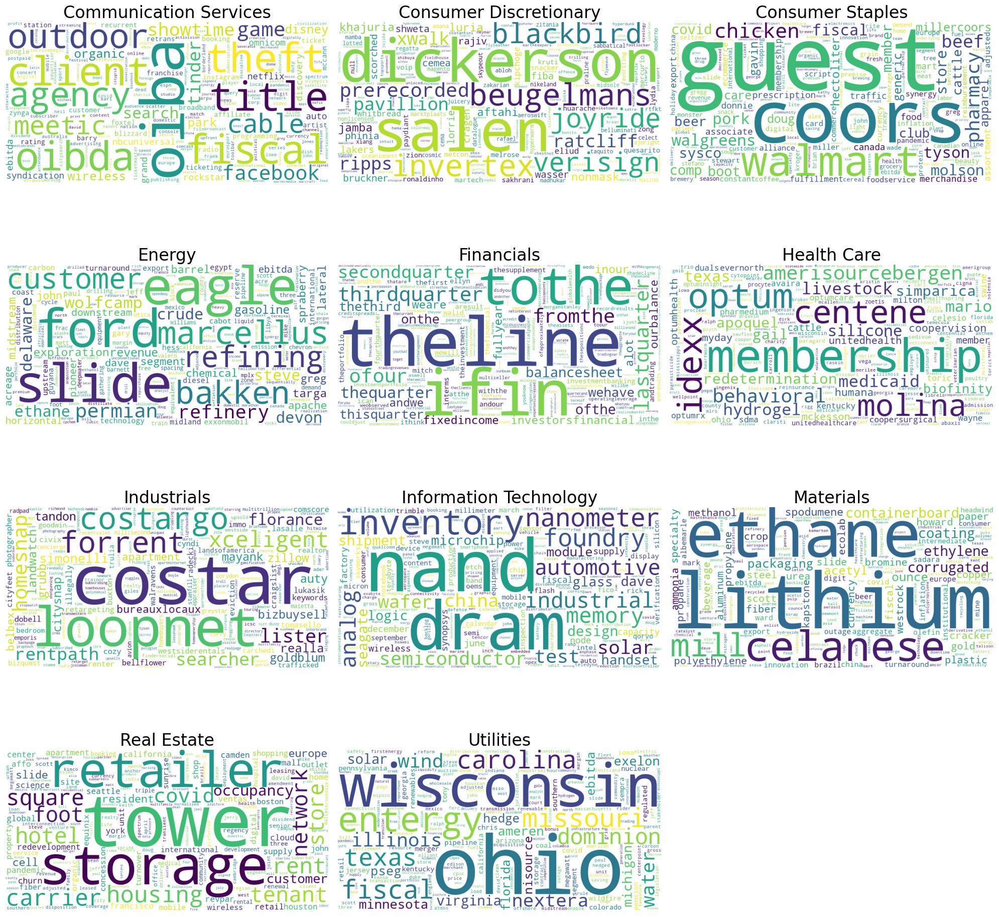

In [140]:
plot_wordclouds(lda_tfidf)

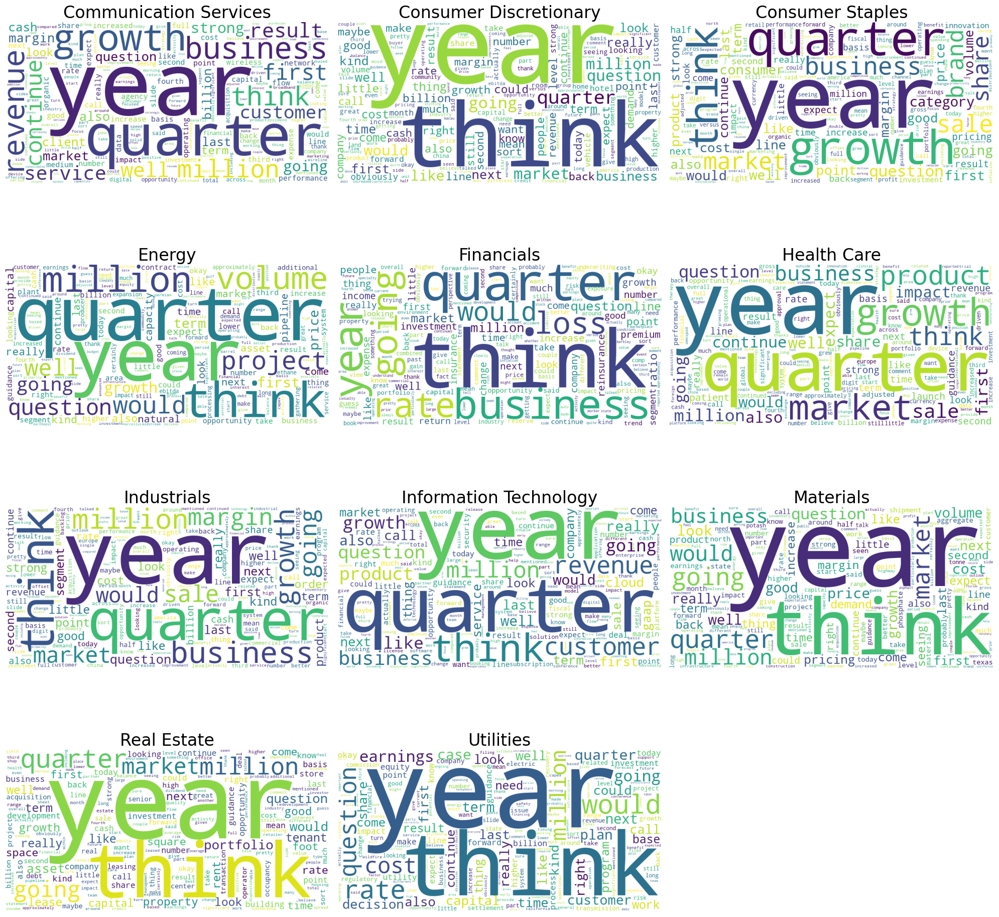

In [141]:
plot_wordclouds(lda_dtm)

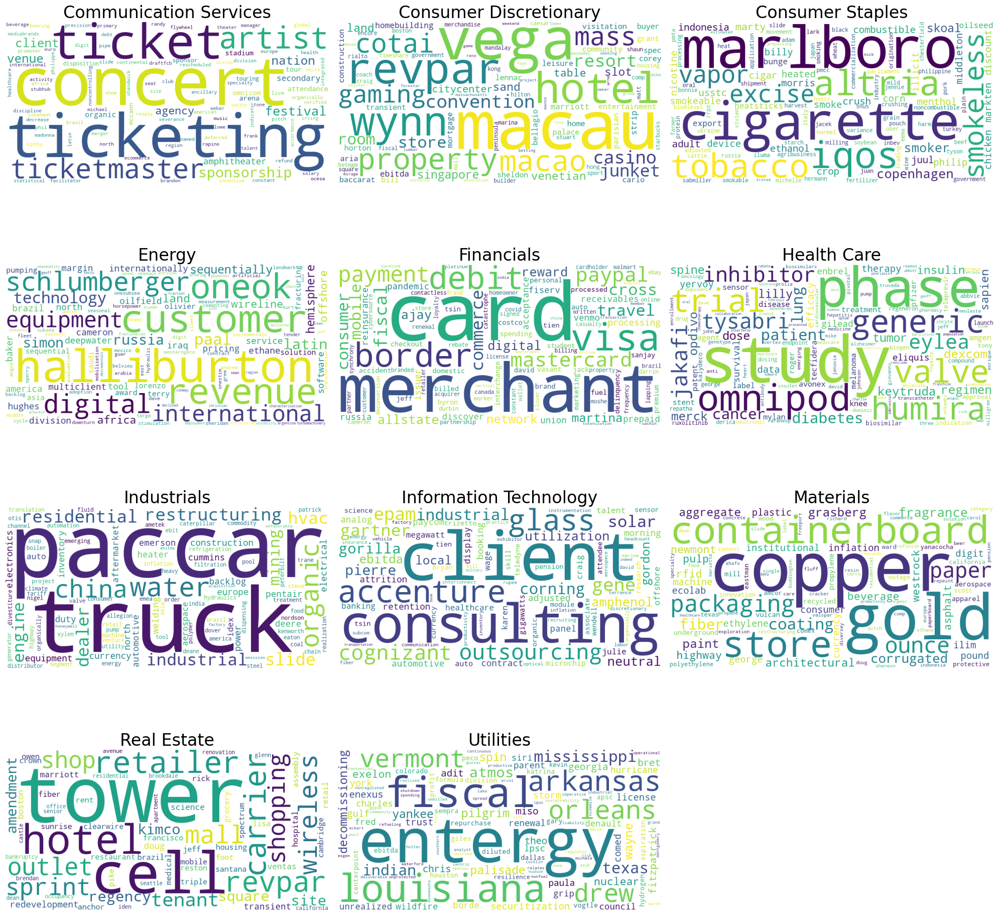

In [173]:
plot_wordclouds(lsi_tfidf)

## Below is our failed attempt on ELDA modelling
#### generates 1 stable topic after pruning due to TF-IDF corpus & Gensim moving this model to experimental due to stability issues

In [149]:
elda = ensemblelda.EnsembleLda.load("ELDA_S&P.model")

2023-06-19 01:41:59,660 : INFO : loading EnsembleLda object from ELDA_S&P.model
2023-06-19 01:42:03,892 : INFO : loading classic_model_representation recursively from ELDA_S&P.model.classic_model_representation.* with mmap=None
2023-06-19 01:42:03,895 : INFO : loading id2word recursively from ELDA_S&P.model.classic_model_representation.id2word.* with mmap=None
2023-06-19 01:42:03,898 : INFO : loading state recursively from ELDA_S&P.model.classic_model_representation.state.* with mmap=None
2023-06-19 01:42:03,906 : INFO : setting ignored attribute topic_model_class to None
2023-06-19 01:42:03,907 : INFO : EnsembleLda lifecycle event {'fname': 'ELDA_S&P.model', 'datetime': '2023-06-19T01:42:03.907248', 'gensim': '4.3.1', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'loaded'}


In [156]:
elda.print_topics

<bound method EnsembleLda.print_topics of <gensim.models.ensemblelda.EnsembleLda object at 0x000002271202F340>>

## Function to measure perplexity & UMass topic coherence

In [186]:
from gensim.models import CoherenceModel

def get_model_metrics(models, corpus, texts):
    metrics = []

    for sector, (model, corpus, dictionary) in models.items():
        if hasattr(model, 'log_perplexity'):
            perplexity = model.log_perplexity(corpus)
        else:
            perplexity = None

        coherence_model_umass = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence="u_mass")
        coherence_umass = coherence_model_umass.get_coherence()

        metrics.append({
            'Sector': sector,
            'Perplexity': perplexity,
            'Coherence (UMass)': coherence_umass,
        })

    return pd.DataFrame(metrics)


In [143]:
get_model_metrics(lda_tfidf)

2023-06-19 01:28:52,178 : INFO : -10.183 per-word bound, 1162.1 perplexity estimate based on a held-out corpus of 1374 documents with 23296 words
2023-06-19 01:28:56,454 : INFO : CorpusAccumulator accumulated stats from 1000 documents
C:\Users\Black\AppData\Local\Temp\ipykernel_21960\859112695.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({'Sector': sector, 'Perplexity': perplexity, 'UMass Topic Coherence': coherence}, ignore_index=True)
2023-06-19 01:29:12,751 : INFO : -10.074 per-word bound, 1077.9 perplexity estimate based on a held-out corpus of 3215 documents with 49581 words
2023-06-19 01:29:17,102 : INFO : CorpusAccumulator accumulated stats from 1000 documents
C:\Users\Black\AppData\Local\Temp\ipykernel_21960\859112695.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead

,Sector,Perplexity,UMass Topic Coherence
0,Communication Services,-10.182527,-10.963493
1,Consumer Discretionary,-10.074001,-2.824383
2,Consumer Staples,-10.151637,-9.451269
3,Energy,-10.109707,-9.457807
4,Financials,-9.904092,-5.046544
5,Health Care,-10.287624,-7.235433
6,Industrials,-10.068239,-2.822220
7,Information Technology,-10.186142,-6.843736
8,Materials,-10.114136,-9.335436
9,Real Estate,-10.072756,-10.711736


In [144]:
get_model_metrics(lda_dtm)

2023-06-19 01:32:08,978 : INFO : -7.258 per-word bound, 153.1 perplexity estimate based on a held-out corpus of 1374 documents with 17131337 words
2023-06-19 01:32:13,229 : INFO : CorpusAccumulator accumulated stats from 1000 documents
C:\Users\Black\AppData\Local\Temp\ipykernel_21960\859112695.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({'Sector': sector, 'Perplexity': perplexity, 'UMass Topic Coherence': coherence}, ignore_index=True)
2023-06-19 01:32:24,151 : INFO : -7.286 per-word bound, 156.1 perplexity estimate based on a held-out corpus of 3215 documents with 42079882 words
2023-06-19 01:32:28,488 : INFO : CorpusAccumulator accumulated stats from 1000 documents
C:\Users\Black\AppData\Local\Temp\ipykernel_21960\859112695.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

,Sector,Perplexity,UMass Topic Coherence
0,Communication Services,-7.258235,-0.399866
1,Consumer Discretionary,-7.286412,-0.133427
2,Consumer Staples,-7.236561,-0.484886
3,Energy,-7.197077,-0.283686
4,Financials,-7.189867,-0.147903
5,Health Care,-7.327315,-0.232591
6,Industrials,-7.249155,-0.136890
7,Information Technology,-7.226172,-0.145436
8,Materials,-7.211896,-0.176992
9,Real Estate,-7.222409,-0.286343
